In [1]:
# cloning STELLAR from github
!git clone -q https://github.com/microsoft/STELLAR.git

In [2]:
# checking folder structure of STELLAR
!ls -la /kaggle/working/STELLAR

total 56
drwxr-xr-x  6 root root  4096 Aug 25 21:01 .
drwxr-xr-x  4 root root  4096 Aug 25 21:01 ..
drwxr-xr-x 10 root root  4096 Aug 25 21:01 configs
drwxr-xr-x  8 root root  4096 Aug 25 21:01 .git
-rw-r--r--  1 root root   136 Aug 25 21:01 .gitignore
drwxr-xr-x  2 root root  4096 Aug 25 21:01 images
-rw-r--r--  1 root root  1066 Aug 25 21:01 LICENSE
-rw-r--r--  1 root root 14217 Aug 25 21:01 README.md
-rw-r--r--  1 root root   566 Aug 25 21:01 requirements.txt
-rw-r--r--  1 root root   542 Aug 25 21:01 SECURITY.md
drwxr-xr-x  7 root root  4096 Aug 25 21:01 src


In [3]:
# migrating to STELLAR
%cd /kaggle/working/STELLAR

/kaggle/working/STELLAR


In [44]:
# checking inside STELLAR - Not Preferred to Run
# !pwd
# !ls

/kaggle/working/STELLAR
configs  LICENSE    requirements.txt  src
images	 README.md  SECURITY.md       STELLAR


In [4]:
# Installing requirments.txt for STELLAR 
!pip install -q -r requirements.txt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.0/43.0 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.7/91.7 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.5/50.5 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.2 MB/s eta 0:00:00
ERROR: Ignored the following versions that require a different python version: 0.0.0 Requires-Python <3.11,>=3.8; 0.0.10 Requires-Python >=3.8,<3.9; 0.0.11 Requires-Python >=3.8,<3.9; 0.0.12 Requires-Python >=3.8,<3.9; 0.0.14 Requires-Python >=3.8,<3.9; 0.0.15 Requires-Python >=3.8,<3.9; 0.0.16 Requires-Python >=3.8,<3.9; 0.0.17 Requires-Python >=3.8,<3.9; 0.0.18 Requires-Python >=3.8,<3.9; 0.0.19 Requires-Python >=3.8,<3.9; 0.0.20 Requires-Python >=3.8,<3.9; 0.0.21 Requires-Python >=3.8,<3.9; 0.0.22 Requires-Python >=3.8,<3.9; 0.0.23 Requires-Python >=3.8,<3.9; 0.0.24 Requires-Python >=3.8,<3.9; 0.0.25 Requires-Python >=3.8,<3.9; 

In [5]:
# Installing safetensors for huggingface_hub for STELLAR working
!pip install -q huggingface_hub safetensors

In [86]:
# Looking more inside STELLAR-B16 depthwise - Do Not Run
# !find src -maxdepth 4 -type f | head -100

In [6]:
# Loading baseline STELLAR
import json
import torch
from huggingface_hub import hf_hub_download
from safetensors.torch import load_file
from src.models.stellar_model import STELLARModel # Loading the STELLAR-B16 model

repo = "microsoft/STELLAR"
config_path = hf_hub_download(
    repo_id=repo,
    filename="config.json"
)
with open(config_path, "r") as f:
    config = json.load(f)
print(config["models"].keys()) # Looking for all the STELLAR versions


# We'll be working with STELLAR-B16 model
cfg = config["models"]["stellar-b16"] 
print(cfg)

# Weights path for STELLAR-B16
weights_path = hf_hub_download(
    repo_id=repo,
    filename=cfg["weights"]
)
print(weights_path)

# Loading model with configuration
model = STELLARModel(
    num_sparse_tokens=cfg["num_sparse_tokens"],
    num_decoder_layers=cfg["num_decoder_layers"],
    spatial_temp=cfg["spatial_temp"],
    vit_pretrained=cfg["backbone"],
    do_recon=False,
    do_clustering=False,
    vq_model=None,
)

state = load_file(weights_path)
missing, unexpected = model.load_state_dict(
    state,
    strict=False
)
print("Missing keys:", len(missing))
print("Unexpected keys:", len(unexpected))


# Setting up device for evaluation
device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)
print("Device:", device)

model = model.to(device)
model.eval()


attention mode is flash


/kaggle/working/STELLAR/src/models/modules/quantizer/quantizer.py:53: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled=False)
/kaggle/working/STELLAR/src/models/modules/quantizer/quantizer.py:134: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled=False)
/kaggle/working/STELLAR/src/models/modules/quantizer/quantizer.py:154: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled=False)
/kaggle/working/STELLAR/src/models/modules/quantizer/quantizer.py:159: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @autocast(enabled=False)
/kaggle/working/STELLAR/src/models/modules/quantizer/quantizer.py:163: FutureWarning: `torch.cuda.amp.autocast(args..

config.json: 0.00B [00:00, ?B/s]

dict_keys(['stellar-b16', 'stellar-l16', 'stellar-h16', 'stellar-b8', 'stellar-b24'])
{'weights': 'stellar-b16.safetensors', 'category': 'main', 'backbone': 'facebook/vit-mae-base', 'image_size': 224, 'patch_size': 16, 'embed_dim': 768, 'num_sparse_tokens': 16, 'num_decoder_layers': 6, 'spatial_temp': 0.06, 'do_recon': True, 'do_clustering': True, 'do_cls': True, 'num_clusters': 16384, 'recon_type': 'vq'}


stellar-b16.safetensors:   0%|          | 0.00/483M [00:00<?, ?B/s]

/root/.cache/huggingface/hub/models--microsoft--STELLAR/snapshots/6794be9a20fb9d3944c5bcc6003512a347fa518f/stellar-b16.safetensors


config.json:   0%|          | 0.00/676 [00:00<?, ?B/s]

You are using a model of type vit_mae to instantiate a model of type vit. This is not supported for all configurations of models and can yield errors.


model.safetensors:   0%|          | 0.00/448M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/198 [00:00<?, ?it/s]

ViTModel LOAD REPORT from: facebook/vit-mae-base
Key                                                                              | Status     | 
---------------------------------------------------------------------------------+------------+-
decoder.decoder_layers.{0, 1, 2, 3, 4, 5, 6, 7}.layernorm_after.weight           | UNEXPECTED | 
decoder.decoder_layers.{0, 1, 2, 3, 4, 5, 6, 7}.attention.output.dense.bias      | UNEXPECTED | 
decoder.decoder_layers.{0, 1, 2, 3, 4, 5, 6, 7}.attention.attention.query.weight | UNEXPECTED | 
decoder.decoder_layers.{0, 1, 2, 3, 4, 5, 6, 7}.attention.attention.query.bias   | UNEXPECTED | 
decoder.decoder_layers.{0, 1, 2, 3, 4, 5, 6, 7}.output.dense.bias                | UNEXPECTED | 
decoder.decoder_layers.{0, 1, 2, 3, 4, 5, 6, 7}.intermediate.dense.bias          | UNEXPECTED | 
decoder.decoder_layers.{0, 1, 2, 3, 4, 5, 6, 7}.layernorm_before.weight          | UNEXPECTED | 
decoder.decoder_layers.{0, 1, 2, 3, 4, 5, 6, 7}.attention.attention.key.weight

Missing keys: 0
Unexpected keys: 118
Device: cuda


STELLARModel(
  (encoder): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=True)
            (intermediate_act_

In [8]:
# Sanity test of STELLAR-B16 on dummy example
image = torch.rand(
    1, 3, 224, 224,
    device=device
)

with torch.no_grad():
    out = model.encode(image)

for key, value in out.items():
    if torch.is_tensor(value):
        print(key, value.shape)
# Here sparse is "what" (semantic), Spatial is "where" (localization)

sparse torch.Size([1, 16, 768])
spatial torch.Size([1, 196, 16])
concat torch.Size([1, 16, 964])
lowrank torch.Size([1, 196, 768])
dense torch.Size([1, 196, 768])
cls torch.Size([1, 1, 768])
peak_dist torch.Size([1, 16])


In [87]:
# Looking inside segmentation_dataset.py - Do Not Run
# !sed -n '1,260p' src/datasets/segmentation_dataset.py

In [88]:
# Looking inside segmentation_evaluator.py - Do Not Run
# !sed -n '1,320p' src/evaluators/segmentation_evaluator.py

In [89]:
# Looking inside segmentation.py - Do Not Run
# !sed -n '1,320p' src/models/downstream/segmentation.py

In [90]:
# Looking inside the types of data in GlaS dataset - Do Not Run
# !find /kaggle/input -type f | grep -Ei "glas|gland|train|test|mask|xml|bmp|png|jpg" | head -200

In [91]:
# Looking inside kaggle file to set source path - Do Not Run
# !find /kaggle/input -maxdepth 3 -type d

In [33]:
# Checking image, mask, mask array size from GlaS dataset - Not Prefered to Run

# from PIL import Image
# import numpy as np
# import os

# root = "/kaggle/input/datasets/sani84/glasmiccai2015-gland-segmentation/Warwick_QU_Dataset"

# img_path = os.path.join(root, "train_1.bmp")
# mask_path = os.path.join(root, "train_1_anno.bmp")

# img = Image.open(img_path)
# mask = Image.open(mask_path)

# print("Image:")
# print("  mode:", img.mode)
# print("  size:", img.size)

# print("\nMask:")
# print("  mode:", mask.mode)
# print("  size:", mask.size)

# mask_np = np.array(mask)

# print("\nMask array:")
# print("  shape:", mask_np.shape)
# print("  dtype:", mask_np.dtype)
# print("  unique:", np.unique(mask_np))

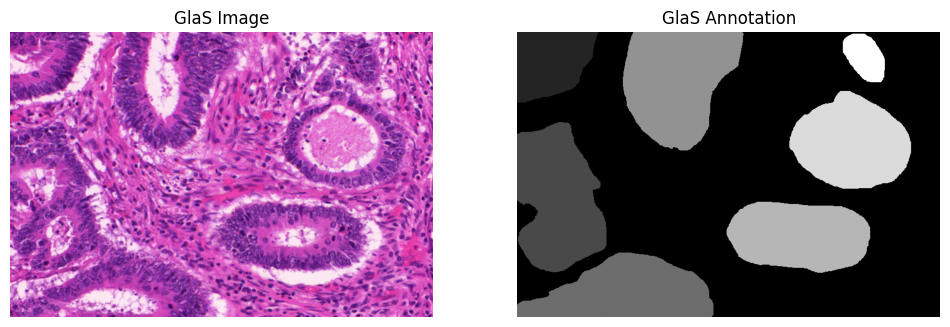

In [9]:
# Visualizing Glas image and GlaS annotaiton image

import matplotlib.pyplot as plt
from PIL import Image
import os

root = "/kaggle/input/datasets/sani84/glasmiccai2015-gland-segmentation/Warwick_QU_Dataset"

img = Image.open(os.path.join(root, "train_1.bmp"))
mask = Image.open(os.path.join(root, "train_1_anno.bmp"))

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(img)
plt.title("GlaS Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mask, cmap="gray")
plt.title("GlaS Annotation")
plt.axis("off")

plt.show()

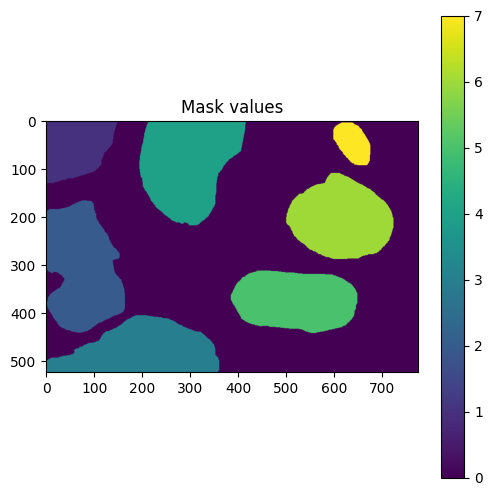

In [11]:
# Visualizing mask values of GlaS dataset - Run At Last

import numpy as np
mask_np = np.array(mask)
plt.figure(figsize=(6, 6))
plt.imshow(mask_np)
plt.colorbar()
plt.title("Mask values")
plt.show()

In [13]:
# Total number of masked across each image - Not Preferred to Run

# from PIL import Image
# import numpy as np
# import os
# from collections import Counter

# root = "/kaggle/input/datasets/sani84/glasmiccai2015-gland-segmentation/Warwick_QU_Dataset"

# mask_files = [
#     f for f in os.listdir(root)
#     if f.endswith("_anno.bmp")
# ]

# print("Number of masks:", len(mask_files))

# all_values = Counter()

# for fname in mask_files:
#     mask = np.array(Image.open(os.path.join(root, fname)))
#     values = np.unique(mask)

#     all_values.update(values.tolist())

# print("\nAll mask values encountered:")
# print(sorted(all_values.keys()))

# print("\nNumber of images containing each value:")
# for value in sorted(all_values):
#     count = sum(
#         value in np.unique(
#             np.array(Image.open(os.path.join(root, fname)))
#         )
#         for fname in mask_files
#     )
#     print(f"  {value}: {count}")

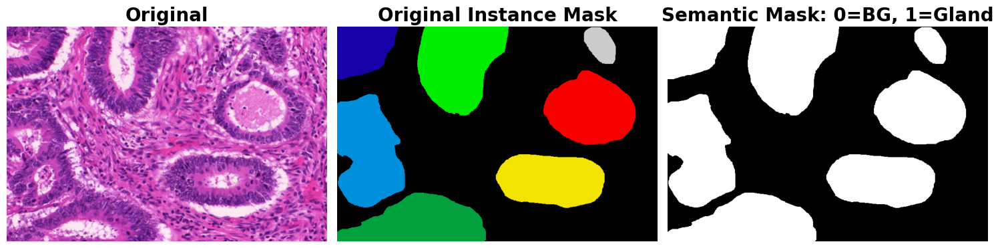

Original: [0 1 2 3 4 5 6 7]
Semantic: [0 1]


In [18]:
# Visualizing original, original masked instance and semantic mask images - Run At Last

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

root = "/kaggle/input/datasets/sani84/glasmiccai2015-gland-segmentation/Warwick_QU_Dataset"

img = Image.open(os.path.join(root, "train_1.bmp"))
instance_mask = np.array(
    Image.open(os.path.join(root, "train_1_anno.bmp"))
)

semantic_mask = (instance_mask > 0).astype(np.uint8)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img)
plt.title("Original",   fontsize=20,
    fontweight="bold")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(instance_mask, cmap="nipy_spectral")
plt.title("Original Instance Mask",   fontsize=20,
    fontweight="bold")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(semantic_mask, cmap="gray")
plt.title("Semantic Mask: 0=BG, 1=Gland",   fontsize=20,
    fontweight="bold")
plt.axis("off")

plt.tight_layout()
# SAVE HIGH-QUALITY IMAGE
plt.savefig(
    "/kaggle/working/original_original_instance_mask_semantic_mask.png",
    dpi=600,
    bbox_inches="tight"
)
plt.show()

print("Original:", np.unique(instance_mask))
print("Semantic:", np.unique(semantic_mask))

In [64]:
# Creating a GlaSSegmentationDataset class - Do Not Run
# import os
# import numpy as np
# import torch

# from PIL import Image
# from torch.utils.data import Dataset

# from torchvision.transforms import functional as TF
# from torchvision.transforms import InterpolationMode


# class GlaSSegmentationDataset(Dataset):

#     def __init__(
#         self,
#         root,
#         split="train",
#         resolution=224,
#         crop_scale=0.5,
#     ):
#         self.root = root
#         self.split = split
#         self.resolution = resolution
#         self.crop_scale = crop_scale

#         if split == "train":

#             image_files = [
#                 f for f in os.listdir(root)
#                 if f.startswith("train_")
#                 and f.endswith(".bmp")
#                 and not f.endswith("_anno.bmp")
#             ]

#         elif split == "testA":

#             image_files = [
#                 f for f in os.listdir(root)
#                 if f.startswith("testA_")
#                 and f.endswith(".bmp")
#                 and not f.endswith("_anno.bmp")
#             ]

#         elif split == "testB":

#             image_files = [
#                 f for f in os.listdir(root)
#                 if f.startswith("testB_")
#                 and f.endswith(".bmp")
#                 and not f.endswith("_anno.bmp")
#             ]

#         else:
#             raise ValueError(
#                 f"Unknown split: {split}. "
#                 "Expected train, testA or testB."
#             )

#         self.samples = []

#         for image_file in sorted(image_files):

#             mask_file = image_file.replace(
#                 ".bmp",
#                 "_anno.bmp"
#             )

#             image_path = os.path.join(
#                 root,
#                 image_file
#             )

#             mask_path = os.path.join(
#                 root,
#                 mask_file
#             )

#             if not os.path.exists(mask_path):
#                 raise FileNotFoundError(
#                     f"Missing mask for {image_file}: "
#                     f"{mask_path}"
#                 )

#             self.samples.append(
#                 (image_path, mask_path)
#             )

#         print(
#             f"GlaS {split}: "
#             f"{len(self.samples)} image/mask pairs"
#         )

#     def __len__(self):
#         return len(self.samples)

#     def _convert_mask(self, mask):

#         mask = np.array(mask)

#         # Instance IDs:
#         #
#         # 0       -> background
#         # 1..32   -> gland instances
#         #
#         # Convert to semantic segmentation:
#         #
#         # 0       -> background
#         # >0      -> gland

#         mask = (mask > 0).astype(np.uint8)

#         return torch.from_numpy(mask).long()

#     def __getitem__(self, idx):

#         image_path, mask_path = self.samples[idx]

#         # ------------------------------------------------
#         # Load
#         # ------------------------------------------------

#         image = Image.open(image_path).convert("RGB")
#         mask = Image.open(mask_path).convert("L")

#         # ------------------------------------------------
#         # Convert instance mask -> semantic mask
#         # ------------------------------------------------

#         mask = self._convert_mask(mask)

#         # ------------------------------------------------
#         # Training
#         # ------------------------------------------------

#         if self.split == "train":

#             width, height = TF.get_image_size(image)

#             scale = torch.empty(1).uniform_(
#                 self.crop_scale,
#                 1.0
#             ).item()

#             crop_h = int(height * scale)
#             crop_w = int(width * scale)

#             crop_h = max(1, min(crop_h, height))
#             crop_w = max(1, min(crop_w, width))

#             if height == crop_h:
#                 top = 0
#             else:
#                 top = torch.randint(
#                     0,
#                     height - crop_h + 1,
#                     (1,)
#                 ).item()

#             if width == crop_w:
#                 left = 0
#             else:
#                 left = torch.randint(
#                     0,
#                     width - crop_w + 1,
#                     (1,)
#                 ).item()

#             # Image: BICUBIC
#             image = TF.resized_crop(
#                 image,
#                 top,
#                 left,
#                 crop_h,
#                 crop_w,
#                 [self.resolution, self.resolution],
#                 interpolation=InterpolationMode.BICUBIC,
#             )

#             # Mask: NEAREST
#             mask = TF.resized_crop(
#                 mask.unsqueeze(0).float(),
#                 top,
#                 left,
#                 crop_h,
#                 crop_w,
#                 [self.resolution, self.resolution],
#                 interpolation=InterpolationMode.NEAREST,
#             ).squeeze(0).long()

#             # Horizontal flip
#             if torch.rand(1).item() < 0.5:

#                 image = TF.hflip(image)
#                 mask = TF.hflip(mask)

#         # ------------------------------------------------
#         # Test / validation
#         # ------------------------------------------------

#         else:

#             crop_res = int(
#                 self.resolution * 256 / 224
#             )

#             image = TF.resize(
#                 image,
#                 [crop_res, crop_res],
#                 interpolation=InterpolationMode.BICUBIC,
#             )

#             mask = TF.resize(
#                 mask.unsqueeze(0).float(),
#                 [crop_res, crop_res],
#                 interpolation=InterpolationMode.NEAREST,
#             ).squeeze(0).long()

#             image = TF.center_crop(
#                 image,
#                 [self.resolution, self.resolution]
#             )

#             mask = TF.center_crop(
#                 mask,
#                 [self.resolution, self.resolution]
#             )

#         # ------------------------------------------------
#         # Image -> tensor
#         # ------------------------------------------------

#         image = TF.to_tensor(image)

#         return {
#             "image": image.clamp(0, 1),
#             "labels": mask,
#             "filename": idx,
#         }
        

In [19]:
# Creating GlaSSegmentationDataset class 
import os
import numpy as np
import torch

from PIL import Image
from torch.utils.data import Dataset
from torchvision.transforms import functional as TF
from torchvision.transforms import InterpolationMode


class GlaSSegmentationDataset(Dataset):

    def __init__(
        self,
        root,
        split="train",
        resolution=224,
        crop_scale=0.5,
        augment=False,
    ):
        self.root = root
        self.split = split
        self.resolution = resolution
        self.crop_scale = crop_scale
        self.augment = augment


        # Select images belonging to the official split
        if split == "train":
            image_files = [
                f for f in os.listdir(root)
                if f.startswith("train_")
                and f.endswith(".bmp")
                and not f.endswith("_anno.bmp")
            ]
            
        elif split == "testA":
            image_files = [
                f for f in os.listdir(root)
                if f.startswith("testA_")
                and f.endswith(".bmp")
                and not f.endswith("_anno.bmp")
            ]

        elif split == "testB":
            image_files = [
                f for f in os.listdir(root)
                if f.startswith("testB_")
                and f.endswith(".bmp")
                and not f.endswith("_anno.bmp")
            ]

        else:
            raise ValueError(
                f"Unknown split: {split}. "
                "Expected train, testA or testB."
            )

        # Build image/mask pairs
        self.samples = []
        for image_file in sorted(image_files):
            mask_file = image_file.replace(
                ".bmp",
                "_anno.bmp"
            )
            image_path = os.path.join(
                root,
                image_file
            )
            mask_path = os.path.join(
                root,
                mask_file
            )
            if not os.path.exists(mask_path):
                raise FileNotFoundError(
                    f"Missing mask for {image_file}: "
                    f"{mask_path}"
                )
            self.samples.append(
                (image_path, mask_path)
            )
        print(
            f"GlaS {split}: "
            f"{len(self.samples)} image/mask pairs | "
            f"augment={self.augment}"
        )
        
    def __len__(self):
        return len(self.samples)

 
    # Instance mask → binary semantic mask
    def _convert_mask(self, mask):
        mask = np.array(mask)

        # Original:
        # 0      = background
        # 1..32  = individual gland instances
        #
        # Semantic:
        # 0 = background
        # 1 = gland

        mask = (mask > 0).astype(np.uint8)
        return torch.from_numpy(mask).long()


    # Training augmentation
    def _train_transform(self, image, mask):
        width, height = TF.get_image_size(image)
        
        # Random crop scale
        scale = torch.empty(1).uniform_(
            self.crop_scale,
            1.0
        ).item()

        crop_h = int(height * scale)
        crop_w = int(width * scale)

        crop_h = max(1, min(crop_h, height))
        crop_w = max(1, min(crop_w, width))

        # Random crop position
        if height == crop_h:
            top = 0
        else:
            top = torch.randint(
                0,
                height - crop_h + 1,
                (1,)
            ).item()

        if width == crop_w:
            left = 0
        else:
            left = torch.randint(
                0,
                width - crop_w + 1,
                (1,)
            ).item()

        # Image: bicubic
        image = TF.resized_crop(
            image,
            top,
            left,
            crop_h,
            crop_w,
            [self.resolution, self.resolution],
            interpolation=InterpolationMode.BICUBIC,
        )


        # Mask: nearest-neighbor
        mask = TF.resized_crop(
            mask.unsqueeze(0).float(),
            top,
            left,
            crop_h,
            crop_w,
            [self.resolution, self.resolution],
            interpolation=InterpolationMode.NEAREST,
        ).squeeze(0).long()

     
        # Random horizontal flip
        if torch.rand(1).item() < 0.5:

            image = TF.hflip(image)
            mask = TF.hflip(mask)

        return image, mask

   
    # Deterministic validation/test transform
    def _eval_transform(self, image, mask):

        crop_res = int(
            self.resolution * 256 / 224
        )

        # Image: bicubic
        image = TF.resize(
            image,
            [crop_res, crop_res],
            interpolation=InterpolationMode.BICUBIC,
        )

        # Mask: nearest
        mask = TF.resize(
            mask.unsqueeze(0).float(),
            [crop_res, crop_res],
            interpolation=InterpolationMode.NEAREST,
        ).squeeze(0).long()

        # Center crop
        image = TF.center_crop(
            image,
            [self.resolution, self.resolution]
        )

        mask = TF.center_crop(
            mask,
            [self.resolution, self.resolution]
        )
        return image, mask

    
    # Get item
    def __getitem__(self, idx):

        image_path, mask_path = self.samples[idx]

        # Load image and mask
        image = Image.open(
            image_path
        ).convert("RGB")

        mask = Image.open(
            mask_path
        ).convert("L")

        # Instance → semantic
        mask = self._convert_mask(mask)

    
        # Apply transform
        if self.augment:
            image, mask = self._train_transform(
                image,
                mask
            )

        else:
            image, mask = self._eval_transform(
                image,
                mask
            )


        # Image → tensor
        image = TF.to_tensor(image)

        return {
            "image": image.clamp(0, 1),
            "labels": mask,
            "filename": idx,
        }

In [21]:
# Creating glas_train_full dataset from GlasSegmentationDataset class - Do Not Run
# ROOT = "/kaggle/input/datasets/sani84/glasmiccai2015-gland-segmentation/Warwick_QU_Dataset"

# glas_train_full = GlaSSegmentationDataset(
#     root=ROOT,
#     split="train",
#     resolution=224,
#     augment=False,
# )

In [13]:
# Creating a fixed 70/15 split for train and validation subset - Do Not Run
# from torch.utils.data import random_split
# SEED = 42

# generator = torch.Generator().manual_seed(SEED)
# train_subset, val_subset = random_split(
#     glas_train_full,
#     [70, 15],
#     generator=generator,
# )

In [20]:
# Creating glas_train_aug, glas_train_eval for SEED = 42
# Also creating train_indices, val_indices

# ROOT path of GlaS dataset
ROOT = "/kaggle/input/datasets/sani84/glasmiccai2015-gland-segmentation/Warwick_QU_Dataset"

glas_train_aug = GlaSSegmentationDataset(
    root=ROOT,
    split="train",
    resolution=224,
    augment=True,
)

glas_train_eval = GlaSSegmentationDataset(
    root=ROOT,
    split="train",
    resolution=224,
    augment=False,
)

SEED = 42
generator = torch.Generator().manual_seed(SEED)
indices = torch.randperm(
    len(glas_train_aug),
    generator=generator
).tolist()

train_indices = indices[:70]
val_indices = indices[70:]
print("Train indices:", len(train_indices))
print("Validation indices:", len(val_indices))

print("Train examples:", train_indices[:10])
print("Val examples:", val_indices[:10])

GlaS train: 85 image/mask pairs | augment=True
GlaS train: 85 image/mask pairs | augment=False
Train indices: 70
Validation indices: 15
Train examples: [47, 24, 37, 11, 13, 60, 17, 27, 71, 22]
Val examples: [23, 16, 75, 55, 39, 68, 41, 3, 62, 35]


In [ ]:
# Creating train_subset, val_subset
# Creating testA_dataset, testB_dataset

# Can be used in training model
from torch.utils.data import Subset

train_subset = Subset(
    glas_train_aug,
    train_indices
)

val_subset = Subset(
    glas_train_eval,
    val_indices
)

# For testing purpose these testA_dataset, testB_dataset will be used
testA_dataset = GlaSSegmentationDataset(
    root=ROOT,
    split="testA",
    resolution=224,
    augment=False,
)

testB_dataset = GlaSSegmentationDataset(
    root=ROOT,
    split="testB",
    resolution=224,
    augment=False,
)

GlaS testA: 60 image/mask pairs | augment=False
GlaS testB: 20 image/mask pairs | augment=False


In [20]:
# Creating Test A, Test B deterministicly - Do Not Run
# testA_dataset = GlaSSegmentationDataset(
#     root=ROOT,
#     split="testA",
#     resolution=224,
#     augment=False,
# )

# testB_dataset = GlaSSegmentationDataset(
#     root=ROOT,
#     split="testB",
#     resolution=224,
#     augment=False,
# )

In [22]:
# Creating probe_train_loader, probe_val_loader
# Creating testA_loader, testB_loader
from torch.utils.data import DataLoader

probe_train_loader = DataLoader(
    train_subset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
)

probe_val_loader = DataLoader(
    val_subset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

testA_loader = DataLoader(
    testA_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

testB_loader = DataLoader(
    testB_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

In [46]:
# Verifying that validation is actually deterministic - Not Preferred to Run
# sample1 = val_subset[0]
# sample2 = val_subset[0]

# print(
#     "Image identical:",
#     torch.equal(
#         sample1["image"],
#         sample2["image"]
#     )
# )

# print(
#     "Mask identical:",
#     torch.equal(
#         sample1["labels"],
#         sample2["labels"]
#     )
# )

In [50]:
# Image and Mask details from glas_train_aug - Not Preferred to Run
# Similarly can be done for glas_train_eval

# sample = glas_train_aug[0]

# print("Image:")
# print(" shape:", sample["image"].shape)
# print(" dtype:", sample["image"].dtype)
# print(" min:", sample["image"].min())
# print(" max:", sample["image"].max())

# print("\nMask:")
# print(" shape:", sample["labels"].shape)
# print(" dtype:", sample["labels"].dtype)
# print(" unique:", torch.unique(sample["labels"]))

In [24]:
# Visualizing augmented GlaS image and semantic mask from glas_train_aug - Run At Last
# Similary done for glas_train_eval

# import matplotlib.pyplot as plt
# sample = glas_train_aug[0]
# image = sample["image"]
# mask = sample["labels"]

# plt.figure(figsize=(10, 5))
# plt.subplot(1, 2, 1)
# plt.imshow(
#     image.permute(1, 2, 0)
# )
# plt.title("Augmented GlaS Image")
# plt.axis("off")


# plt.subplot(1, 2, 2)
# plt.imshow(
#     mask,
#     cmap="gray",
#     vmin=0,
#     vmax=1
# )

# plt.title("Augmented Semantic Mask")
# plt.axis("off")

# plt.tight_layout()
# plt.show()

In [55]:
# Input shape of probe_train_laoder - Not Preferred to Run
# batch = next(iter(probe_train_loader))
# images = batch["image"][:2].to(device)
# print("Input shape:", images.shape)

In [98]:
# isinstance - part 1 - Do Not Run

# if isinstance(outputs, dict):

#     print("\nSTELLAR output keys:")

#     for key, value in outputs.items():

#         if torch.is_tensor(value):

#             print(
#                 f"{key:20s} "
#                 f"shape={tuple(value.shape)} "
#                 f"dtype={value.dtype}"
#             )

#         else:

#             print(
#                 f"{key:20s} "
#                 f"type={type(value)}"
#             )

# else:

#     print(outputs)

In [99]:
# isinstance - part 2 - Do Not Run
# if isinstance(outputs, dict):

#     for key, value in outputs.items():

#         if torch.is_tensor(value):

#             print(
#                 f"\n{key}"
#             )
#             print(
#                 "shape:",
#                 value.shape
#             )
#             print(
#                 "mean:",
#                 value.mean().item()
#             )
#             print(
#                 "std:",
#                 value.std().item()
#             )
#             print(
#                 "min:",
#                 value.min().item()
#             )
#             print(
#                 "max:",
#                 value.max().item()
#             )

In [100]:
# isinstance - part 3 - Do Not Run
# batch = next(iter(train_loader))
# images = batch["image"][:2].to(device)

# with torch.no_grad():
#     outputs = model.encode({
#         "image": images
#     })

# print("Output type:", type(outputs))

# if isinstance(outputs, dict):
#     for key, value in outputs.items():

#         if torch.is_tensor(value):
#             print(
#                 f"{key:20s} "
#                 f"shape={tuple(value.shape)} "
#                 f"dtype={value.dtype}"
#             )
#         else:
#             print(
#                 f"{key:20s} "
#                 f"type={type(value)}"
#             )

In [132]:
# SegmentationProbing - Do Not Run
# import torch
# seg_model = SegmentationProbing(
#     model_backbone=model,
#     is_baseline=False,
#     feature_key="dense",
#     feature_dim=768,
#     num_classes=2,
#     freeze_backbone=True,
#     freeze_model=False,
#     resize_output=(224, 224),
# ).to(device)

# batch = next(iter(train_loader))

# with torch.no_grad():
#     outputs = seg_model({
#         "image": batch["image"].to(device)
#     })

# print("Prediction:", outputs["predictions"].shape)
# print("Feature:", outputs["dense"].shape)

# pred = torch.argmax(
#     outputs["predictions"],
#     dim=1
# )

# print("Prediction labels:", torch.unique(pred))

## Dense

In [25]:
# Creating a segmentaton model for downstream task for "dense" features
from src.models.downstream.segmentation import SegmentationProbing
print(SegmentationProbing)

dense_model = SegmentationProbing(
    model_backbone=model,
    is_baseline=False,
    feature_key="dense",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

for name, param in dense_model.named_parameters():
    if param.requires_grad:
        print("TRAINABLE:", name)


<class 'src.models.downstream.segmentation.SegmentationProbing'>
TRAINABLE: decoder_head.0.weight
TRAINABLE: decoder_head.0.bias
TRAINABLE: decoder_head.1.weight
TRAINABLE: decoder_head.1.bias


In [26]:
# We will be use cross-entropy loss and AdamW optimizer for training purpose
import torch.nn as nn
criterion = nn.CrossEntropyLoss() # cross-entropy loss
# We'll be using AdamW optimizer
optimizer = torch.optim.AdamW(
    filter(
        lambda p: p.requires_grad,
        dense_model.parameters()
    ),
    lr=1e-3,
    weight_decay=1e-4,
)


In [27]:
# segmentation metrics contain Dice, IoU, Accuracy
import numpy as np

def segmentation_metrics(pred, target, num_classes=2):
    pred = pred.detach().cpu().numpy().reshape(-1)
    target = target.detach().cpu().numpy().reshape(-1)

    metrics = {}
    ious = []

    for cls in range(num_classes):
        pred_cls = pred == cls
        target_cls = target == cls
        intersection = np.logical_and(
            pred_cls,
            target_cls
        ).sum()

        union = np.logical_or(
            pred_cls,
            target_cls
        ).sum()

        if union == 0:
            iou = np.nan
        else:
            iou = intersection / union

        ious.append(iou)

    # Background + gland
    metrics["background_iou"] = ious[0]
    metrics["gland_iou"] = ious[1]

    valid_ious = [
        x for x in ious
        if not np.isnan(x)
    ]

    metrics["miou"] = np.mean(valid_ious)

    # Gland Dice
    pred_gland = pred == 1
    target_gland = target == 1

    intersection = np.logical_and(
        pred_gland,
        target_gland
    ).sum()

    pred_area = pred_gland.sum()
    target_area = target_gland.sum()
    denominator = pred_area + target_area

    if denominator == 0:
        dice = 1.0
    else:
        dice = (
            2.0 * intersection / denominator
        )

    metrics["gland_dice"] = dice
    metrics["pixel_accuracy"] = (
        pred == target
    ).mean()

    return metrics

## Dense running for single epoch

In [28]:
# Training STELLAR's dense_model for one single epoch to check if it's working or not
dense_model.train()
batch = next(iter(probe_train_loader))

images = batch["image"].to(device)
labels = batch["labels"].to(device)

optimizer.zero_grad()
outputs = dense_model({
    "image": images
})

logits = outputs["predictions"]
loss = criterion(
    logits,
    labels
)

print("Logits:", logits.shape)
print("Labels:", labels.shape)
print("Loss:", loss.item())

loss.backward()
optimizer.step()

print("One optimization step completed.")

Logits: torch.Size([4, 2, 224, 224])
Labels: torch.Size([4, 224, 224])
Loss: 0.6515569686889648
One optimization step completed.


In [29]:
# Checking weights and bias of decoder head
for name, param in dense_model.named_parameters():
    if param.requires_grad:
        print(
            name,
            "grad:",
            None if param.grad is None
            else param.grad.norm().item()
        )

decoder_head.0.weight grad: 0.07552359253168106
decoder_head.0.bias grad: 0.14200468361377716
decoder_head.1.weight grad: 3.3373029232025146
decoder_head.1.bias grad: 0.2387014627456665


## Dense running for larger epoch

In [30]:
# Reinitializing dense segmentation model for training larger epochs
dense_model = SegmentationProbing(
    model_backbone=model,
    is_baseline=False,
    feature_key="dense",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

optimizer = torch.optim.AdamW(
    filter(
        lambda p: p.requires_grad,
        dense_model.parameters()
    ),
    lr=1e-3,
    weight_decay=1e-4,
)
criterion = torch.nn.CrossEntropyLoss()

In [31]:
# Broiler plate running code for larger epochs
def run_epoch(
    model,
    loader,
    optimizer=None,
    criterion=None,
    device="cuda",
):
    is_training = optimizer is not None
    if is_training:
        model.train()
    else:
        model.eval()

    total_loss = 0.0
    all_preds = []
    all_labels = []

    for batch in loader:
        images = batch["image"].to(device)
        labels = batch["labels"].to(device)

        if is_training:
            optimizer.zero_grad()

        with torch.set_grad_enabled(is_training):

            outputs = model({
                "image": images
            })
            
            logits = outputs["predictions"]
            loss = criterion(
                logits,
                labels
            )

            if is_training:
                loss.backward()
                optimizer.step()

        total_loss += loss.item() * images.size(0)
        preds = torch.argmax(
            logits,
            dim=1
        )

        all_preds.append(
            preds.detach().cpu()
        )

        all_labels.append(
            labels.detach().cpu()
        )

    all_preds = torch.cat(all_preds, dim=0)
    all_labels = torch.cat(all_labels, dim=0)

    metrics = segmentation_metrics(
        all_preds,
        all_labels
    )

    metrics["loss"] = (
        total_loss / len(loader.dataset)
    )
    return metrics

In [32]:
# We'll keep epochs as 50 for all training, to make graphs good visualization stuffs
num_epochs = 50 # Tunable metric
best_val_dice = -1.0 # Tunable metric
history = []

for epoch in range(num_epochs):
    
    train_metrics = run_epoch(
        dense_model,
        probe_train_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=device,
    )

    val_metrics = run_epoch(
        dense_model,
        probe_val_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    row = {
        "epoch": epoch + 1,

        "train_loss": train_metrics["loss"],
        "train_dice": train_metrics["gland_dice"],
        "train_iou": train_metrics["gland_iou"],
        "train_miou": train_metrics["miou"],

        "val_loss": val_metrics["loss"],
        "val_dice": val_metrics["gland_dice"],
        "val_iou": val_metrics["gland_iou"],
        "val_miou": val_metrics["miou"],
    }

    history.append(row)

    print(
        f"Epoch {epoch+1:02d}/{num_epochs} | "
        f"Train Loss: {train_metrics['loss']:.4f} | "
        f"Train Dice: {train_metrics['gland_dice']:.4f} | "
        f"Train mIoU: {train_metrics['miou']:.4f} | "
        f"Val Loss: {val_metrics['loss']:.4f} | "
        f"Val Dice: {val_metrics['gland_dice']:.4f} | "
        f"Val mIoU: {val_metrics['miou']:.4f}"
    )

    if val_metrics["gland_dice"] > best_val_dice:

        best_val_dice = val_metrics["gland_dice"]

        torch.save(
            dense_model.state_dict(),
            "/kaggle/working/stellar_dense_glas_probe_best.pth"
        )

        print(
            f" Saved best checkpoint "
            f"(Val Dice = {best_val_dice:.4f})"
        )


Epoch 01/50 | Train Loss: 0.6355 | Train Dice: 0.6282 | Train mIoU: 0.4513 | Val Loss: 0.5316 | Val Dice: 0.7118 | Val mIoU: 0.5805
 Saved best checkpoint (Val Dice = 0.7118)
Epoch 02/50 | Train Loss: 0.4789 | Train Dice: 0.7647 | Train mIoU: 0.6155 | Val Loss: 0.4342 | Val Dice: 0.7920 | Val mIoU: 0.6590
 Saved best checkpoint (Val Dice = 0.7920)
Epoch 03/50 | Train Loss: 0.4151 | Train Dice: 0.8077 | Train mIoU: 0.6769 | Val Loss: 0.4030 | Val Dice: 0.8076 | Val mIoU: 0.6844
 Saved best checkpoint (Val Dice = 0.8076)
Epoch 04/50 | Train Loss: 0.4011 | Train Dice: 0.8207 | Train mIoU: 0.6906 | Val Loss: 0.3846 | Val Dice: 0.8185 | Val mIoU: 0.7003
 Saved best checkpoint (Val Dice = 0.8185)
Epoch 05/50 | Train Loss: 0.3825 | Train Dice: 0.8302 | Train mIoU: 0.7068 | Val Loss: 0.3660 | Val Dice: 0.8264 | Val mIoU: 0.7108
 Saved best checkpoint (Val Dice = 0.8264)
Epoch 06/50 | Train Loss: 0.3905 | Train Dice: 0.8269 | Train mIoU: 0.6982 | Val Loss: 0.3526 | Val Dice: 0.8346 | Val mIoU: 

In [33]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_dense_glas_probe_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_dense_glas_probe_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.635510,0.628178,0.457915,0.451312,0.531621,0.711791,0.552543,0.580484
1,2,0.478927,0.764720,0.619066,0.615497,0.434159,0.791990,0.655615,0.658968
2,3,0.415099,0.807735,0.677479,0.676861,0.403023,0.807600,0.677289,0.684372
3,4,0.401139,0.820659,0.695862,0.690612,0.384562,0.818533,0.692811,0.700258
4,5,0.382532,0.830169,0.709649,0.706773,0.365972,0.826361,0.704101,0.710784


In [31]:
# Taking values for plotting

# import matplotlib.pyplot as plt

# epochs = [x["epoch"] for x in history]

# train_dice = [x["train_dice"] for x in history]
# val_dice = [x["val_dice"] for x in history]

# train_miou = [x["train_miou"] for x in history]
# val_miou = [x["val_miou"] for x in history]

# train_loss =[x["train_loss"] for x in history]
# val_loss = [x["val_loss"] for x in history]

# train_iou = [x["train_iou"] for x in history]
# val_iou = [x["val_iou"] for x in history]


In [32]:
# Plotting Dice 

# plt.figure(figsize=(8, 5))

# plt.plot(
#     epochs,
#     train_dice,
#     label="Train Gland Dice"
# )

# plt.plot(
#     epochs,
#     val_dice,
#     label="Validation Gland Dice"
# )

# plt.xlabel("Epoch")
# plt.ylabel("Dice")
# plt.title("STELLAR Dense — Gland Dice")
# plt.legend()
# plt.grid(True)

# plt.show()

In [33]:
# Plotting mIoU

# plt.figure(figsize=(8, 5))

# plt.plot(
#     epochs,
#     train_miou,
#     label="Train mIoU"
# )

# plt.plot(
#     epochs,
#     val_miou,
#     label="Validation mIoU"
# )

# plt.xlabel("Epoch")
# plt.ylabel("mIoU")
# plt.title("STELLAR Dense — mIoU")
# plt.legend()
# plt.grid(True)

# plt.show()

In [34]:
# Loading the best checkpoint

best_path = "/kaggle/working/stellar_dense_glas_probe_best.pth"
dense_model.load_state_dict(
    torch.load(
        best_path,
        map_location=device
    )
)
dense_model.eval()

print("Best checkpoint loaded.")
print("Best validation Dice:", best_val_dice)

Best checkpoint loaded.
Best validation Dice: 0.8537214823990915


In [35]:
# Evaluate dense_model on testA_loader and testB_loader
testA_metrics = run_epoch(
    dense_model,
    testA_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestA =====")

for key, value in testA_metrics.items():
    print(f"{key:20s}: {value:.4f}")

# Evaluate testB_metrics 
testB_metrics = run_epoch(
    dense_model,
    testB_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestB =====")

for key, value in testB_metrics.items():
    print(f"{key:20s}: {value:.4f}")


===== GlaS TestA =====
background_iou      : 0.7250
gland_iou           : 0.7330
miou                : 0.7290
gland_dice          : 0.8459
pixel_accuracy      : 0.8433
loss                : 0.3591

===== GlaS TestB =====
background_iou      : 0.6326
gland_iou           : 0.7401
miou                : 0.6863
gland_dice          : 0.8507
pixel_accuracy      : 0.8205
loss                : 0.4194


## Visualization - testA_loader

In [36]:
# Visualize testA_loader Predictions - Part 1 

import matplotlib.pyplot as plt

batch = next(iter(testA_loader))
images = batch["image"].to(device)
labels = batch["labels"].to(device)

with torch.no_grad():
    logits = dense_model({
        "image": images
    })["predictions"]

preds = torch.argmax(
    logits,
    dim=1
)

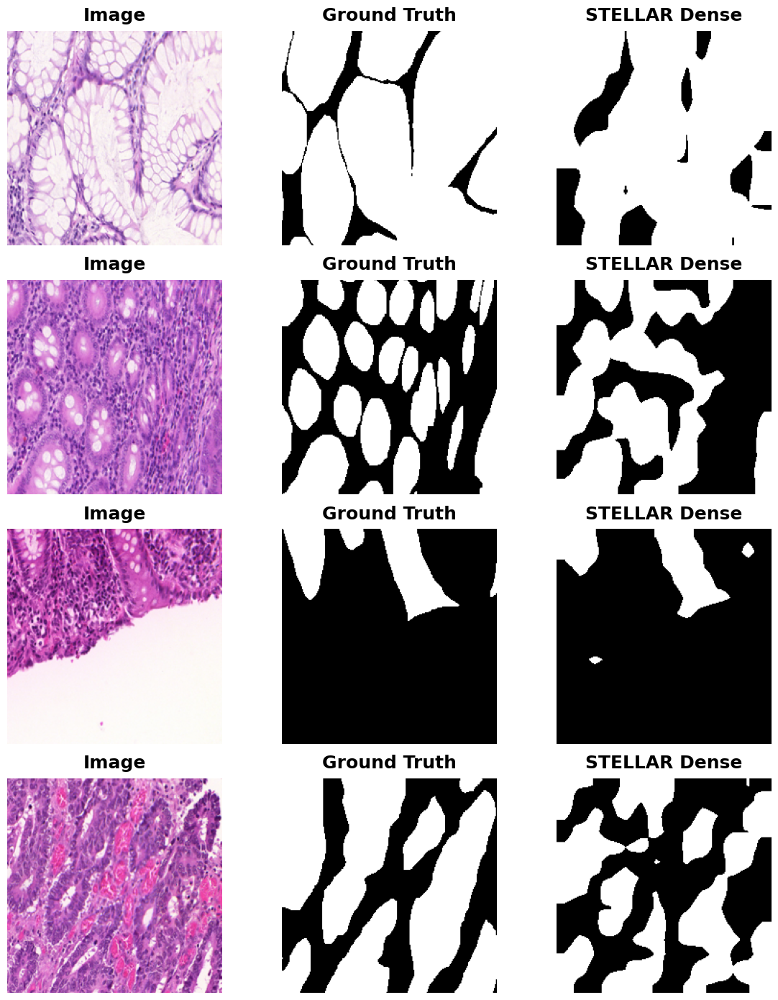

In [37]:
# Visualizing testA_loader predictions - Part 2 

fig, axes = plt.subplots(
    4,
    3,
    figsize=(12, 14)
)

for i in range(min(4, images.shape[0])):

    axes[i, 0].imshow(
        images[i].cpu().permute(1, 2, 0)
    )
    axes[i, 0].set_title(
        "Image",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 0].axis("off")

    axes[i, 1].imshow(
        labels[i].cpu(),
        cmap="gray",
        vmin=0,
        vmax=1
    )
    axes[i, 1].set_title(
        "Ground Truth",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 1].axis("off")

    axes[i, 2].imshow(
        preds[i].cpu(),
        cmap="gray",
        vmin=0,
        vmax=1
    )
    axes[i, 2].set_title(
        "STELLAR Dense",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 2].axis("off")

plt.tight_layout()
plt.savefig(
    "/kaggle/working/stellar_dense_prediction_image_groundtruth_stellardense_testA_1.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

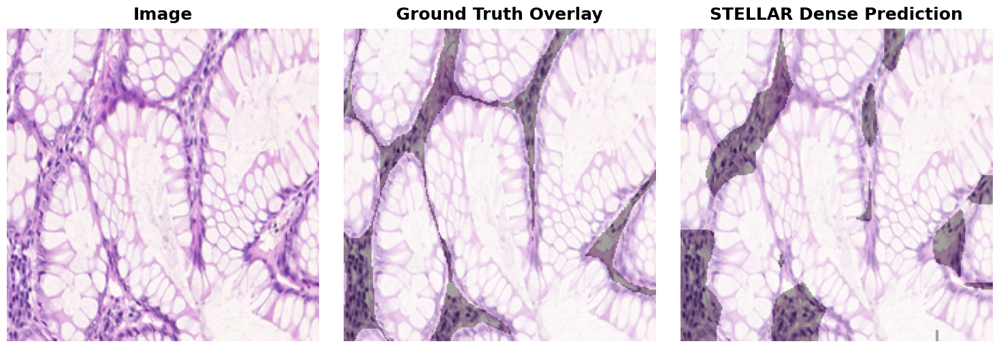

In [38]:
# Visualizing testA_loader predictions - Part 3

import matplotlib.pyplot as plt
import numpy as np

i = 0

image = images[i].cpu().permute(1, 2, 0).numpy()
gt = labels[i].cpu().numpy()
pred = preds[i].cpu().numpy()

plt.figure(figsize=(15, 5))

# 1. Original Image
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title(
    "Image",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

# 2. Ground Truth Overlay
plt.subplot(1, 3, 2)
plt.imshow(image)
plt.imshow(
    gt,
    alpha=0.35,
    cmap="gray",
    vmin=0,
    vmax=1
)
plt.title(
    "Ground Truth Overlay",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

# 3. STELLAR Dense Prediction
plt.subplot(1, 3, 3)
plt.imshow(image)
plt.imshow(
    pred,
    alpha=0.35,
    cmap="gray",
    vmin=0,
    vmax=1
)
plt.title(
    "STELLAR Dense Prediction",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

plt.tight_layout()
plt.savefig(
    "/kaggle/working/stellar_dense_prediction_image_groundtruth_prediction_testA_2.png",
    dpi=600,
    bbox_inches="tight"
)
plt.show()

## Visualization - testB_loader

In [39]:
# Visualize testB_loader Predictions - Part 1 

import matplotlib.pyplot as plt

batch = next(iter(testB_loader))
images = batch["image"].to(device)
labels = batch["labels"].to(device)

with torch.no_grad():
    logits = dense_model({
        "image": images
    })["predictions"]

preds = torch.argmax(
    logits,
    dim=1
)

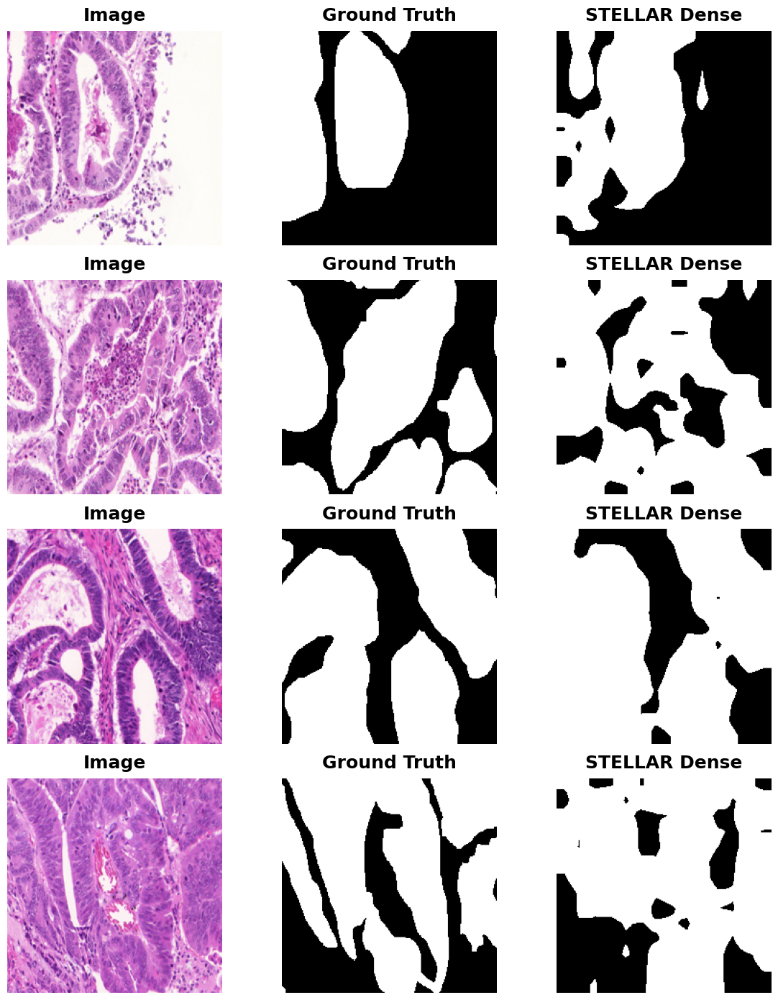

In [40]:
# Visualizing testB_loader predictions - Part 2 

fig, axes = plt.subplots(
    4,
    3,
    figsize=(12, 14)
)

for i in range(min(4, images.shape[0])):

    axes[i, 0].imshow(
        images[i].cpu().permute(1, 2, 0)
    )
    axes[i, 0].set_title(
        "Image",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 0].axis("off")

    axes[i, 1].imshow(
        labels[i].cpu(),
        cmap="gray",
        vmin=0,
        vmax=1
    )
    axes[i, 1].set_title(
        "Ground Truth",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 1].axis("off")

    axes[i, 2].imshow(
        preds[i].cpu(),
        cmap="gray",
        vmin=0,
        vmax=1
    )
    axes[i, 2].set_title(
        "STELLAR Dense",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 2].axis("off")

plt.tight_layout()
plt.savefig(
    "/kaggle/working/stellar_dense_prediction_image_groundtruth_stellardense_testB_1.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

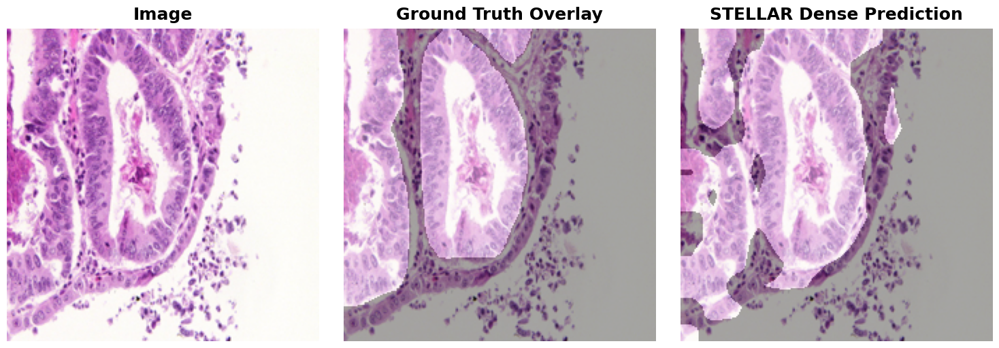

In [41]:
# Visualizing testB_loader predictions - Part 3

import matplotlib.pyplot as plt
import numpy as np

i = 0

image = images[i].cpu().permute(1, 2, 0).numpy()
gt = labels[i].cpu().numpy()
pred = preds[i].cpu().numpy()

plt.figure(figsize=(15, 5))

# 1. Original Image
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title(
    "Image",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

# 2. Ground Truth Overlay
plt.subplot(1, 3, 2)
plt.imshow(image)
plt.imshow(
    gt,
    alpha=0.35,
    cmap="gray",
    vmin=0,
    vmax=1
)
plt.title(
    "Ground Truth Overlay",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

# 3. STELLAR Dense Prediction
plt.subplot(1, 3, 3)
plt.imshow(image)
plt.imshow(
    pred,
    alpha=0.35,
    cmap="gray",
    vmin=0,
    vmax=1
)
plt.title(
    "STELLAR Dense Prediction",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

plt.tight_layout()
plt.savefig(
    "/kaggle/working/stellar_dense_prediction_image_groundtruth_prediction_testB_2.png",
    dpi=600,
    bbox_inches="tight"
)
plt.show()

## Dense rank for 3 SEEDS

In [42]:
# Establishing the dense baseline for 3 SEEDS
# Creating the fixed split once
SEED_SPLIT = 42

generator = torch.Generator().manual_seed(SEED_SPLIT)

indices = torch.randperm(
    len(glas_train_aug),
    generator=generator
).tolist()

train_indices = indices[:70]
val_indices = indices[70:]

print("Train:", len(train_indices))
print("Validation:", len(val_indices))

Train: 70
Validation: 15


In [43]:
# Creating fixed dataset for 3 SEED run
from torch.utils.data import Subset

train_subset = Subset(
    glas_train_aug,
    train_indices
)

val_subset = Subset(
    glas_train_eval,
    val_indices
)
probe_train_loader = DataLoader(
    train_subset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
)

probe_val_loader = DataLoader(
    val_subset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

In [44]:
# Running for seed 42, 123, 2026
def train_dense_probe(seed, num_epochs=50):

    import random

    # Training randomness
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

  
    # Fresh model
    dense_model = SegmentationProbing(
        model_backbone=model,
        is_baseline=False,
        feature_key="dense",
        feature_dim=768,
        num_classes=2,
        freeze_backbone=True,
        freeze_model=False,
        resize_output=(224, 224),
    ).to(device)

  
    # Optimizer
    optimizer = torch.optim.AdamW(
        filter(
            lambda p: p.requires_grad,
            dense_model.parameters()
        ),
        lr=1e-3,
        weight_decay=1e-4,
    )

    criterion = torch.nn.CrossEntropyLoss()

   
    # Best checkpoint in memory
    best_val_dice = -1.0
    best_epoch = -1
    best_state = None

    history = []


    # Training
    for epoch in range(num_epochs):

        train_metrics = run_epoch(
            dense_model,
            probe_train_loader,
            optimizer=optimizer,
            criterion=criterion,
            device=device,
        )

        val_metrics = run_epoch(
            dense_model,
            probe_val_loader,
            optimizer=None,
            criterion=criterion,
            device=device,
        )

        history.append({
            "epoch": epoch + 1,
            "train_dice": train_metrics["gland_dice"],
            "train_miou": train_metrics["miou"],
            "val_dice": val_metrics["gland_dice"],
            "val_miou": val_metrics["miou"],
        })

        print(
            f"[Seed {seed}] "
            f"Epoch {epoch+1:02d}/{num_epochs} | "
            f"Train Dice: {train_metrics['gland_dice']:.4f} | "
            f"Val Dice: {val_metrics['gland_dice']:.4f}"
        )

        if val_metrics["gland_dice"] > best_val_dice:
            best_val_dice = val_metrics["gland_dice"]
            best_epoch = epoch + 1

            best_state = {
                k: v.detach().cpu().clone()
                for k, v in dense_model.state_dict().items()
            }


    # Restore best model
    dense_model.load_state_dict(best_state)
    dense_model.eval()


    # TestA
    testA_metrics = run_epoch(
        dense_model,
        testA_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )


    # TestB
    testB_metrics = run_epoch(
        dense_model,
        testB_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    return {
        "seed": seed,
        "best_epoch": best_epoch,
        "best_val_dice": best_val_dice,
        "testA": testA_metrics,
        "testB": testB_metrics,
        "history": history,
    }

In [45]:
# Running for 3 SEEDS
dense_results = {}

for seed in [42, 123, 2026]:

    print("\n" + "=" * 70)
    print(f"STARTING DENSE PROBE — SEED {seed}")
    print("=" * 70)

    dense_results[seed] = train_dense_probe(
        seed=seed,
        num_epochs=50, # Tunable
    )


STARTING DENSE PROBE — SEED 42
[Seed 42] Epoch 01/50 | Train Dice: 0.7011 | Val Dice: 0.7677
[Seed 42] Epoch 02/50 | Train Dice: 0.7965 | Val Dice: 0.8005
[Seed 42] Epoch 03/50 | Train Dice: 0.8128 | Val Dice: 0.8235
[Seed 42] Epoch 04/50 | Train Dice: 0.8317 | Val Dice: 0.8222
[Seed 42] Epoch 05/50 | Train Dice: 0.8443 | Val Dice: 0.8329
[Seed 42] Epoch 06/50 | Train Dice: 0.8384 | Val Dice: 0.8184
[Seed 42] Epoch 07/50 | Train Dice: 0.8470 | Val Dice: 0.8363
[Seed 42] Epoch 08/50 | Train Dice: 0.8449 | Val Dice: 0.8262
[Seed 42] Epoch 09/50 | Train Dice: 0.8554 | Val Dice: 0.8427
[Seed 42] Epoch 10/50 | Train Dice: 0.8462 | Val Dice: 0.8447
[Seed 42] Epoch 11/50 | Train Dice: 0.8587 | Val Dice: 0.8320
[Seed 42] Epoch 12/50 | Train Dice: 0.8481 | Val Dice: 0.8396
[Seed 42] Epoch 13/50 | Train Dice: 0.8634 | Val Dice: 0.8406
[Seed 42] Epoch 14/50 | Train Dice: 0.8584 | Val Dice: 0.8382
[Seed 42] Epoch 15/50 | Train Dice: 0.8587 | Val Dice: 0.8441
[Seed 42] Epoch 16/50 | Train Dice: 0.

In [46]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_dense_glas_probe_3_SEED_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_dense_glas_probe_3_SEED_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.635510,0.628178,0.457915,0.451312,0.531621,0.711791,0.552543,0.580484
1,2,0.478927,0.764720,0.619066,0.615497,0.434159,0.791990,0.655615,0.658968
2,3,0.415099,0.807735,0.677479,0.676861,0.403023,0.807600,0.677289,0.684372
3,4,0.401139,0.820659,0.695862,0.690612,0.384562,0.818533,0.692811,0.700258
4,5,0.382532,0.830169,0.709649,0.706773,0.365972,0.826361,0.704101,0.710784


In [47]:
# Summarizing results of 3 SEEDS 

for seed, result in dense_results.items():
    print("\n" + "=" * 60)
    print(f"SEED {seed}")
    print("=" * 60)
    print(
        f"Best epoch: {result['best_epoch']}"
    )
    print(
        f"Val Dice: "
        f"{result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Dice : {result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  IoU  : {result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU : {result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Dice : {result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  IoU  : {result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU : {result['testB']['miou']:.4f}"
    )


SEED 42
Best epoch: 39
Val Dice: 0.8593

TestA
  Dice : 0.8384
  IoU  : 0.7218
  mIoU : 0.7037

TestB
  Dice : 0.8428
  IoU  : 0.7282
  mIoU : 0.6796

SEED 123
Best epoch: 49
Val Dice: 0.8636

TestA
  Dice : 0.8426
  IoU  : 0.7280
  mIoU : 0.7181

TestB
  Dice : 0.8424
  IoU  : 0.7277
  mIoU : 0.6846

SEED 2026
Best epoch: 50
Val Dice: 0.8592

TestA
  Dice : 0.8421
  IoU  : 0.7273
  mIoU : 0.7136

TestB
  Dice : 0.8537
  IoU  : 0.7448
  mIoU : 0.6827


In [48]:
# Calculate mean and standard deviation - Run At Last

def get_summary(results, split, metric):

    values = np.array([
        result[split][metric]
        for result in results.values()
    ])

    return (
        values.mean(),
        values.std(ddof=1),
    )


for split in ["testA", "testB"]:

    print(f"\n===== {split.upper()} =====")

    for metric in [
        "gland_dice",
        "gland_iou",
        "miou",
    ]:

        mean, std = get_summary(
            dense_results,
            split,
            metric,
        )

        print(
            f"{metric:15s}: "
            f"{mean:.4f} ± {std:.4f}"
        )


===== TESTA =====
gland_dice     : 0.8410 ± 0.0023
gland_iou      : 0.7257 ± 0.0034
miou           : 0.7118 ± 0.0074

===== TESTB =====
gland_dice     : 0.8463 ± 0.0064
gland_iou      : 0.7336 ± 0.0097
miou           : 0.6823 ± 0.0025


In [49]:
# Overall summary - Run At Last

for seed, result in dense_results.items():

    print("\n" + "=" * 60)
    print(f"SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : {result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : {result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testB']['miou']:.4f}"
    )


SEED 42
Best epoch : 39
Val Dice   : 0.8593

TestA
  Gland Dice : 0.8384
  Gland IoU  : 0.7218
  mIoU       : 0.7037

TestB
  Gland Dice : 0.8428
  Gland IoU  : 0.7282
  mIoU       : 0.6796

SEED 123
Best epoch : 49
Val Dice   : 0.8636

TestA
  Gland Dice : 0.8426
  Gland IoU  : 0.7280
  mIoU       : 0.7181

TestB
  Gland Dice : 0.8424
  Gland IoU  : 0.7277
  mIoU       : 0.6846

SEED 2026
Best epoch : 50
Val Dice   : 0.8592

TestA
  Gland Dice : 0.8421
  Gland IoU  : 0.7273
  mIoU       : 0.7136

TestB
  Gland Dice : 0.8537
  Gland IoU  : 0.7448
  mIoU       : 0.6827


## Low Rank

In [50]:
# Creating a segmentaton model for downstream task for "lowrank"

from src.models.downstream.segmentation import SegmentationProbing
print(SegmentationProbing)

lowrank_model = SegmentationProbing(
    model_backbone=model,
    is_baseline=False,
    feature_key="lowrank",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

for name, param in lowrank_model.named_parameters():
    if param.requires_grad:
        print("TRAINABLE:", name)


import torch.nn as nn
criterion = nn.CrossEntropyLoss() # cross-entropy loss
# We'll be using AdamW optimizer
optimizer = torch.optim.AdamW(
    filter(
        lambda p: p.requires_grad,
        lowrank_model.parameters()
    ),
    lr=1e-3,
    weight_decay=1e-4,
)


<class 'src.models.downstream.segmentation.SegmentationProbing'>
TRAINABLE: decoder_head.0.weight
TRAINABLE: decoder_head.0.bias
TRAINABLE: decoder_head.1.weight
TRAINABLE: decoder_head.1.bias


## Lowrank running for single epoch

In [51]:
# Training STELLAR for one single epoch to check if it's working or not

lowrank_model.train()
batch = next(iter(probe_train_loader))

images = batch["image"].to(device)
labels = batch["labels"].to(device)

optimizer.zero_grad()
outputs = lowrank_model({
    "image": images
})

logits = outputs["predictions"]
loss = criterion(
    logits,
    labels
)

print("Logits:", logits.shape)
print("Labels:", labels.shape)
print("Loss:", loss.item())

loss.backward()
optimizer.step()

print("One optimization step completed.")

Logits: torch.Size([4, 2, 224, 224])
Labels: torch.Size([4, 224, 224])
Loss: 0.8648320436477661
One optimization step completed.


In [52]:
# Checking weights and bias of decoder head
for name, param in lowrank_model.named_parameters():
    if param.requires_grad:
        print(
            name,
            "grad:",
            None if param.grad is None
            else param.grad.norm().item()
        )

decoder_head.0.weight grad: 0.13965225219726562
decoder_head.0.bias grad: 0.03293357789516449
decoder_head.1.weight grad: 6.505629062652588
decoder_head.1.bias grad: 0.05609479546546936


## Lowrank running for larger epoch

In [53]:
# Reinitializing segmentation model for training larger epochs
lowrank_model = SegmentationProbing(
    model_backbone=model,
    is_baseline=False,
    feature_key="lowrank",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

optimizer = torch.optim.AdamW(
    filter(
        lambda p: p.requires_grad,
        lowrank_model.parameters()
    ),
    lr=1e-3,
    weight_decay=1e-4,
)
criterion = torch.nn.CrossEntropyLoss()

In [54]:
num_epochs = 50 # Tunable metric (initially 20)
best_val_dice = -1.0 # Tunable metric
history = []

for epoch in range(num_epochs):
    
    train_metrics = run_epoch(
        lowrank_model,
        probe_train_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=device,
    )

    val_metrics = run_epoch(
        lowrank_model,
        probe_val_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    row = {
        "epoch": epoch + 1,

        "train_loss": train_metrics["loss"],
        "train_dice": train_metrics["gland_dice"],
        "train_iou": train_metrics["gland_iou"],
        "train_miou": train_metrics["miou"],

        "val_loss": val_metrics["loss"],
        "val_dice": val_metrics["gland_dice"],
        "val_iou": val_metrics["gland_iou"],
        "val_miou": val_metrics["miou"],
    }

    history.append(row)

    print(
        f"Epoch {epoch+1:02d}/{num_epochs} | "
        f"Train Loss: {train_metrics['loss']:.4f} | "
        f"Train Dice: {train_metrics['gland_dice']:.4f} | "
        f"Train mIoU: {train_metrics['miou']:.4f} | "
        f"Val Loss: {val_metrics['loss']:.4f} | "
        f"Val Dice: {val_metrics['gland_dice']:.4f} | "
        f"Val mIoU: {val_metrics['miou']:.4f}"
    )

    if val_metrics["gland_dice"] > best_val_dice:

        best_val_dice = val_metrics["gland_dice"]

        torch.save(
            lowrank_model.state_dict(),
            "/kaggle/working/stellar_lowrank_glas_probe_best.pth"
        )

        print(
            f" Saved best checkpoint "
            f"(Val Dice = {best_val_dice:.4f})"
        )

Epoch 01/50 | Train Loss: 0.7333 | Train Dice: 0.5240 | Train mIoU: 0.3453 | Val Loss: 0.6651 | Val Dice: 0.6342 | Val mIoU: 0.4406
 Saved best checkpoint (Val Dice = 0.6342)
Epoch 02/50 | Train Loss: 0.6995 | Train Dice: 0.5870 | Train mIoU: 0.3876 | Val Loss: 0.6398 | Val Dice: 0.6751 | Val mIoU: 0.4444
 Saved best checkpoint (Val Dice = 0.6751)
Epoch 03/50 | Train Loss: 0.6562 | Train Dice: 0.6375 | Train mIoU: 0.4493 | Val Loss: 0.6424 | Val Dice: 0.6359 | Val mIoU: 0.4614
Epoch 04/50 | Train Loss: 0.6508 | Train Dice: 0.6464 | Train mIoU: 0.4531 | Val Loss: 0.6879 | Val Dice: 0.5296 | Val mIoU: 0.4155
Epoch 05/50 | Train Loss: 0.6194 | Train Dice: 0.6565 | Train mIoU: 0.4678 | Val Loss: 0.6384 | Val Dice: 0.5985 | Val mIoU: 0.4593
Epoch 06/50 | Train Loss: 0.6267 | Train Dice: 0.6682 | Train mIoU: 0.4761 | Val Loss: 0.6480 | Val Dice: 0.6636 | Val mIoU: 0.4909
Epoch 07/50 | Train Loss: 0.5986 | Train Dice: 0.6879 | Train mIoU: 0.5056 | Val Loss: 0.6177 | Val Dice: 0.6711 | Val mIo

In [55]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_lowrank_glas_probe_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_lowrank_glas_probe_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.733302,0.524020,0.355032,0.345326,0.665102,0.634206,0.464350,0.440614
1,2,0.699460,0.587009,0.415437,0.387578,0.639827,0.675145,0.509599,0.444414
2,3,0.656180,0.637535,0.467928,0.449320,0.642385,0.635890,0.466158,0.461425
3,4,0.650798,0.646444,0.477590,0.453090,0.687925,0.529646,0.360216,0.415466
4,5,0.619436,0.656520,0.488671,0.467765,0.638372,0.598516,0.427058,0.459281


In [56]:
# Loading the best checkpoint

best_path = "/kaggle/working/stellar_lowrank_glas_probe_best.pth"
lowrank_model.load_state_dict(
    torch.load(
        best_path,
        map_location=device
    )
)
lowrank_model.eval()

print("Best checkpoint loaded.")
print("Best validation Dice:", best_val_dice)

# Evaluate testA_metrics
testA_metrics = run_epoch(
    lowrank_model,
    testA_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestA =====")

for key, value in testA_metrics.items():
    print(f"{key:20s}: {value:.4f}")

# Evaluate testB_metrics
testB_metrics = run_epoch(
    lowrank_model,
    testB_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestB =====")

for key, value in testA_metrics.items():
    print(f"{key:20s}: {value:.4f}")

Best checkpoint loaded.
Best validation Dice: 0.7449071443950702

===== GlaS TestA =====
background_iou      : 0.5454
gland_iou           : 0.5091
miou                : 0.5273
gland_dice          : 0.6747
pixel_accuracy      : 0.6911
loss                : 0.5853

===== GlaS TestB =====
background_iou      : 0.5454
gland_iou           : 0.5091
miou                : 0.5273
gland_dice          : 0.6747
pixel_accuracy      : 0.6911
loss                : 0.5853


## Visualization - testA_loader

In [57]:
# Visualize testA_loader Predictions - Part 1 

import matplotlib.pyplot as plt

batch = next(iter(testA_loader))
images = batch["image"].to(device)
labels = batch["labels"].to(device)

with torch.no_grad():
    logits = lowrank_model({
        "image": images
    })["predictions"]

preds = torch.argmax(
    logits,
    dim=1
)

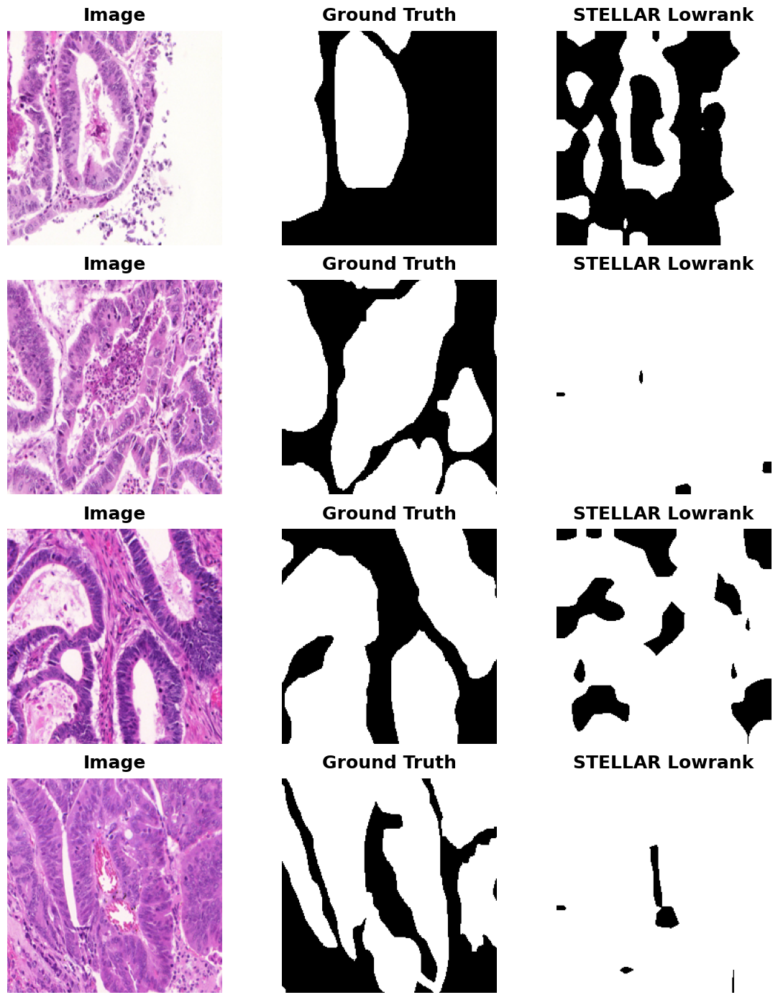

In [62]:
# Visualizing testA_loader predictions - Part 2 

fig, axes = plt.subplots(
    4,
    3,
    figsize=(12, 14)
)

for i in range(min(4, images.shape[0])):

    axes[i, 0].imshow(
        images[i].cpu().permute(1, 2, 0)
    )
    axes[i, 0].set_title(
        "Image",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 0].axis("off")

    axes[i, 1].imshow(
        labels[i].cpu(),
        cmap="gray",
        vmin=0,
        vmax=1
    )
    axes[i, 1].set_title(
        "Ground Truth",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 1].axis("off")

    axes[i, 2].imshow(
        preds[i].cpu(),
        cmap="gray",
        vmin=0,
        vmax=1
    )
    axes[i, 2].set_title(
        "STELLAR Lowrank",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 2].axis("off")

plt.tight_layout()
plt.savefig(
    "/kaggle/working/stellar_lowrank_prediction_image_groundtruth_stellardense_testA_1.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

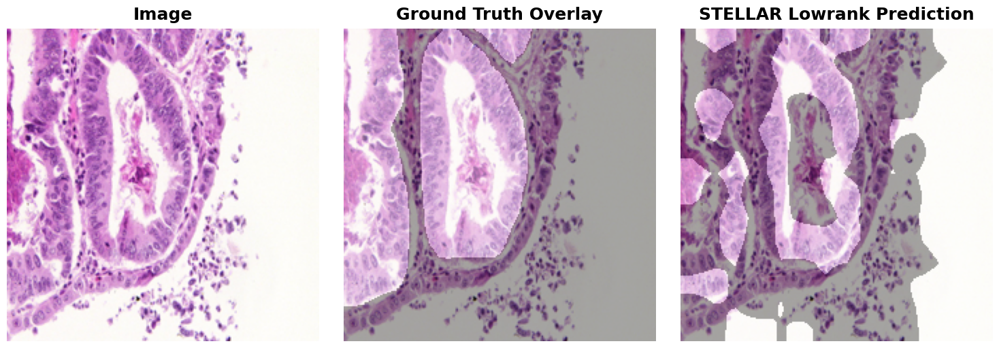

In [63]:
# Visualizing testA_loader predictions - Part 3

import matplotlib.pyplot as plt
import numpy as np

i = 0

image = images[i].cpu().permute(1, 2, 0).numpy()
gt = labels[i].cpu().numpy()
pred = preds[i].cpu().numpy()

plt.figure(figsize=(15, 5))

# 1. Original Image
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title(
    "Image",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

# 2. Ground Truth Overlay
plt.subplot(1, 3, 2)
plt.imshow(image)
plt.imshow(
    gt,
    alpha=0.35,
    cmap="gray",
    vmin=0,
    vmax=1
)
plt.title(
    "Ground Truth Overlay",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

# 3. STELLAR Dense Prediction
plt.subplot(1, 3, 3)
plt.imshow(image)
plt.imshow(
    pred,
    alpha=0.35,
    cmap="gray",
    vmin=0,
    vmax=1
)
plt.title(
    "STELLAR Lowrank Prediction",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

plt.tight_layout()
plt.savefig(
    "/kaggle/working/stellar_lowrank_prediction_image_groundtruth_prediction_testA_2.png",
    dpi=600,
    bbox_inches="tight"
)
plt.show()

## Visualization - testB_loader

In [64]:
# Visualize testB_loader Predictions - Part 1 

import matplotlib.pyplot as plt

batch = next(iter(testB_loader))
images = batch["image"].to(device)
labels = batch["labels"].to(device)

with torch.no_grad():
    logits = lowrank_model({
        "image": images
    })["predictions"]

preds = torch.argmax(
    logits,
    dim=1
)

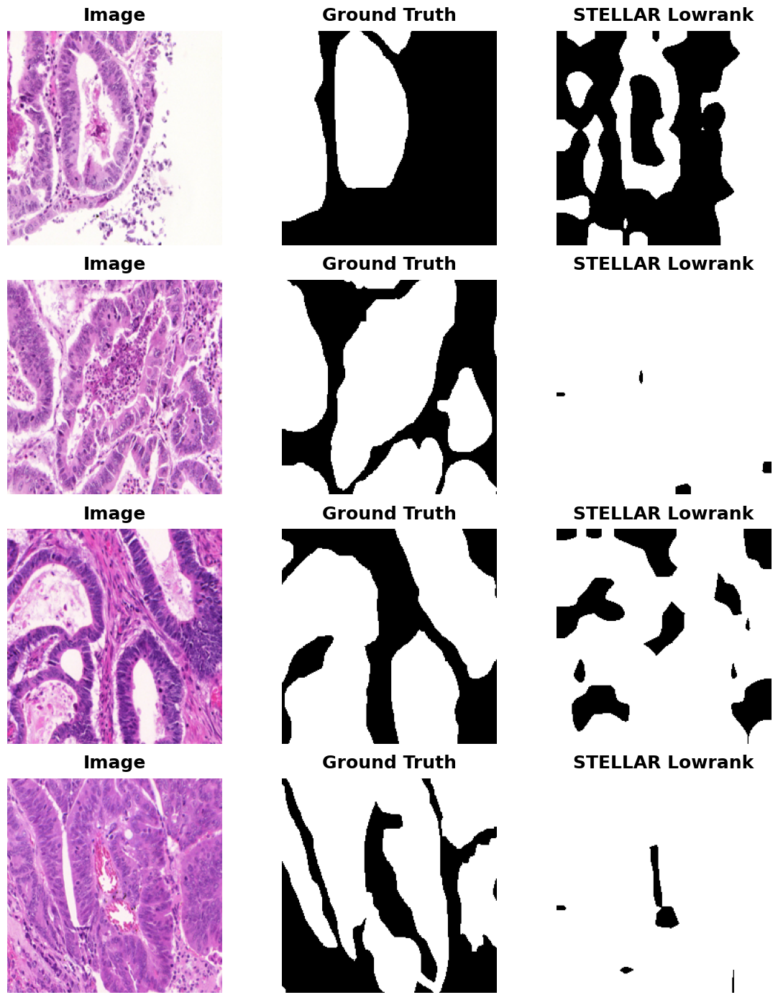

In [65]:
# Visualizing testB_loader predictions - Part 2 

fig, axes = plt.subplots(
    4,
    3,
    figsize=(12, 14)
)

for i in range(min(4, images.shape[0])):

    axes[i, 0].imshow(
        images[i].cpu().permute(1, 2, 0)
    )
    axes[i, 0].set_title(
        "Image",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 0].axis("off")

    axes[i, 1].imshow(
        labels[i].cpu(),
        cmap="gray",
        vmin=0,
        vmax=1
    )
    axes[i, 1].set_title(
        "Ground Truth",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 1].axis("off")

    axes[i, 2].imshow(
        preds[i].cpu(),
        cmap="gray",
        vmin=0,
        vmax=1
    )
    axes[i, 2].set_title(
        "STELLAR Lowrank",
        fontsize=18,
        fontweight="bold",
        pad=10
    )
    axes[i, 2].axis("off")

plt.tight_layout()
plt.savefig(
    "/kaggle/working/stellar_lowrank_prediction_image_groundtruth_stellardense_testB_1.png",
    dpi=600,
    bbox_inches="tight"
)

plt.show()

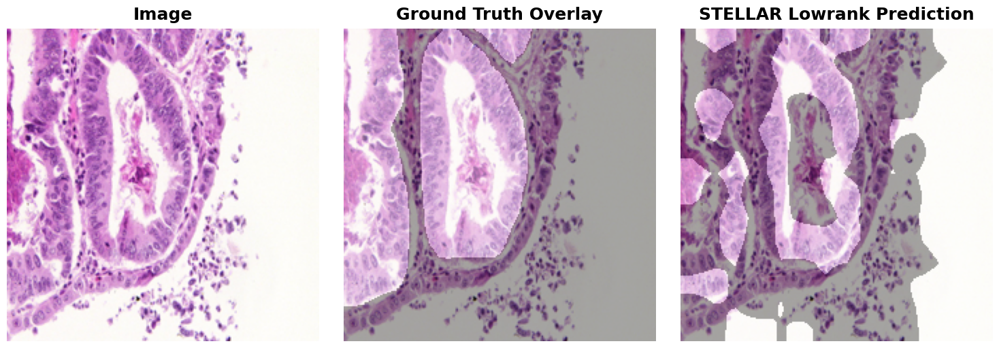

In [66]:
# Visualizing testB_loader predictions - Part 3

import matplotlib.pyplot as plt
import numpy as np

i = 0

image = images[i].cpu().permute(1, 2, 0).numpy()
gt = labels[i].cpu().numpy()
pred = preds[i].cpu().numpy()

plt.figure(figsize=(15, 5))

# 1. Original Image
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title(
    "Image",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

# 2. Ground Truth Overlay
plt.subplot(1, 3, 2)
plt.imshow(image)
plt.imshow(
    gt,
    alpha=0.35,
    cmap="gray",
    vmin=0,
    vmax=1
)
plt.title(
    "Ground Truth Overlay",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

# 3. STELLAR Dense Prediction
plt.subplot(1, 3, 3)
plt.imshow(image)
plt.imshow(
    pred,
    alpha=0.35,
    cmap="gray",
    vmin=0,
    vmax=1
)
plt.title(
    "STELLAR Lowrank Prediction",
    fontsize=18,
    fontweight="bold",
    pad=10
)
plt.axis("off")

plt.tight_layout()
plt.savefig(
    "/kaggle/working/stellar_lowrank_prediction_image_groundtruth_prediction_testB_2.png",
    dpi=600,
    bbox_inches="tight"
)
plt.show()

## Lowrank for 3 SEEDS

In [67]:
# Establishing the dense baseline for 3 SEEDS
# Creating the fixed split once
SEED_SPLIT = 42

generator = torch.Generator().manual_seed(SEED_SPLIT)

indices = torch.randperm(
    len(glas_train_aug),
    generator=generator
).tolist()

train_indices = indices[:70]
val_indices = indices[70:]

print("Train:", len(train_indices))
print("Validation:", len(val_indices))

Train: 70
Validation: 15


In [68]:
# Creating fixed dataset for 3 SEED run
from torch.utils.data import Subset

train_subset = Subset(
    glas_train_aug,
    train_indices
)

val_subset = Subset(
    glas_train_eval,
    val_indices
)
probe_train_loader = DataLoader(
    train_subset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
)

probe_val_loader = DataLoader(
    val_subset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

In [69]:
# Running for seed 42, 123, 2026 
# Initially epochs 20
def train_spatial_probe(feature_key, seed, num_epochs=50):

    import random

  
    # Training randomness
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

  
    # Fresh model
    lowrank_model = SegmentationProbing(
        model_backbone=model,
        is_baseline=False,
        feature_key="lowrank",
        feature_dim=768,
        num_classes=2,
        freeze_backbone=True,
        freeze_model=False,
        resize_output=(224, 224),
    ).to(device)

  
    # Optimizer
    optimizer = torch.optim.AdamW(
        filter(
            lambda p: p.requires_grad,
            lowrank_model.parameters()
        ),
        lr=1e-3,
        weight_decay=1e-4,
    )

    criterion = torch.nn.CrossEntropyLoss()

   
    # Best checkpoint in memory
    best_val_dice = -1.0
    best_epoch = -1
    best_state = None

    history = []


    # Training
    for epoch in range(num_epochs):

        train_metrics = run_epoch(
            lowrank_model,
            probe_train_loader,
            optimizer=optimizer,
            criterion=criterion,
            device=device,
        )

        val_metrics = run_epoch(
            lowrank_model,
            probe_val_loader,
            optimizer=None,
            criterion=criterion,
            device=device,
        )

        history.append({
            "epoch": epoch + 1,
            "train_dice": train_metrics["gland_dice"],
            "train_miou": train_metrics["miou"],
            "val_dice": val_metrics["gland_dice"],
            "val_miou": val_metrics["miou"],
        })

        print(
            f"[Seed {seed}] "
            f"Epoch {epoch+1:02d}/{num_epochs} | "
            f"Train Dice: {train_metrics['gland_dice']:.4f} | "
            f"Val Dice: {val_metrics['gland_dice']:.4f}"
        )

        if val_metrics["gland_dice"] > best_val_dice:
            best_val_dice = val_metrics["gland_dice"]
            best_epoch = epoch + 1

            best_state = {
                k: v.detach().cpu().clone()
                for k, v in lowrank_model.state_dict().items()
            }


    # Restore best model
    lowrank_model.load_state_dict(best_state)
    lowrank_model.eval()


    # TestA
    testA_metrics = run_epoch(
        lowrank_model,
        testA_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )


    # TestB
    testB_metrics = run_epoch(
        lowrank_model,
        testB_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    return {
        "seed": seed,
        "best_epoch": best_epoch,
        "best_val_dice": best_val_dice,
        "testA": testA_metrics,
        "testB": testB_metrics,
        "history": history,
    }
    

In [70]:
# Running for 3 SEEDS
lowrank_results = {}

for seed in [42, 123, 2026]:

    print("\n" + "=" * 70)
    print(f"STARTING LOWRANK PROBE — SEED {seed}")
    print("=" * 70)

    lowrank_results[seed] = train_spatial_probe(
        feature_key="lowrank",
        seed=seed,
        num_epochs=50,
    )


STARTING LOWRANK PROBE — SEED 42
[Seed 42] Epoch 01/50 | Train Dice: 0.5364 | Val Dice: 0.6624
[Seed 42] Epoch 02/50 | Train Dice: 0.6126 | Val Dice: 0.6535
[Seed 42] Epoch 03/50 | Train Dice: 0.6287 | Val Dice: 0.6213
[Seed 42] Epoch 04/50 | Train Dice: 0.6286 | Val Dice: 0.6179
[Seed 42] Epoch 05/50 | Train Dice: 0.6674 | Val Dice: 0.6413
[Seed 42] Epoch 06/50 | Train Dice: 0.6802 | Val Dice: 0.5494
[Seed 42] Epoch 07/50 | Train Dice: 0.6615 | Val Dice: 0.5196
[Seed 42] Epoch 08/50 | Train Dice: 0.6874 | Val Dice: 0.5864
[Seed 42] Epoch 09/50 | Train Dice: 0.6998 | Val Dice: 0.5387
[Seed 42] Epoch 10/50 | Train Dice: 0.6976 | Val Dice: 0.6800
[Seed 42] Epoch 11/50 | Train Dice: 0.7017 | Val Dice: 0.6318
[Seed 42] Epoch 12/50 | Train Dice: 0.6992 | Val Dice: 0.6106
[Seed 42] Epoch 13/50 | Train Dice: 0.7179 | Val Dice: 0.6598
[Seed 42] Epoch 14/50 | Train Dice: 0.6985 | Val Dice: 0.6288
[Seed 42] Epoch 15/50 | Train Dice: 0.7214 | Val Dice: 0.6692
[Seed 42] Epoch 16/50 | Train Dice: 

In [71]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_lowrank_glas_probe_3_SEED_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_lowrank_glas_probe_3_SEED_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.733302,0.524020,0.355032,0.345326,0.665102,0.634206,0.464350,0.440614
1,2,0.699460,0.587009,0.415437,0.387578,0.639827,0.675145,0.509599,0.444414
2,3,0.656180,0.637535,0.467928,0.449320,0.642385,0.635890,0.466158,0.461425
3,4,0.650798,0.646444,0.477590,0.453090,0.687925,0.529646,0.360216,0.415466
4,5,0.619436,0.656520,0.488671,0.467765,0.638372,0.598516,0.427058,0.459281


In [72]:
# Summarize results of lowrank
for seed, result in lowrank_results.items():

    print("\n" + "=" * 60)
    print(f"LOWRANK — SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : "
        f"{result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : "
        f"{result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testB']['miou']:.4f}"
    )


LOWRANK — SEED 42
Best epoch : 18
Val Dice   : 0.7254

TestA
  Gland Dice : 0.6700
  Gland IoU  : 0.5038
  mIoU       : 0.4631

TestB
  Gland Dice : 0.7183
  Gland IoU  : 0.5605
  mIoU       : 0.4473

LOWRANK — SEED 123
Best epoch : 29
Val Dice   : 0.7366

TestA
  Gland Dice : 0.7067
  Gland IoU  : 0.5465
  mIoU       : 0.5328

TestB
  Gland Dice : 0.6501
  Gland IoU  : 0.4816
  mIoU       : 0.4231

LOWRANK — SEED 2026
Best epoch : 22
Val Dice   : 0.7257

TestA
  Gland Dice : 0.7095
  Gland IoU  : 0.5498
  mIoU       : 0.5097

TestB
  Gland Dice : 0.6880
  Gland IoU  : 0.5244
  mIoU       : 0.4287


In [74]:
# Calculate mean and standard deviation - Run At Last

def get_summary(results, split, metric):

    values = np.array([
        result[split][metric]
        for result in results.values()
    ])

    return (
        values.mean(),
        values.std(ddof=1),
    )


for split in ["testA", "testB"]:

    print(f"\n===== {split.upper()} =====")

    for metric in [
        "gland_dice",
        "gland_iou",
        "miou",
    ]:

        mean, std = get_summary(
            lowrank_results,
            split,
            metric,
        )

        print(
            f"{metric:15s}: "
            f"{mean:.4f} ± {std:.4f}"
        )


===== TESTA =====
gland_dice     : 0.6954 ± 0.0221
gland_iou      : 0.5333 ± 0.0257
miou           : 0.5019 ± 0.0355

===== TESTB =====
gland_dice     : 0.6855 ± 0.0342
gland_iou      : 0.5222 ± 0.0395
miou           : 0.4330 ± 0.0127


In [75]:
# Overall summary - Run At Last

for seed, result in lowrank_results.items():

    print("\n" + "=" * 60)
    print(f"SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : {result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : {result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testB']['miou']:.4f}"
    )


SEED 42
Best epoch : 18
Val Dice   : 0.7254

TestA
  Gland Dice : 0.6700
  Gland IoU  : 0.5038
  mIoU       : 0.4631

TestB
  Gland Dice : 0.7183
  Gland IoU  : 0.5605
  mIoU       : 0.4473

SEED 123
Best epoch : 29
Val Dice   : 0.7366

TestA
  Gland Dice : 0.7067
  Gland IoU  : 0.5465
  mIoU       : 0.5328

TestB
  Gland Dice : 0.6501
  Gland IoU  : 0.4816
  mIoU       : 0.4231

SEED 2026
Best epoch : 22
Val Dice   : 0.7257

TestA
  Gland Dice : 0.7095
  Gland IoU  : 0.5498
  mIoU       : 0.5097

TestB
  Gland Dice : 0.6880
  Gland IoU  : 0.5244
  mIoU       : 0.4287


## Comaparse Dense vs Lowrank

In [76]:
def summarize_results(results):

    summary = {}
    for split in ["testA", "testB"]:
        summary[split] = {}

        for metric in [
            "gland_dice",
            "gland_iou",
            "miou",
        ]:

            values = np.array([
                r[split][metric]
                for r in results.values()
            ])

            summary[split][metric] = {
                "mean": values.mean(),
                "std": values.std(ddof=1),
            }

    return summary


dense_summary = summarize_results(dense_results)
lowrank_summary = summarize_results(lowrank_results)

In [77]:
# Comparison result of Dense vs Lowrank
for split in ["testA", "testB"]:

    print(f"\n===== {split.upper()} =====")

    for metric in [
        "gland_dice",
        "gland_iou",
        "miou",
    ]:

        d = dense_summary[split][metric]
        l = lowrank_summary[split][metric]

        print(
            f"\n{metric}"
        )
        print(
            f"Dense   : "
            f"{d['mean']:.4f} ± {d['std']:.4f}"
        )
        print(
            f"Lowrank : "
            f"{l['mean']:.4f} ± {l['std']:.4f}"
        )
        print(
            f"Δ       : "
            f"{d['mean'] - l['mean']:+.4f}"
        )



===== TESTA =====

gland_dice
Dense   : 0.8410 ± 0.0023
Lowrank : 0.6954 ± 0.0221
Δ       : +0.1456

gland_iou
Dense   : 0.7257 ± 0.0034
Lowrank : 0.5333 ± 0.0257
Δ       : +0.1923

miou
Dense   : 0.7118 ± 0.0074
Lowrank : 0.5019 ± 0.0355
Δ       : +0.2099

===== TESTB =====

gland_dice
Dense   : 0.8463 ± 0.0064
Lowrank : 0.6855 ± 0.0342
Δ       : +0.1608

gland_iou
Dense   : 0.7336 ± 0.0097
Lowrank : 0.5222 ± 0.0395
Δ       : +0.2114

miou
Dense   : 0.6823 ± 0.0025
Lowrank : 0.4330 ± 0.0127
Δ       : +0.2492


In [78]:
# Feature statistics
batch = next(iter(probe_val_loader))
images = batch["image"].to(device)
with torch.no_grad():

    outputs = model.encode({
        "image": images
    })

dense = outputs["dense"]
lowrank = outputs["lowrank"]

print("Dense:")
print(" shape:", dense.shape)
print(" mean :", dense.mean().item())
print(" std  :", dense.std().item())
print(" min  :", dense.min().item())
print(" max  :", dense.max().item())

print("\nLowrank:")
print(" shape:", lowrank.shape)
print(" mean :", lowrank.mean().item())
print(" std  :", lowrank.std().item())
print(" min  :", lowrank.min().item())
print(" max  :", lowrank.max().item())

Dense:
 shape: torch.Size([4, 196, 768])
 mean : 0.0034043893683701754
 std  : 0.44168317317962646
 min  : -5.696888446807861
 max  : 8.681538581848145

Lowrank:
 shape: torch.Size([4, 196, 768])
 mean : -0.0008784973178990185
 std  : 0.32696110010147095
 min  : -5.1097893714904785
 max  : 6.737367630004883


In [79]:
# Feature rank
x_dense = dense[0].float()
x_lowrank = lowrank[0].float()

print(x_dense.shape)
print(x_lowrank.shape)

import torch

def feature_spectrum(x):

    x = x - x.mean(dim=0, keepdim=True)
    _, S, _ = torch.linalg.svd(
        x,
        full_matrices=False
    )
    return S


S_dense = feature_spectrum(x_dense)
S_lowrank = feature_spectrum(x_lowrank)

print("Dense rank:", (S_dense > 1e-6).sum().item())
print("Lowrank rank:", (S_lowrank > 1e-6).sum().item())

print("\nTop 10 singular values")

print("\nDense:")
print(S_dense[:10])

print("\nLowrank:")
print(S_lowrank[:10])

torch.Size([196, 768])
torch.Size([196, 768])
Dense rank: 196
Lowrank rank: 22

Top 10 singular values

Dense:
tensor([41.7759, 28.1854, 25.0090, 23.9630, 20.8057, 18.3349, 16.8471, 15.6285,
        14.6667, 13.6424], device='cuda:0')

Lowrank:
tensor([31.2243, 22.6340, 18.9714, 14.6697, 14.0353, 11.3882,  9.8328,  9.1918,
         8.4947,  7.9506], device='cuda:0')


In [80]:
# Effective rank
def effective_rank(x):

    x = x.float()
    x = x - x.mean(dim=0, keepdim=True)
    _, S, _ = torch.linalg.svd(
        x,
        full_matrices=False
    )
    p = S / (S.sum() + 1e-12)
    entropy = -torch.sum(
        p * torch.log(p + 1e-12)
    )
    return torch.exp(entropy).item()


print(
    "Dense effective rank:",
    effective_rank(dense[0])
)

print(
    "Lowrank effective rank:",
    effective_rank(lowrank[0])
)

Dense effective rank: 143.49778747558594
Lowrank effective rank: 12.787631034851074


In [82]:
# Comparing training curves - Increase number of epochs for better results - Run At Last
# Both Dense, Lowrank training epochs must be same

# import matplotlib.pyplot as plt

# for seed in [42, 123, 2026]:

#     dense_history = dense_results[seed]["history"]
#     lowrank_history = lowrank_results[seed]["history"]
#     epochs = range(
#         1,
#         len(dense_history) + 1
#     )
#     plt.figure(figsize=(8, 5))
#     plt.plot(
#         epochs,
#         [x["val_dice"] for x in dense_history],
#         label="Dense"
#     )
#     plt.plot(
#         epochs,
#         [x["val_dice"] for x in lowrank_history],
#         label="Lowrank"
#     )

#     plt.xlabel("Epoch")
#     plt.ylabel("Validation Gland Dice")
#     plt.title(f"Dense vs Lowrank — Seed {seed}")
#     plt.legend()
#     plt.grid(True)

#     plt.show()
    

## Rank Truncation

In [83]:
def truncate_spatial_rank(features, rank):
    """
    features: [B, N, C]
    N = spatial tokens
    C = feature dimension
    """

    B, N, C = features.shape

    output = []

    for b in range(B):

        X = features[b].float()

        # Center across spatial locations
        X_mean = X.mean(dim=0, keepdim=True)
        X_centered = X - X_mean

        # SVD
        U, S, Vh = torch.linalg.svd(
            X_centered,
            full_matrices=False
        )

        r = min(rank, S.shape[0])

        X_r = (
            U[:, :r]
            @ torch.diag(S[:r])
            @ Vh[:r, :]
        )

        # Restore mean
        X_r = X_r + X_mean

        output.append(X_r)

    return torch.stack(output)

In [84]:
batch = next(iter(probe_val_loader))

with torch.no_grad():

    outputs = model.encode({
        "image": batch["image"].to(device)
    })

dense = outputs["dense"]

for rank in [196, 128, 64, 32, 16, 8]:

    reduced = truncate_spatial_rank(
        dense,
        rank
    )

    print(
        f"Rank {rank:3d}:",
        reduced.shape
    )

Rank 196: torch.Size([4, 196, 768])
Rank 128: torch.Size([4, 196, 768])
Rank  64: torch.Size([4, 196, 768])
Rank  32: torch.Size([4, 196, 768])
Rank  16: torch.Size([4, 196, 768])
Rank   8: torch.Size([4, 196, 768])


In [85]:
# Verifying the actual rank
for rank in [196, 128, 64, 32, 16, 8]:

    reduced = truncate_spatial_rank(
        dense[:1],
        rank
    )[0]

    X = reduced - reduced.mean(dim=0, keepdim=True)

    S = torch.linalg.svdvals(X)

    numerical_rank = (
        S > 1e-5
    ).sum().item()

    print(
        f"Requested rank = {rank:3d} | "
        f"Actual rank = {numerical_rank}"
    )

Requested rank = 196 | Actual rank = 195
Requested rank = 128 | Actual rank = 128
Requested rank =  64 | Actual rank = 64
Requested rank =  32 | Actual rank = 32
Requested rank =  16 | Actual rank = 16
Requested rank =   8 | Actual rank = 8


In [87]:
# Rank truncation backbone (we're not directly changing SegmentationProbing)
class RankTruncatedBackbone(torch.nn.Module):

    def __init__(self, backbone, rank):
        super().__init__()

        self.backbone = backbone
        self.rank = rank

    def encode(self, inputs):

        outputs = self.backbone.encode(inputs)
        dense = outputs["dense"]
        dense_rank = truncate_spatial_rank(
            dense,
            self.rank
        )

        outputs = dict(outputs)
        outputs["dense"] = dense_rank
        return outputs

## Rank-32 Training

In [88]:
rank32_backbone = RankTruncatedBackbone(
    model,
    rank=32
)

rank32_model = SegmentationProbing(
    model_backbone=rank32_backbone,
    is_baseline=False,
    feature_key="dense",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

In [89]:
# verify the rank-32 representation (Numerical Rank)
batch = next(iter(probe_train_loader))
images = batch["image"].to(device)

with torch.no_grad():
    outputs = rank32_backbone.encode({
        "image": images
    })

rank32_features = outputs["dense"]
print("Feature shape:", rank32_features.shape)

# Check numerical rank for first sample
X = rank32_features[0]

# Center exactly as done during truncation
X_centered = X - X.mean(dim=0, keepdim=True)

S = torch.linalg.svdvals(X_centered)

numerical_rank = (S > 1e-5).sum().item()
print("Numerical rank:", numerical_rank)
print("Top 10 singular values:")
print(S[:10])

Feature shape: torch.Size([4, 196, 768])
Numerical rank: 32
Top 10 singular values:
tensor([39.7224, 35.3024, 21.9309, 21.5836, 20.7778, 18.7935, 17.2917, 16.1401,
        15.2919, 14.1593], device='cuda:0')


In [90]:
# Verifying the segmentation model
with torch.no_grad():
    outputs = rank32_model({
        "image": images
    })

print("Prediction:", outputs["predictions"].shape)
print("Feature:", outputs["dense"].shape)

pred = torch.argmax(
    outputs["predictions"],
    dim=1
)
print("Prediction labels:", torch.unique(pred))

Prediction: torch.Size([4, 2, 224, 224])
Feature: torch.Size([4, 768, 14, 14])
Prediction labels: tensor([0, 1], device='cuda:0')


In [91]:
# Train rank-32 probe

import torch
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(
    rank32_model.decoder_head.parameters(),
    lr=1e-3,
    weight_decay=1e-4,
)

trainable = [
    name for name, p in rank32_model.named_parameters()
    if p.requires_grad
]
print(trainable)

['decoder_head.0.weight', 'decoder_head.0.bias', 'decoder_head.1.weight', 'decoder_head.1.bias']


In [92]:
num_epochs = 50 # Tunable metric
best_val_dice = -1.0 # Tunable metric
history = []

for epoch in range(num_epochs):
    
    train_metrics = run_epoch(
        rank32_model,
        probe_train_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=device,
    )

    val_metrics = run_epoch(
        rank32_model,
        probe_val_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    row = {
        "epoch": epoch + 1,

        "train_loss": train_metrics["loss"],
        "train_dice": train_metrics["gland_dice"],
        "train_iou": train_metrics["gland_iou"],
        "train_miou": train_metrics["miou"],

        "val_loss": val_metrics["loss"],
        "val_dice": val_metrics["gland_dice"],
        "val_iou": val_metrics["gland_iou"],
        "val_miou": val_metrics["miou"],
    }

    history.append(row)

    print(
        f"Epoch {epoch+1:02d}/{num_epochs} | "
        f"Train Loss: {train_metrics['loss']:.4f} | "
        f"Train Dice: {train_metrics['gland_dice']:.4f} | "
        f"Train mIoU: {train_metrics['miou']:.4f} | "
        f"Val Loss: {val_metrics['loss']:.4f} | "
        f"Val Dice: {val_metrics['gland_dice']:.4f} | "
        f"Val mIoU: {val_metrics['miou']:.4f}"
    )

    if val_metrics["gland_dice"] > best_val_dice:

        best_val_dice = val_metrics["gland_dice"]

        torch.save(
            rank32_model.state_dict(),
            "/kaggle/working/stellar_dense_rank32_best.pth" # these naming needs to be change for final 
        )

        print(
            f" Saved best checkpoint "
            f"(Val Dice = {best_val_dice:.4f})"
        )


Epoch 01/50 | Train Loss: 0.5655 | Train Dice: 0.7128 | Train mIoU: 0.5400 | Val Loss: 0.5109 | Val Dice: 0.7633 | Val mIoU: 0.6250
 Saved best checkpoint (Val Dice = 0.7633)
Epoch 02/50 | Train Loss: 0.4380 | Train Dice: 0.7960 | Train mIoU: 0.6535 | Val Loss: 0.3969 | Val Dice: 0.8066 | Val mIoU: 0.6852
 Saved best checkpoint (Val Dice = 0.8066)
Epoch 03/50 | Train Loss: 0.3936 | Train Dice: 0.8303 | Train mIoU: 0.7023 | Val Loss: 0.3860 | Val Dice: 0.8046 | Val mIoU: 0.6901
Epoch 04/50 | Train Loss: 0.3992 | Train Dice: 0.8187 | Train mIoU: 0.6883 | Val Loss: 0.3897 | Val Dice: 0.8036 | Val mIoU: 0.6899
Epoch 05/50 | Train Loss: 0.3647 | Train Dice: 0.8399 | Train mIoU: 0.7181 | Val Loss: 0.3794 | Val Dice: 0.8177 | Val mIoU: 0.7016
 Saved best checkpoint (Val Dice = 0.8177)
Epoch 06/50 | Train Loss: 0.3622 | Train Dice: 0.8454 | Train mIoU: 0.7240 | Val Loss: 0.3736 | Val Dice: 0.8285 | Val mIoU: 0.7110
 Saved best checkpoint (Val Dice = 0.8285)
Epoch 07/50 | Train Loss: 0.3565 | T

In [93]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_rank32_glas_probe_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_rank32_glas_probe_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.565480,0.712837,0.553805,0.540035,0.510896,0.763319,0.617231,0.625031
1,2,0.437965,0.795981,0.661103,0.653468,0.396919,0.806619,0.675910,0.685154
2,3,0.393596,0.830345,0.709906,0.702292,0.385972,0.804601,0.673082,0.690118
3,4,0.399226,0.818661,0.692995,0.688253,0.389699,0.803604,0.671688,0.689891
4,5,0.364714,0.839863,0.723934,0.718051,0.379417,0.817711,0.691634,0.701570


In [94]:
# Loading the best checkpoint and testing in testA, testB

best_path = "/kaggle/working/stellar_dense_rank32_best.pth" # these naming needs to be change for final
rank32_model.load_state_dict(
    torch.load(
        best_path,
        map_location=device
    )
)
rank32_model.eval()

print("Best checkpoint loaded.")
print("Best validation Dice:", best_val_dice)

# Evaluate testA_metrics
testA_metrics = run_epoch(
    rank32_model,
    testA_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestA =====")

for key, value in testA_metrics.items():
    print(f"{key:20s}: {value:.4f}")

# Evaluate testB_metrics
testB_metrics = run_epoch(
    rank32_model,
    testB_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestB =====")

for key, value in testB_metrics.items():
    print(f"{key:20s}: {value:.4f}")

Best checkpoint loaded.
Best validation Dice: 0.8551166716105644

===== GlaS TestA =====
background_iou      : 0.7169
gland_iou           : 0.7230
miou                : 0.7199
gland_dice          : 0.8392
pixel_accuracy      : 0.8372
loss                : 0.3805

===== GlaS TestB =====
background_iou      : 0.6287
gland_iou           : 0.7295
miou                : 0.6791
gland_dice          : 0.8436
pixel_accuracy      : 0.8145
loss                : 0.4252


In [95]:
# Effective rank
def effective_rank(x):

    x = x.float()
    x = x - x.mean(dim=0, keepdim=True)
    _, S, _ = torch.linalg.svd(
        x,
        full_matrices=False
    )
    p = S / (S.sum() + 1e-12)
    entropy = -torch.sum(
        p * torch.log(p + 1e-12)
    )
    return torch.exp(entropy).item()
print(
    "rank-32 effective rank:",
    effective_rank(rank32_features[0])
)

rank-32 effective rank: 28.071630477905273


## Rank-32 for 3 SEEDS

In [96]:
# Establishing the dense baseline for 3 SEEDS
# Creating the fixed split once
SEED_SPLIT = 42

generator = torch.Generator().manual_seed(SEED_SPLIT)

indices = torch.randperm(
    len(glas_train_aug),
    generator=generator
).tolist()

train_indices = indices[:70]
val_indices = indices[70:]

print("Train:", len(train_indices))
print("Validation:", len(val_indices))

Train: 70
Validation: 15


In [97]:
# Creating fixed dataset for 3 SEED run
from torch.utils.data import Subset

train_subset = Subset(
    glas_train_aug,
    train_indices
)

val_subset = Subset(
    glas_train_eval,
    val_indices
)
probe_train_loader = DataLoader(
    train_subset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
)

probe_val_loader = DataLoader(
    val_subset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

In [98]:
# Running for seed 42, 123, 2026 
# Initially epochs 20
def train_spatial_probe(feature_key, seed, num_epochs=50):

    import random

  
    # Training randomness
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

  
    # Fresh model
    rank32_backbone = RankTruncatedBackbone(
    model,
    rank=32
    )

    rank32_model = SegmentationProbing(
        model_backbone=rank32_backbone,
        is_baseline=False,
        feature_key="dense",
        feature_dim=768,
        num_classes=2,
        freeze_backbone=True,
        freeze_model=False,
        resize_output=(224, 224),
    ).to(device)

  
    # Optimizer
    optimizer = torch.optim.AdamW(
        filter(
            lambda p: p.requires_grad,
            rank32_model.parameters()
        ),
        lr=1e-3,
        weight_decay=1e-4,
    )

    criterion = torch.nn.CrossEntropyLoss()

   
    # Best checkpoint in memory
    best_val_dice = -1.0
    best_epoch = -1
    best_state = None

    history = []


    # Training
    for epoch in range(num_epochs):

        train_metrics = run_epoch(
            rank32_model,
            probe_train_loader,
            optimizer=optimizer,
            criterion=criterion,
            device=device,
        )

        val_metrics = run_epoch(
            rank32_model,
            probe_val_loader,
            optimizer=None,
            criterion=criterion,
            device=device,
        )

        history.append({
            "epoch": epoch + 1,
            "train_dice": train_metrics["gland_dice"],
            "train_miou": train_metrics["miou"],
            "val_dice": val_metrics["gland_dice"],
            "val_miou": val_metrics["miou"],
        })

        print(
            f"[Seed {seed}] "
            f"Epoch {epoch+1:02d}/{num_epochs} | "
            f"Train Dice: {train_metrics['gland_dice']:.4f} | "
            f"Val Dice: {val_metrics['gland_dice']:.4f}"
        )

        if val_metrics["gland_dice"] > best_val_dice:
            best_val_dice = val_metrics["gland_dice"]
            best_epoch = epoch + 1

            best_state = {
                k: v.detach().cpu().clone()
                for k, v in rank32_model.state_dict().items()
            }


    # Restore best model
    rank32_model.load_state_dict(best_state)
    rank32_model.eval()


    # TestA
    testA_metrics = run_epoch(
        rank32_model,
        testA_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )


    # TestB
    testB_metrics = run_epoch(
        rank32_model,
        testB_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    return {
        "seed": seed,
        "best_epoch": best_epoch,
        "best_val_dice": best_val_dice,
        "testA": testA_metrics,
        "testB": testB_metrics,
        "history": history,
    }
    

In [99]:
# Running for 3 SEEDS
rank32_results = {}

for seed in [42, 123, 2026]:

    print("\n" + "=" * 70)
    print(f"STARTING LOWRANK PROBE — SEED {seed}")
    print("=" * 70)

    rank32_results[seed] = train_spatial_probe(
        feature_key="lowrank",
        seed=seed,
        num_epochs=50,
    )


STARTING LOWRANK PROBE — SEED 42
[Seed 42] Epoch 01/50 | Train Dice: 0.7047 | Val Dice: 0.7732
[Seed 42] Epoch 02/50 | Train Dice: 0.7986 | Val Dice: 0.8054
[Seed 42] Epoch 03/50 | Train Dice: 0.8152 | Val Dice: 0.8278
[Seed 42] Epoch 04/50 | Train Dice: 0.8338 | Val Dice: 0.8254
[Seed 42] Epoch 05/50 | Train Dice: 0.8446 | Val Dice: 0.8380
[Seed 42] Epoch 06/50 | Train Dice: 0.8410 | Val Dice: 0.8180
[Seed 42] Epoch 07/50 | Train Dice: 0.8476 | Val Dice: 0.8403
[Seed 42] Epoch 08/50 | Train Dice: 0.8463 | Val Dice: 0.8283
[Seed 42] Epoch 09/50 | Train Dice: 0.8566 | Val Dice: 0.8464
[Seed 42] Epoch 10/50 | Train Dice: 0.8468 | Val Dice: 0.8474
[Seed 42] Epoch 11/50 | Train Dice: 0.8589 | Val Dice: 0.8348
[Seed 42] Epoch 12/50 | Train Dice: 0.8495 | Val Dice: 0.8380
[Seed 42] Epoch 13/50 | Train Dice: 0.8625 | Val Dice: 0.8416
[Seed 42] Epoch 14/50 | Train Dice: 0.8582 | Val Dice: 0.8410
[Seed 42] Epoch 15/50 | Train Dice: 0.8590 | Val Dice: 0.8471
[Seed 42] Epoch 16/50 | Train Dice: 

In [100]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_rank32_glas_probe_3_SEED_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_rank32_glas_probe_3_SEED_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.565480,0.712837,0.553805,0.540035,0.510896,0.763319,0.617231,0.625031
1,2,0.437965,0.795981,0.661103,0.653468,0.396919,0.806619,0.675910,0.685154
2,3,0.393596,0.830345,0.709906,0.702292,0.385972,0.804601,0.673082,0.690118
3,4,0.399226,0.818661,0.692995,0.688253,0.389699,0.803604,0.671688,0.689891
4,5,0.364714,0.839863,0.723934,0.718051,0.379417,0.817711,0.691634,0.701570


In [103]:
# Summarize results of lowrank
for seed, result in rank32_results.items():

    print("\n" + "=" * 60)
    print(f"RANK-32 — SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : "
        f"{result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : "
        f"{result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testB']['miou']:.4f}"
    )


RANK-32 — SEED 42
Best epoch : 46
Val Dice   : 0.8558

TestA
  Gland Dice : 0.8452
  Gland IoU  : 0.7319
  mIoU       : 0.7266

TestB
  Gland Dice : 0.8451
  Gland IoU  : 0.7318
  mIoU       : 0.6629

RANK-32 — SEED 123
Best epoch : 49
Val Dice   : 0.8605

TestA
  Gland Dice : 0.8450
  Gland IoU  : 0.7316
  mIoU       : 0.7217

TestB
  Gland Dice : 0.8425
  Gland IoU  : 0.7279
  mIoU       : 0.6825

RANK-32 — SEED 2026
Best epoch : 34
Val Dice   : 0.8613

TestA
  Gland Dice : 0.8422
  Gland IoU  : 0.7274
  mIoU       : 0.7206

TestB
  Gland Dice : 0.8539
  Gland IoU  : 0.7451
  mIoU       : 0.6867


In [104]:
# Calculate mean and standard deviation - Run At Last

def get_summary(results, split, metric):

    values = np.array([
        result[split][metric]
        for result in results.values()
    ])

    return (
        values.mean(),
        values.std(ddof=1),
    )


for split in ["testA", "testB"]:

    print(f"\n===== {split.upper()} =====")

    for metric in [
        "gland_dice",
        "gland_iou",
        "miou",
    ]:

        mean, std = get_summary(
            rank32_results,
            split,
            metric,
        )

        print(
            f"{metric:15s}: "
            f"{mean:.4f} ± {std:.4f}"
        )


===== TESTA =====
gland_dice     : 0.8441 ± 0.0017
gland_iou      : 0.7303 ± 0.0025
miou           : 0.7230 ± 0.0032

===== TESTB =====
gland_dice     : 0.8472 ± 0.0060
gland_iou      : 0.7349 ± 0.0090
miou           : 0.6774 ± 0.0127


In [105]:
# Overall summary - Run At Last

for seed, result in rank32_results.items():

    print("\n" + "=" * 60)
    print(f"SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : {result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : {result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testB']['miou']:.4f}"
    )


SEED 42
Best epoch : 46
Val Dice   : 0.8558

TestA
  Gland Dice : 0.8452
  Gland IoU  : 0.7319
  mIoU       : 0.7266

TestB
  Gland Dice : 0.8451
  Gland IoU  : 0.7318
  mIoU       : 0.6629

SEED 123
Best epoch : 49
Val Dice   : 0.8605

TestA
  Gland Dice : 0.8450
  Gland IoU  : 0.7316
  mIoU       : 0.7217

TestB
  Gland Dice : 0.8425
  Gland IoU  : 0.7279
  mIoU       : 0.6825

SEED 2026
Best epoch : 34
Val Dice   : 0.8613

TestA
  Gland Dice : 0.8422
  Gland IoU  : 0.7274
  mIoU       : 0.7206

TestB
  Gland Dice : 0.8539
  Gland IoU  : 0.7451
  mIoU       : 0.6867


## Rank-64 Training

In [106]:
rank64_backbone = RankTruncatedBackbone(
    model,
    rank=64
)

rank64_model = SegmentationProbing(
    model_backbone=rank64_backbone,
    is_baseline=False,
    feature_key="dense",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

In [107]:
# verify the rank-64 representation (Numerical Rank)
batch = next(iter(probe_train_loader))
images = batch["image"].to(device)

with torch.no_grad():
    outputs = rank64_backbone.encode({
        "image": images
    })

rank64_features = outputs["dense"]
print("Feature shape:", rank64_features.shape)

# Check numerical rank for first sample
X = rank64_features[0]

# Center exactly as done during truncation
X_centered = X - X.mean(dim=0, keepdim=True)

S = torch.linalg.svdvals(X_centered)

numerical_rank = (S > 1e-5).sum().item()
print("Numerical rank:", numerical_rank)
print("Top 10 singular values:")
print(S[:10])

Feature shape: torch.Size([4, 196, 768])
Numerical rank: 64
Top 10 singular values:
tensor([35.4014, 31.4324, 22.0677, 20.6143, 19.1404, 18.1894, 17.7277, 17.0716,
        14.3998, 13.7540], device='cuda:0')


In [108]:
# Verifying the segmentation model
with torch.no_grad():
    outputs = rank64_model({
        "image": images
    })

print("Prediction:", outputs["predictions"].shape)
print("Feature:", outputs["dense"].shape)

pred = torch.argmax(
    outputs["predictions"],
    dim=1
)
print("Prediction labels:", torch.unique(pred))

Prediction: torch.Size([4, 2, 224, 224])
Feature: torch.Size([4, 768, 14, 14])
Prediction labels: tensor([0, 1], device='cuda:0')


In [109]:
# Train rank-64 probe

import torch
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(
    rank64_model.decoder_head.parameters(),
    lr=1e-3,
    weight_decay=1e-4,
)

trainable = [
    name for name, p in rank64_model.named_parameters()
    if p.requires_grad
]
print(trainable)

['decoder_head.0.weight', 'decoder_head.0.bias', 'decoder_head.1.weight', 'decoder_head.1.bias']


In [110]:
num_epochs = 50 # Tunable metric
best_val_dice = -1.0 # Tunable metric
history = []

for epoch in range(num_epochs):
    
    train_metrics = run_epoch(
        rank64_model,
        probe_train_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=device,
    )

    val_metrics = run_epoch(
        rank64_model,
        probe_val_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    row = {
        "epoch": epoch + 1,

        "train_loss": train_metrics["loss"],
        "train_dice": train_metrics["gland_dice"],
        "train_iou": train_metrics["gland_iou"],
        "train_miou": train_metrics["miou"],

        "val_loss": val_metrics["loss"],
        "val_dice": val_metrics["gland_dice"],
        "val_iou": val_metrics["gland_iou"],
        "val_miou": val_metrics["miou"],
    }

    history.append(row)

    print(
        f"Epoch {epoch+1:02d}/{num_epochs} | "
        f"Train Loss: {train_metrics['loss']:.4f} | "
        f"Train Dice: {train_metrics['gland_dice']:.4f} | "
        f"Train mIoU: {train_metrics['miou']:.4f} | "
        f"Val Loss: {val_metrics['loss']:.4f} | "
        f"Val Dice: {val_metrics['gland_dice']:.4f} | "
        f"Val mIoU: {val_metrics['miou']:.4f}"
    )

    if val_metrics["gland_dice"] > best_val_dice:

        best_val_dice = val_metrics["gland_dice"]

        torch.save(
            rank64_model.state_dict(),
            "/kaggle/working/stellar_dense_rank64_best.pth" # these naming needs to be change for final 
        )

        print(
            f"  Saved best checkpoint "
            f"(Val Dice = {best_val_dice:.4f})"
        )

Epoch 01/50 | Train Loss: 0.5460 | Train Dice: 0.7188 | Train mIoU: 0.5572 | Val Loss: 0.5165 | Val Dice: 0.7390 | Val mIoU: 0.6087
  Saved best checkpoint (Val Dice = 0.7390)
Epoch 02/50 | Train Loss: 0.4149 | Train Dice: 0.8147 | Train mIoU: 0.6790 | Val Loss: 0.4315 | Val Dice: 0.7904 | Val mIoU: 0.6641
  Saved best checkpoint (Val Dice = 0.7904)
Epoch 03/50 | Train Loss: 0.4205 | Train Dice: 0.8074 | Train mIoU: 0.6773 | Val Loss: 0.3962 | Val Dice: 0.8057 | Val mIoU: 0.6854
  Saved best checkpoint (Val Dice = 0.8057)
Epoch 04/50 | Train Loss: 0.3824 | Train Dice: 0.8324 | Train mIoU: 0.7062 | Val Loss: 0.3805 | Val Dice: 0.8098 | Val mIoU: 0.6955
  Saved best checkpoint (Val Dice = 0.8098)
Epoch 05/50 | Train Loss: 0.3812 | Train Dice: 0.8270 | Train mIoU: 0.6992 | Val Loss: 0.3707 | Val Dice: 0.8274 | Val mIoU: 0.7134
  Saved best checkpoint (Val Dice = 0.8274)
Epoch 06/50 | Train Loss: 0.3668 | Train Dice: 0.8473 | Train mIoU: 0.7204 | Val Loss: 0.3468 | Val Dice: 0.8383 | Val m

In [111]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_rank64_glas_probe_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_rank64_glas_probe_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.546011,0.718805,0.561043,0.557161,0.516527,0.739039,0.586092,0.608706
1,2,0.414900,0.814670,0.687294,0.679026,0.431524,0.790429,0.653479,0.664096
2,3,0.420538,0.807442,0.677067,0.677317,0.396183,0.805700,0.674621,0.685412
3,4,0.382383,0.832384,0.712892,0.706203,0.380506,0.809826,0.680426,0.695469
4,5,0.381230,0.826955,0.704964,0.699182,0.370728,0.827368,0.705565,0.713422


In [112]:
# Loading the best checkpoint and testing in testA, testB

best_path = "/kaggle/working/stellar_dense_rank64_best.pth" # these naming needs to be change for final
rank64_model.load_state_dict(
    torch.load(
        best_path,
        map_location=device
    )
)
rank64_model.eval()

print("Best checkpoint loaded.")
print("Best validation Dice:", best_val_dice)

# Evaluate testA_metrics
testA_metrics = run_epoch(
    rank64_model,
    testA_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestA =====")

for key, value in testA_metrics.items():
    print(f"{key:20s}: {value:.4f}")

# Evaluate testB_metrics
testB_metrics = run_epoch(
    rank64_model,
    testB_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestB =====")

for key, value in testB_metrics.items():
    print(f"{key:20s}: {value:.4f}")

Best checkpoint loaded.
Best validation Dice: 0.8505030713831815

===== GlaS TestA =====
background_iou      : 0.6851
gland_iou           : 0.7082
miou                : 0.6967
gland_dice          : 0.8292
pixel_accuracy      : 0.8215
loss                : 0.4010

===== GlaS TestB =====
background_iou      : 0.6237
gland_iou           : 0.7209
miou                : 0.6723
gland_dice          : 0.8378
pixel_accuracy      : 0.8092
loss                : 0.4310


In [113]:
# Effective rank
def effective_rank(x):

    x = x.float()
    x = x - x.mean(dim=0, keepdim=True)
    _, S, _ = torch.linalg.svd(
        x,
        full_matrices=False
    )
    p = S / (S.sum() + 1e-12)
    entropy = -torch.sum(
        p * torch.log(p + 1e-12)
    )
    return torch.exp(entropy).item()
print(
    "rank-64 effective rank:",
    effective_rank(rank64_features[0])
)

rank-64 effective rank: 53.657264709472656


## Rank-64 for 3 SEEDS

In [114]:
# Establishing the dense baseline for 3 SEEDS
# Creating the fixed split once
SEED_SPLIT = 42

generator = torch.Generator().manual_seed(SEED_SPLIT)

indices = torch.randperm(
    len(glas_train_aug),
    generator=generator
).tolist()

train_indices = indices[:70]
val_indices = indices[70:]

print("Train:", len(train_indices))
print("Validation:", len(val_indices))

Train: 70
Validation: 15


In [115]:
# Creating fixed dataset for 3 SEED run
from torch.utils.data import Subset

train_subset = Subset(
    glas_train_aug,
    train_indices
)

val_subset = Subset(
    glas_train_eval,
    val_indices
)
probe_train_loader = DataLoader(
    train_subset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
)

probe_val_loader = DataLoader(
    val_subset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

In [116]:
# Running for seed 42, 123, 2026 
# Initially epochs 20
def train_spatial_probe(feature_key, seed, num_epochs=50):

    import random

  
    # Training randomness
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

  
    # Fresh model
    rank64_backbone = RankTruncatedBackbone(
        model,
        rank=64
    )

    rank64_model = SegmentationProbing(
        model_backbone=rank64_backbone,
        is_baseline=False,
        feature_key="dense",
        feature_dim=768,
        num_classes=2,
        freeze_backbone=True,
        freeze_model=False,
        resize_output=(224, 224),
    ).to(device)

  
    # Optimizer
    optimizer = torch.optim.AdamW(
        filter(
            lambda p: p.requires_grad,
            rank64_model.parameters()
        ),
        lr=1e-3,
        weight_decay=1e-4,
    )

    criterion = torch.nn.CrossEntropyLoss()

   
    # Best checkpoint in memory
    best_val_dice = -1.0
    best_epoch = -1
    best_state = None

    history = []


    # Training
    for epoch in range(num_epochs):

        train_metrics = run_epoch(
            rank64_model,
            probe_train_loader,
            optimizer=optimizer,
            criterion=criterion,
            device=device,
        )

        val_metrics = run_epoch(
            rank64_model,
            probe_val_loader,
            optimizer=None,
            criterion=criterion,
            device=device,
        )

        history.append({
            "epoch": epoch + 1,
            "train_dice": train_metrics["gland_dice"],
            "train_miou": train_metrics["miou"],
            "val_dice": val_metrics["gland_dice"],
            "val_miou": val_metrics["miou"],
        })

        print(
            f"[Seed {seed}] "
            f"Epoch {epoch+1:02d}/{num_epochs} | "
            f"Train Dice: {train_metrics['gland_dice']:.4f} | "
            f"Val Dice: {val_metrics['gland_dice']:.4f}"
        )

        if val_metrics["gland_dice"] > best_val_dice:
            best_val_dice = val_metrics["gland_dice"]
            best_epoch = epoch + 1

            best_state = {
                k: v.detach().cpu().clone()
                for k, v in rank64_model.state_dict().items()
            }


    # Restore best model
    rank64_model.load_state_dict(best_state)
    rank64_model.eval()


    # TestA
    testA_metrics = run_epoch(
        rank64_model,
        testA_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )


    # TestB
    testB_metrics = run_epoch(
        rank64_model,
        testB_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    return {
        "seed": seed,
        "best_epoch": best_epoch,
        "best_val_dice": best_val_dice,
        "testA": testA_metrics,
        "testB": testB_metrics,
        "history": history,
    }
    

In [117]:
# Running for 3 SEEDS
rank64_results = {}

for seed in [42, 123, 2026]:

    print("\n" + "=" * 70)
    print(f"STARTING LOWRANK PROBE — SEED {seed}")
    print("=" * 70)

    rank64_results[seed] = train_spatial_probe(
        feature_key="lowrank",
        seed=seed,
        num_epochs=50,
    )


STARTING LOWRANK PROBE — SEED 42
[Seed 42] Epoch 01/50 | Train Dice: 0.7037 | Val Dice: 0.7694
[Seed 42] Epoch 02/50 | Train Dice: 0.7979 | Val Dice: 0.8031
[Seed 42] Epoch 03/50 | Train Dice: 0.8145 | Val Dice: 0.8255
[Seed 42] Epoch 04/50 | Train Dice: 0.8337 | Val Dice: 0.8244
[Seed 42] Epoch 05/50 | Train Dice: 0.8462 | Val Dice: 0.8361
[Seed 42] Epoch 06/50 | Train Dice: 0.8394 | Val Dice: 0.8186
[Seed 42] Epoch 07/50 | Train Dice: 0.8474 | Val Dice: 0.8379
[Seed 42] Epoch 08/50 | Train Dice: 0.8460 | Val Dice: 0.8257
[Seed 42] Epoch 09/50 | Train Dice: 0.8559 | Val Dice: 0.8434
[Seed 42] Epoch 10/50 | Train Dice: 0.8469 | Val Dice: 0.8447
[Seed 42] Epoch 11/50 | Train Dice: 0.8602 | Val Dice: 0.8321
[Seed 42] Epoch 12/50 | Train Dice: 0.8489 | Val Dice: 0.8388
[Seed 42] Epoch 13/50 | Train Dice: 0.8637 | Val Dice: 0.8400
[Seed 42] Epoch 14/50 | Train Dice: 0.8587 | Val Dice: 0.8380
[Seed 42] Epoch 15/50 | Train Dice: 0.8589 | Val Dice: 0.8440
[Seed 42] Epoch 16/50 | Train Dice: 

In [118]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_rank64_glas_probe_3_SEED_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_rank64_glas_probe_3_SEED_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.546011,0.718805,0.561043,0.557161,0.516527,0.739039,0.586092,0.608706
1,2,0.414900,0.814670,0.687294,0.679026,0.431524,0.790429,0.653479,0.664096
2,3,0.420538,0.807442,0.677067,0.677317,0.396183,0.805700,0.674621,0.685412
3,4,0.382383,0.832384,0.712892,0.706203,0.380506,0.809826,0.680426,0.695469
4,5,0.381230,0.826955,0.704964,0.699182,0.370728,0.827368,0.705565,0.713422


In [119]:
# Summarize results of lowrank
for seed, result in rank64_results.items():

    print("\n" + "=" * 60)
    print(f"RANK-32 — SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : "
        f"{result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : "
        f"{result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testB']['miou']:.4f}"
    )


RANK-32 — SEED 42
Best epoch : 39
Val Dice   : 0.8576

TestA
  Gland Dice : 0.8370
  Gland IoU  : 0.7197
  mIoU       : 0.7013

TestB
  Gland Dice : 0.8445
  Gland IoU  : 0.7308
  mIoU       : 0.6827

RANK-32 — SEED 123
Best epoch : 49
Val Dice   : 0.8625

TestA
  Gland Dice : 0.8436
  Gland IoU  : 0.7295
  mIoU       : 0.7196

TestB
  Gland Dice : 0.8431
  Gland IoU  : 0.7288
  mIoU       : 0.6838

RANK-32 — SEED 2026
Best epoch : 20
Val Dice   : 0.8596

TestA
  Gland Dice : 0.8340
  Gland IoU  : 0.7153
  mIoU       : 0.7083

TestB
  Gland Dice : 0.8527
  Gland IoU  : 0.7432
  mIoU       : 0.6906


In [120]:
# Calculate mean and standard deviation - Run At Last

def get_summary(results, split, metric):

    values = np.array([
        result[split][metric]
        for result in results.values()
    ])

    return (
        values.mean(),
        values.std(ddof=1),
    )


for split in ["testA", "testB"]:

    print(f"\n===== {split.upper()} =====")

    for metric in [
        "gland_dice",
        "gland_iou",
        "miou",
    ]:

        mean, std = get_summary(
            rank64_results,
            split,
            metric,
        )

        print(
            f"{metric:15s}: "
            f"{mean:.4f} ± {std:.4f}"
        )


===== TESTA =====
gland_dice     : 0.8382 ± 0.0049
gland_iou      : 0.7215 ± 0.0073
miou           : 0.7097 ± 0.0093

===== TESTB =====
gland_dice     : 0.8468 ± 0.0052
gland_iou      : 0.7343 ± 0.0078
miou           : 0.6857 ± 0.0043


In [121]:
# Overall summary - Run At Last

for seed, result in rank64_results.items():

    print("\n" + "=" * 60)
    print(f"SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : {result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : {result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testB']['miou']:.4f}"
    )


SEED 42
Best epoch : 39
Val Dice   : 0.8576

TestA
  Gland Dice : 0.8370
  Gland IoU  : 0.7197
  mIoU       : 0.7013

TestB
  Gland Dice : 0.8445
  Gland IoU  : 0.7308
  mIoU       : 0.6827

SEED 123
Best epoch : 49
Val Dice   : 0.8625

TestA
  Gland Dice : 0.8436
  Gland IoU  : 0.7295
  mIoU       : 0.7196

TestB
  Gland Dice : 0.8431
  Gland IoU  : 0.7288
  mIoU       : 0.6838

SEED 2026
Best epoch : 20
Val Dice   : 0.8596

TestA
  Gland Dice : 0.8340
  Gland IoU  : 0.7153
  mIoU       : 0.7083

TestB
  Gland Dice : 0.8527
  Gland IoU  : 0.7432
  mIoU       : 0.6906


## Rank-16 Training

In [122]:
rank16_backbone = RankTruncatedBackbone(
    model,
    rank=16
)

rank16_model = SegmentationProbing(
    model_backbone=rank16_backbone,
    is_baseline=False,
    feature_key="dense",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

In [123]:
# verify the rank-16 representation (Numerical Rank)
batch = next(iter(probe_train_loader))
images = batch["image"].to(device)

with torch.no_grad():
    outputs = rank16_backbone.encode({
        "image": images
    })

rank16_features = outputs["dense"]
print("Feature shape:", rank16_features.shape)

# Check numerical rank for first sample
X = rank16_features[0]

# Center exactly as done during truncation
X_centered = X - X.mean(dim=0, keepdim=True)

S = torch.linalg.svdvals(X_centered)

numerical_rank = (S > 1e-5).sum().item()
print("Numerical rank:", numerical_rank)
print("Top 10 singular values:")
print(S[:10])

Feature shape: torch.Size([4, 196, 768])
Numerical rank: 16
Top 10 singular values:
tensor([35.4005, 31.4320, 22.0675, 20.6146, 19.1408, 18.1890, 17.7275, 17.0714,
        14.3997, 13.7539], device='cuda:0')


In [124]:
# Verifying the segmentation model
with torch.no_grad():
    outputs = rank16_model({
        "image": images
    })

print("Prediction:", outputs["predictions"].shape)
print("Feature:", outputs["dense"].shape)

pred = torch.argmax(
    outputs["predictions"],
    dim=1
)
print("Prediction labels:", torch.unique(pred))

Prediction: torch.Size([4, 2, 224, 224])
Feature: torch.Size([4, 768, 14, 14])
Prediction labels: tensor([0, 1], device='cuda:0')


In [125]:
# Verifying the segmentation model
with torch.no_grad():
    outputs = rank16_model({
        "image": images
    })

print("Prediction:", outputs["predictions"].shape)
print("Feature:", outputs["dense"].shape)

pred = torch.argmax(
    outputs["predictions"],
    dim=1
)
print("Prediction labels:", torch.unique(pred))

Prediction: torch.Size([4, 2, 224, 224])
Feature: torch.Size([4, 768, 14, 14])
Prediction labels: tensor([0, 1], device='cuda:0')


In [126]:
# Train rank-16 probe

import torch
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(
    rank16_model.decoder_head.parameters(),
    lr=1e-3,
    weight_decay=1e-4,
)

trainable = [
    name for name, p in rank16_model.named_parameters()
    if p.requires_grad
]
print(trainable)

['decoder_head.0.weight', 'decoder_head.0.bias', 'decoder_head.1.weight', 'decoder_head.1.bias']


In [127]:
num_epochs = 50 # Tunable metric
best_val_dice = -1.0 # Tunable metric
history = []

for epoch in range(num_epochs):
    
    train_metrics = run_epoch(
        rank16_model,
        probe_train_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=device,
    )

    val_metrics = run_epoch(
        rank16_model,
        probe_val_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    row = {
        "epoch": epoch + 1,

        "train_loss": train_metrics["loss"],
        "train_dice": train_metrics["gland_dice"],
        "train_iou": train_metrics["gland_iou"],
        "train_miou": train_metrics["miou"],

        "val_loss": val_metrics["loss"],
        "val_dice": val_metrics["gland_dice"],
        "val_iou": val_metrics["gland_iou"],
        "val_miou": val_metrics["miou"],
    }

    history.append(row)

    print(
        f"Epoch {epoch+1:02d}/{num_epochs} | "
        f"Train Loss: {train_metrics['loss']:.4f} | "
        f"Train Dice: {train_metrics['gland_dice']:.4f} | "
        f"Train mIoU: {train_metrics['miou']:.4f} | "
        f"Val Loss: {val_metrics['loss']:.4f} | "
        f"Val Dice: {val_metrics['gland_dice']:.4f} | "
        f"Val mIoU: {val_metrics['miou']:.4f}"
    )

    if val_metrics["gland_dice"] > best_val_dice:

        best_val_dice = val_metrics["gland_dice"]

        torch.save(
            rank16_model.state_dict(),
            "/kaggle/working/stellar_dense_rank16_best.pth" # these naming needs to be change for final 
        )

        print(
            f" Saved best checkpoint "
            f"(Val Dice = {best_val_dice:.4f})"
        )

Epoch 01/50 | Train Loss: 0.5393 | Train Dice: 0.7242 | Train mIoU: 0.5628 | Val Loss: 0.5170 | Val Dice: 0.7374 | Val mIoU: 0.6088
 Saved best checkpoint (Val Dice = 0.7374)
Epoch 02/50 | Train Loss: 0.4107 | Train Dice: 0.8180 | Train mIoU: 0.6842 | Val Loss: 0.4354 | Val Dice: 0.7894 | Val mIoU: 0.6634
 Saved best checkpoint (Val Dice = 0.7894)
Epoch 03/50 | Train Loss: 0.4208 | Train Dice: 0.8086 | Train mIoU: 0.6792 | Val Loss: 0.4045 | Val Dice: 0.8008 | Val mIoU: 0.6794
 Saved best checkpoint (Val Dice = 0.8008)
Epoch 04/50 | Train Loss: 0.3821 | Train Dice: 0.8328 | Train mIoU: 0.7072 | Val Loss: 0.3854 | Val Dice: 0.8026 | Val mIoU: 0.6878
 Saved best checkpoint (Val Dice = 0.8026)
Epoch 05/50 | Train Loss: 0.3808 | Train Dice: 0.8287 | Train mIoU: 0.7021 | Val Loss: 0.3743 | Val Dice: 0.8247 | Val mIoU: 0.7109
 Saved best checkpoint (Val Dice = 0.8247)
Epoch 06/50 | Train Loss: 0.3641 | Train Dice: 0.8502 | Train mIoU: 0.7248 | Val Loss: 0.3500 | Val Dice: 0.8362 | Val mIoU: 

In [128]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_rank16_glas_probe_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_rank16_glas_probe_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.539347,0.724175,0.567613,0.562762,0.516957,0.737440,0.584083,0.608836
1,2,0.410747,0.817970,0.692005,0.684243,0.435448,0.789382,0.652048,0.663446
2,3,0.420816,0.808621,0.678727,0.679172,0.404486,0.800821,0.667808,0.679401
3,4,0.382122,0.832765,0.713451,0.707221,0.385382,0.802570,0.670244,0.687784
4,5,0.380828,0.828742,0.707566,0.702067,0.374286,0.824740,0.701750,0.710885


In [129]:
# Loading the best checkpoint and testing in testA, testB

best_path = "/kaggle/working/stellar_dense_rank16_best.pth" # these naming needs to be change for final
rank16_model.load_state_dict(
    torch.load(
        best_path,
        map_location=device
    )
)
rank16_model.eval()

print("Best checkpoint loaded.")
print("Best validation Dice:", best_val_dice)

# Evaluate testA_metrics
testA_metrics = run_epoch(
    rank16_model,
    testA_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestA =====")

for key, value in testA_metrics.items():
    print(f"{key:20s}: {value:.4f}")

# Evaluate testB_metrics
testB_metrics = run_epoch(
    rank16_model,
    testB_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestB =====")

for key, value in testB_metrics.items():
    print(f"{key:20s}: {value:.4f}")

Best checkpoint loaded.
Best validation Dice: 0.8462534719806479

===== GlaS TestA =====
background_iou      : 0.7105
gland_iou           : 0.7154
miou                : 0.7129
gland_dice          : 0.8341
pixel_accuracy      : 0.8324
loss                : 0.3810

===== GlaS TestB =====
background_iou      : 0.6143
gland_iou           : 0.7204
miou                : 0.6674
gland_dice          : 0.8375
pixel_accuracy      : 0.8066
loss                : 0.4429


In [130]:
# Effective rank
def effective_rank(x):

    x = x.float()
    x = x - x.mean(dim=0, keepdim=True)
    _, S, _ = torch.linalg.svd(
        x,
        full_matrices=False
    )
    p = S / (S.sum() + 1e-12)
    entropy = -torch.sum(
        p * torch.log(p + 1e-12)
    )
    return torch.exp(entropy).item()
print(
    "rank-16 effective rank:",
    effective_rank(rank16_features[0])
)

rank-16 effective rank: 14.790428161621094


## Rank-16 for 3 SEEDS

In [ ]:
# Establishing the dense baseline for 3 SEEDS
# Creating the fixed split once
SEED_SPLIT = 42

generator = torch.Generator().manual_seed(SEED_SPLIT)

indices = torch.randperm(
    len(glas_train_aug),
    generator=generator
).tolist()

train_indices = indices[:70]
val_indices = indices[70:]

print("Train:", len(train_indices))
print("Validation:", len(val_indices))

In [ ]:
# Creating fixed dataset for 3 SEED run
from torch.utils.data import Subset

train_subset = Subset(
    glas_train_aug,
    train_indices
)

val_subset = Subset(
    glas_train_eval,
    val_indices
)
probe_train_loader = DataLoader(
    train_subset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
)

probe_val_loader = DataLoader(
    val_subset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

In [131]:
# Running for seed 42, 123, 2026 
# Initially epochs 20
def train_spatial_probe(feature_key, seed, num_epochs=50):

    import random

  
    # Training randomness
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

  
    # Fresh model
    rank16_backbone = RankTruncatedBackbone(
        model,
        rank=16
    )

    rank16_model = SegmentationProbing(
        model_backbone=rank16_backbone,
        is_baseline=False,
        feature_key="dense",
        feature_dim=768,
        num_classes=2,
        freeze_backbone=True,
        freeze_model=False,
        resize_output=(224, 224),
    ).to(device)
  
    # Optimizer
    optimizer = torch.optim.AdamW(
        filter(
            lambda p: p.requires_grad,
            rank16_model.parameters()
        ),
        lr=1e-3,
        weight_decay=1e-4,
    )

    criterion = torch.nn.CrossEntropyLoss()

   
    # Best checkpoint in memory
    best_val_dice = -1.0
    best_epoch = -1
    best_state = None

    history = []


    # Training
    for epoch in range(num_epochs):

        train_metrics = run_epoch(
            rank16_model,
            probe_train_loader,
            optimizer=optimizer,
            criterion=criterion,
            device=device,
        )

        val_metrics = run_epoch(
            rank16_model,
            probe_val_loader,
            optimizer=None,
            criterion=criterion,
            device=device,
        )

        history.append({
            "epoch": epoch + 1,
            "train_dice": train_metrics["gland_dice"],
            "train_miou": train_metrics["miou"],
            "val_dice": val_metrics["gland_dice"],
            "val_miou": val_metrics["miou"],
        })

        print(
            f"[Seed {seed}] "
            f"Epoch {epoch+1:02d}/{num_epochs} | "
            f"Train Dice: {train_metrics['gland_dice']:.4f} | "
            f"Val Dice: {val_metrics['gland_dice']:.4f}"
        )

        if val_metrics["gland_dice"] > best_val_dice:
            best_val_dice = val_metrics["gland_dice"]
            best_epoch = epoch + 1

            best_state = {
                k: v.detach().cpu().clone()
                for k, v in rank16_model.state_dict().items()
            }


    # Restore best model
    rank16_model.load_state_dict(best_state)
    rank16_model.eval()


    # TestA
    testA_metrics = run_epoch(
        rank16_model,
        testA_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )


    # TestB
    testB_metrics = run_epoch(
        rank16_model,
        testB_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    return {
        "seed": seed,
        "best_epoch": best_epoch,
        "best_val_dice": best_val_dice,
        "testA": testA_metrics,
        "testB": testB_metrics,
        "history": history,
    }
    

In [132]:
# Running for 3 SEEDS
rank16_results = {}

for seed in [42, 123, 2026]:

    print("\n" + "=" * 70)
    print(f"STARTING LOWRANK PROBE — SEED {seed}")
    print("=" * 70)

    rank16_results[seed] = train_spatial_probe(
        feature_key="lowrank",
        seed=seed,
        num_epochs=50,
    )


STARTING LOWRANK PROBE — SEED 42
[Seed 42] Epoch 01/50 | Train Dice: 0.7086 | Val Dice: 0.7743
[Seed 42] Epoch 02/50 | Train Dice: 0.8007 | Val Dice: 0.8049
[Seed 42] Epoch 03/50 | Train Dice: 0.8155 | Val Dice: 0.8262
[Seed 42] Epoch 04/50 | Train Dice: 0.8333 | Val Dice: 0.8232
[Seed 42] Epoch 05/50 | Train Dice: 0.8444 | Val Dice: 0.8348
[Seed 42] Epoch 06/50 | Train Dice: 0.8392 | Val Dice: 0.8141
[Seed 42] Epoch 07/50 | Train Dice: 0.8468 | Val Dice: 0.8377
[Seed 42] Epoch 08/50 | Train Dice: 0.8447 | Val Dice: 0.8233
[Seed 42] Epoch 09/50 | Train Dice: 0.8541 | Val Dice: 0.8464
[Seed 42] Epoch 10/50 | Train Dice: 0.8441 | Val Dice: 0.8471
[Seed 42] Epoch 11/50 | Train Dice: 0.8571 | Val Dice: 0.8317
[Seed 42] Epoch 12/50 | Train Dice: 0.8487 | Val Dice: 0.8351
[Seed 42] Epoch 13/50 | Train Dice: 0.8612 | Val Dice: 0.8379
[Seed 42] Epoch 14/50 | Train Dice: 0.8575 | Val Dice: 0.8388
[Seed 42] Epoch 15/50 | Train Dice: 0.8571 | Val Dice: 0.8433
[Seed 42] Epoch 16/50 | Train Dice: 

In [133]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_rank16_glas_probe_3_SEED_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_rank16_glas_probe_3_SEED_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.539347,0.724175,0.567613,0.562762,0.516957,0.737440,0.584083,0.608836
1,2,0.410747,0.817970,0.692005,0.684243,0.435448,0.789382,0.652048,0.663446
2,3,0.420816,0.808621,0.678727,0.679172,0.404486,0.800821,0.667808,0.679401
3,4,0.382122,0.832765,0.713451,0.707221,0.385382,0.802570,0.670244,0.687784
4,5,0.380828,0.828742,0.707566,0.702067,0.374286,0.824740,0.701750,0.710885


In [134]:
# Summarize results of lowrank
for seed, result in rank16_results.items():

    print("\n" + "=" * 60)
    print(f"RANK-32 — SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : "
        f"{result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : "
        f"{result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testB']['miou']:.4f}"
    )


RANK-32 — SEED 42
Best epoch : 39
Val Dice   : 0.8526

TestA
  Gland Dice : 0.8351
  Gland IoU  : 0.7168
  mIoU       : 0.6984

TestB
  Gland Dice : 0.8366
  Gland IoU  : 0.7191
  mIoU       : 0.6700

RANK-32 — SEED 123
Best epoch : 49
Val Dice   : 0.8562

TestA
  Gland Dice : 0.8477
  Gland IoU  : 0.7357
  mIoU       : 0.7276

TestB
  Gland Dice : 0.8345
  Gland IoU  : 0.7159
  mIoU       : 0.6707

RANK-32 — SEED 2026
Best epoch : 50
Val Dice   : 0.8574

TestA
  Gland Dice : 0.8409
  Gland IoU  : 0.7255
  mIoU       : 0.7142

TestB
  Gland Dice : 0.8488
  Gland IoU  : 0.7373
  mIoU       : 0.6702


In [135]:
# Calculate mean and standard deviation - Run At Last

def get_summary(results, split, metric):

    values = np.array([
        result[split][metric]
        for result in results.values()
    ])

    return (
        values.mean(),
        values.std(ddof=1),
    )


for split in ["testA", "testB"]:

    print(f"\n===== {split.upper()} =====")

    for metric in [
        "gland_dice",
        "gland_iou",
        "miou",
    ]:

        mean, std = get_summary(
            rank16_results,
            split,
            metric,
        )

        print(
            f"{metric:15s}: "
            f"{mean:.4f} ± {std:.4f}"
        )


===== TESTA =====
gland_dice     : 0.8412 ± 0.0063
gland_iou      : 0.7260 ± 0.0094
miou           : 0.7134 ± 0.0146

===== TESTB =====
gland_dice     : 0.8399 ± 0.0077
gland_iou      : 0.7241 ± 0.0115
miou           : 0.6703 ± 0.0004


In [136]:
# Overall summary - Run At Last

for seed, result in rank16_results.items():

    print("\n" + "=" * 60)
    print(f"SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : {result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : {result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testB']['miou']:.4f}"
    )


SEED 42
Best epoch : 39
Val Dice   : 0.8526

TestA
  Gland Dice : 0.8351
  Gland IoU  : 0.7168
  mIoU       : 0.6984

TestB
  Gland Dice : 0.8366
  Gland IoU  : 0.7191
  mIoU       : 0.6700

SEED 123
Best epoch : 49
Val Dice   : 0.8562

TestA
  Gland Dice : 0.8477
  Gland IoU  : 0.7357
  mIoU       : 0.7276

TestB
  Gland Dice : 0.8345
  Gland IoU  : 0.7159
  mIoU       : 0.6707

SEED 2026
Best epoch : 50
Val Dice   : 0.8574

TestA
  Gland Dice : 0.8409
  Gland IoU  : 0.7255
  mIoU       : 0.7142

TestB
  Gland Dice : 0.8488
  Gland IoU  : 0.7373
  mIoU       : 0.6702


## Rank-8 Training

In [137]:
rank8_backbone = RankTruncatedBackbone(
    model,
    rank=8
)

rank8_model = SegmentationProbing(
    model_backbone=rank8_backbone,
    is_baseline=False,
    feature_key="dense",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

In [138]:
# verify the rank-8 representation (Numerical Rank)
batch = next(iter(probe_train_loader))
images = batch["image"].to(device)

with torch.no_grad():
    outputs = rank8_backbone.encode({
        "image": images
    })

rank8_features = outputs["dense"]
print("Feature shape:", rank8_features.shape)

# Check numerical rank for first sample
X = rank8_features[0]

# Center exactly as done during truncation
X_centered = X - X.mean(dim=0, keepdim=True)

S = torch.linalg.svdvals(X_centered)

numerical_rank = (S > 1e-5).sum().item()
print("Numerical rank:", numerical_rank)
print("Top 10 singular values:")
print(S[:10])

Feature shape: torch.Size([4, 196, 768])
Numerical rank: 8
Top 10 singular values:
tensor([3.5402e+01, 3.1432e+01, 2.2067e+01, 2.0615e+01, 1.9141e+01, 1.8190e+01,
        1.7727e+01, 1.7071e+01, 7.4754e-06, 1.6171e-06], device='cuda:0')


In [139]:
# Verifying the segmentation model
with torch.no_grad():
    outputs = rank8_model({
        "image": images
    })

print("Prediction:", outputs["predictions"].shape)
print("Feature:", outputs["dense"].shape)

pred = torch.argmax(
    outputs["predictions"],
    dim=1
)
print("Prediction labels:", torch.unique(pred))

Prediction: torch.Size([4, 2, 224, 224])
Feature: torch.Size([4, 768, 14, 14])
Prediction labels: tensor([0, 1], device='cuda:0')


In [140]:
# Train rank-8 probe

import torch
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(
    rank8_model.decoder_head.parameters(),
    lr=1e-3,
    weight_decay=1e-4,
)

trainable = [
    name for name, p in rank8_model.named_parameters()
    if p.requires_grad
]
print(trainable)

['decoder_head.0.weight', 'decoder_head.0.bias', 'decoder_head.1.weight', 'decoder_head.1.bias']


In [141]:
num_epochs = 50 # Tunable metric
best_val_dice = -1.0 # Tunable metric
history = []

for epoch in range(num_epochs):
    
    train_metrics = run_epoch(
        rank8_model,
        probe_train_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=device,
    )

    val_metrics = run_epoch(
        rank8_model,
        probe_val_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    row = {
        "epoch": epoch + 1,

        "train_loss": train_metrics["loss"],
        "train_dice": train_metrics["gland_dice"],
        "train_iou": train_metrics["gland_iou"],
        "train_miou": train_metrics["miou"],

        "val_loss": val_metrics["loss"],
        "val_dice": val_metrics["gland_dice"],
        "val_iou": val_metrics["gland_iou"],
        "val_miou": val_metrics["miou"],
    }

    history.append(row)

    print(
        f"Epoch {epoch+1:02d}/{num_epochs} | "
        f"Train Loss: {train_metrics['loss']:.4f} | "
        f"Train Dice: {train_metrics['gland_dice']:.4f} | "
        f"Train mIoU: {train_metrics['miou']:.4f} | "
        f"Val Loss: {val_metrics['loss']:.4f} | "
        f"Val Dice: {val_metrics['gland_dice']:.4f} | "
        f"Val mIoU: {val_metrics['miou']:.4f}"
    )

    if val_metrics["gland_dice"] > best_val_dice:

        best_val_dice = val_metrics["gland_dice"]

        torch.save(
            rank8_model.state_dict(),
            "/kaggle/working/stellar_dense_rank8_best.pth" # these naming needs to be change for final 
        )

        print(
            f"  Saved best checkpoint "
            f"(Val Dice = {best_val_dice:.4f})"
        )

Epoch 01/50 | Train Loss: 0.5378 | Train Dice: 0.7268 | Train mIoU: 0.5665 | Val Loss: 0.5250 | Val Dice: 0.7343 | Val mIoU: 0.6057
  Saved best checkpoint (Val Dice = 0.7343)
Epoch 02/50 | Train Loss: 0.4162 | Train Dice: 0.8141 | Train mIoU: 0.6780 | Val Loss: 0.4438 | Val Dice: 0.7836 | Val mIoU: 0.6566
  Saved best checkpoint (Val Dice = 0.7836)
Epoch 03/50 | Train Loss: 0.4318 | Train Dice: 0.7989 | Train mIoU: 0.6659 | Val Loss: 0.4176 | Val Dice: 0.7932 | Val mIoU: 0.6703
  Saved best checkpoint (Val Dice = 0.7932)
Epoch 04/50 | Train Loss: 0.3911 | Train Dice: 0.8267 | Train mIoU: 0.6976 | Val Loss: 0.3978 | Val Dice: 0.7923 | Val mIoU: 0.6750
Epoch 05/50 | Train Loss: 0.3920 | Train Dice: 0.8237 | Train mIoU: 0.6948 | Val Loss: 0.3880 | Val Dice: 0.8162 | Val mIoU: 0.6991
  Saved best checkpoint (Val Dice = 0.8162)
Epoch 06/50 | Train Loss: 0.3713 | Train Dice: 0.8440 | Train mIoU: 0.7145 | Val Loss: 0.3645 | Val Dice: 0.8269 | Val mIoU: 0.7124
  Saved best checkpoint (Val Dic

In [142]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_rank8_glas_probe_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_rank8_glas_probe_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.537767,0.726790,0.570833,0.566549,0.524969,0.734321,0.580179,0.605738
1,2,0.416227,0.814084,0.686461,0.678022,0.443754,0.783616,0.644218,0.656558
2,3,0.431792,0.798878,0.665110,0.665948,0.417561,0.793186,0.657256,0.670317
3,4,0.391146,0.826739,0.704651,0.697600,0.397759,0.792316,0.656062,0.674972
4,5,0.391957,0.823667,0.700199,0.694751,0.388044,0.816211,0.689491,0.699139


In [143]:
# Loading the best checkpoint and testing in testA, testB

best_path = "/kaggle/working/stellar_dense_rank8_best.pth" # these naming needs to be change for final
rank8_model.load_state_dict(
    torch.load(
        best_path,
        map_location=device
    )
)
rank8_model.eval()

print("Best checkpoint loaded.")
print("Best validation Dice:", best_val_dice)

# Evaluate testA_metrics
testA_metrics = run_epoch(
    rank8_model,
    testA_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestA =====")

for key, value in testA_metrics.items():
    print(f"{key:20s}: {value:.4f}")

# Evaluate testB_metrics
testB_metrics = run_epoch(
    rank8_model,
    testB_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestB =====")

for key, value in testB_metrics.items():
    print(f"{key:20s}: {value:.4f}")

Best checkpoint loaded.
Best validation Dice: 0.8373864998739075

===== GlaS TestA =====
background_iou      : 0.7131
gland_iou           : 0.7071
miou                : 0.7101
gland_dice          : 0.8284
pixel_accuracy      : 0.8305
loss                : 0.3789

===== GlaS TestB =====
background_iou      : 0.6196
gland_iou           : 0.7257
miou                : 0.6726
gland_dice          : 0.8410
pixel_accuracy      : 0.8104
loss                : 0.4483


In [144]:
# Effective rank
def effective_rank(x):

    x = x.float()
    x = x - x.mean(dim=0, keepdim=True)
    _, S, _ = torch.linalg.svd(
        x,
        full_matrices=False
    )
    p = S / (S.sum() + 1e-12)
    entropy = -torch.sum(
        p * torch.log(p + 1e-12)
    )
    return torch.exp(entropy).item()
print(
    "rank-8 effective rank:",
    effective_rank(rank8_features[0])
)

rank-8 effective rank: 7.707566261291504


## Rank-8 for 3 SEEDS

In [145]:
# Establishing the dense baseline for 3 SEEDS
# Creating the fixed split once
SEED_SPLIT = 42

generator = torch.Generator().manual_seed(SEED_SPLIT)

indices = torch.randperm(
    len(glas_train_aug),
    generator=generator
).tolist()

train_indices = indices[:70]
val_indices = indices[70:]

print("Train:", len(train_indices))
print("Validation:", len(val_indices))

Train: 70
Validation: 15


In [146]:
# Creating fixed dataset for 3 SEED run
from torch.utils.data import Subset

train_subset = Subset(
    glas_train_aug,
    train_indices
)

val_subset = Subset(
    glas_train_eval,
    val_indices
)
probe_train_loader = DataLoader(
    train_subset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
)

probe_val_loader = DataLoader(
    val_subset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

In [147]:
# Running for seed 42, 123, 2026 
# Initially epochs 20
def train_spatial_probe(feature_key, seed, num_epochs=50):

    import random

  
    # Training randomness
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

  
    # Fresh model
    rank8_backbone = RankTruncatedBackbone(
        model,
        rank=8
    )

    rank8_model = SegmentationProbing(
        model_backbone=rank8_backbone,
        is_baseline=False,
        feature_key="dense",
        feature_dim=768,
        num_classes=2,
        freeze_backbone=True,
        freeze_model=False,
        resize_output=(224, 224),
    ).to(device)
      
    # Optimizer
    optimizer = torch.optim.AdamW(
        filter(
            lambda p: p.requires_grad,
            rank8_model.parameters()
        ),
        lr=1e-3,
        weight_decay=1e-4,
    )

    criterion = torch.nn.CrossEntropyLoss()

   
    # Best checkpoint in memory
    best_val_dice = -1.0
    best_epoch = -1
    best_state = None

    history = []


    # Training
    for epoch in range(num_epochs):

        train_metrics = run_epoch(
            rank8_model,
            probe_train_loader,
            optimizer=optimizer,
            criterion=criterion,
            device=device,
        )

        val_metrics = run_epoch(
            rank8_model,
            probe_val_loader,
            optimizer=None,
            criterion=criterion,
            device=device,
        )

        history.append({
            "epoch": epoch + 1,
            "train_dice": train_metrics["gland_dice"],
            "train_miou": train_metrics["miou"],
            "val_dice": val_metrics["gland_dice"],
            "val_miou": val_metrics["miou"],
        })

        print(
            f"[Seed {seed}] "
            f"Epoch {epoch+1:02d}/{num_epochs} | "
            f"Train Dice: {train_metrics['gland_dice']:.4f} | "
            f"Val Dice: {val_metrics['gland_dice']:.4f}"
        )

        if val_metrics["gland_dice"] > best_val_dice:
            best_val_dice = val_metrics["gland_dice"]
            best_epoch = epoch + 1

            best_state = {
                k: v.detach().cpu().clone()
                for k, v in rank8_model.state_dict().items()
            }


    # Restore best model
    rank8_model.load_state_dict(best_state)
    rank8_model.eval()


    # TestA
    testA_metrics = run_epoch(
        rank8_model,
        testA_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )


    # TestB
    testB_metrics = run_epoch(
        rank8_model,
        testB_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    return {
        "seed": seed,
        "best_epoch": best_epoch,
        "best_val_dice": best_val_dice,
        "testA": testA_metrics,
        "testB": testB_metrics,
        "history": history,
    }
    

In [148]:
# Running for 3 SEEDS
rank8_results = {}

for seed in [42, 123, 2026]:

    print("\n" + "=" * 70)
    print(f"STARTING LOWRANK PROBE — SEED {seed}")
    print("=" * 70)

    rank8_results[seed] = train_spatial_probe(
        feature_key="lowrank",
        seed=seed,
        num_epochs=50,
    )


STARTING LOWRANK PROBE — SEED 42
[Seed 42] Epoch 01/50 | Train Dice: 0.7075 | Val Dice: 0.7712
[Seed 42] Epoch 02/50 | Train Dice: 0.7969 | Val Dice: 0.7993
[Seed 42] Epoch 03/50 | Train Dice: 0.8122 | Val Dice: 0.8205
[Seed 42] Epoch 04/50 | Train Dice: 0.8251 | Val Dice: 0.8146
[Seed 42] Epoch 05/50 | Train Dice: 0.8375 | Val Dice: 0.8280
[Seed 42] Epoch 06/50 | Train Dice: 0.8360 | Val Dice: 0.8055
[Seed 42] Epoch 07/50 | Train Dice: 0.8446 | Val Dice: 0.8278
[Seed 42] Epoch 08/50 | Train Dice: 0.8381 | Val Dice: 0.8163
[Seed 42] Epoch 09/50 | Train Dice: 0.8478 | Val Dice: 0.8394
[Seed 42] Epoch 10/50 | Train Dice: 0.8397 | Val Dice: 0.8401
[Seed 42] Epoch 11/50 | Train Dice: 0.8499 | Val Dice: 0.8224
[Seed 42] Epoch 12/50 | Train Dice: 0.8351 | Val Dice: 0.8239
[Seed 42] Epoch 13/50 | Train Dice: 0.8555 | Val Dice: 0.8292
[Seed 42] Epoch 14/50 | Train Dice: 0.8481 | Val Dice: 0.8263
[Seed 42] Epoch 15/50 | Train Dice: 0.8496 | Val Dice: 0.8359
[Seed 42] Epoch 16/50 | Train Dice: 

In [149]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_rank8_glas_probe_3_SEED_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_rank8_glas_probe_3_SEED_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.537767,0.726790,0.570833,0.566549,0.524969,0.734321,0.580179,0.605738
1,2,0.416227,0.814084,0.686461,0.678022,0.443754,0.783616,0.644218,0.656558
2,3,0.431792,0.798878,0.665110,0.665948,0.417561,0.793186,0.657256,0.670317
3,4,0.391146,0.826739,0.704651,0.697600,0.397759,0.792316,0.656062,0.674972
4,5,0.391957,0.823667,0.700199,0.694751,0.388044,0.816211,0.689491,0.699139


In [150]:
# Summarize results of lowrank
for seed, result in rank8_results.items():

    print("\n" + "=" * 60)
    print(f"RANK-32 — SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : "
        f"{result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : "
        f"{result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testB']['miou']:.4f}"
    )


RANK-32 — SEED 42
Best epoch : 39
Val Dice   : 0.8448

TestA
  Gland Dice : 0.8326
  Gland IoU  : 0.7132
  mIoU       : 0.6919

TestB
  Gland Dice : 0.8364
  Gland IoU  : 0.7188
  mIoU       : 0.6617

RANK-32 — SEED 123
Best epoch : 49
Val Dice   : 0.8489

TestA
  Gland Dice : 0.8430
  Gland IoU  : 0.7287
  mIoU       : 0.7186

TestB
  Gland Dice : 0.8301
  Gland IoU  : 0.7095
  mIoU       : 0.6622

RANK-32 — SEED 2026
Best epoch : 50
Val Dice   : 0.8548

TestA
  Gland Dice : 0.8364
  Gland IoU  : 0.7188
  mIoU       : 0.7096

TestB
  Gland Dice : 0.8416
  Gland IoU  : 0.7265
  mIoU       : 0.6521


In [151]:
# Calculate mean and standard deviation - Run At Last

def get_summary(results, split, metric):

    values = np.array([
        result[split][metric]
        for result in results.values()
    ])

    return (
        values.mean(),
        values.std(ddof=1),
    )


for split in ["testA", "testB"]:

    print(f"\n===== {split.upper()} =====")

    for metric in [
        "gland_dice",
        "gland_iou",
        "miou",
    ]:

        mean, std = get_summary(
            rank8_results,
            split,
            metric,
        )

        print(
            f"{metric:15s}: "
            f"{mean:.4f} ± {std:.4f}"
        )


===== TESTA =====
gland_dice     : 0.8373 ± 0.0053
gland_iou      : 0.7202 ± 0.0078
miou           : 0.7067 ± 0.0136

===== TESTB =====
gland_dice     : 0.8360 ± 0.0058
gland_iou      : 0.7183 ± 0.0085
miou           : 0.6587 ± 0.0057


In [152]:
# Overall summary - Run At Last

for seed, result in rank8_results.items():

    print("\n" + "=" * 60)
    print(f"SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : {result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : {result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testB']['miou']:.4f}"
    )


SEED 42
Best epoch : 39
Val Dice   : 0.8448

TestA
  Gland Dice : 0.8326
  Gland IoU  : 0.7132
  mIoU       : 0.6919

TestB
  Gland Dice : 0.8364
  Gland IoU  : 0.7188
  mIoU       : 0.6617

SEED 123
Best epoch : 49
Val Dice   : 0.8489

TestA
  Gland Dice : 0.8430
  Gland IoU  : 0.7287
  mIoU       : 0.7186

TestB
  Gland Dice : 0.8301
  Gland IoU  : 0.7095
  mIoU       : 0.6622

SEED 2026
Best epoch : 50
Val Dice   : 0.8548

TestA
  Gland Dice : 0.8364
  Gland IoU  : 0.7188
  mIoU       : 0.7096

TestB
  Gland Dice : 0.8416
  Gland IoU  : 0.7265
  mIoU       : 0.6521


## Rank-15 Training

In [153]:
rank15_backbone = RankTruncatedBackbone(
    model,
    rank=15
)

rank15_model = SegmentationProbing(
    model_backbone=rank15_backbone,
    is_baseline=False,
    feature_key="dense",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

In [154]:
# verify the rank-15 representation (Numerical Rank)
batch = next(iter(probe_train_loader))
images = batch["image"].to(device)

with torch.no_grad():
    outputs = rank15_backbone.encode({
        "image": images
    })

rank15_features = outputs["dense"]
print("Feature shape:", rank15_features.shape)

# Check numerical rank for first sample
X = rank15_features[0]

# Center exactly as done during truncation
X_centered = X - X.mean(dim=0, keepdim=True)

S = torch.linalg.svdvals(X_centered)

numerical_rank = (S > 1e-5).sum().item()
print("Numerical rank:", numerical_rank)
print("Top 10 singular values:")
print(S[:10])

Feature shape: torch.Size([4, 196, 768])
Numerical rank: 15
Top 10 singular values:
tensor([35.4007, 31.4322, 22.0676, 20.6148, 19.1408, 18.1890, 17.7275, 17.0714,
        14.3997, 13.7537], device='cuda:0')


In [155]:
# Verifying the segmentation model
with torch.no_grad():
    outputs = rank15_model({
        "image": images
    })

print("Prediction:", outputs["predictions"].shape)
print("Feature:", outputs["dense"].shape)

pred = torch.argmax(
    outputs["predictions"],
    dim=1
)
print("Prediction labels:", torch.unique(pred))

Prediction: torch.Size([4, 2, 224, 224])
Feature: torch.Size([4, 768, 14, 14])
Prediction labels: tensor([0, 1], device='cuda:0')


In [156]:
# Train rank-15 probe

import torch
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(
    rank15_model.decoder_head.parameters(),
    lr=1e-3,
    weight_decay=1e-4,
)

trainable = [
    name for name, p in rank15_model.named_parameters()
    if p.requires_grad
]
print(trainable)

['decoder_head.0.weight', 'decoder_head.0.bias', 'decoder_head.1.weight', 'decoder_head.1.bias']


In [157]:
num_epochs = 50 # Tunable metric
best_val_dice = -1.0 # Tunable metric
history = []

for epoch in range(num_epochs):
    
    train_metrics = run_epoch(
        rank15_model,
        probe_train_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=device,
    )

    val_metrics = run_epoch(
        rank15_model,
        probe_val_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    row = {
        "epoch": epoch + 1,

        "train_loss": train_metrics["loss"],
        "train_dice": train_metrics["gland_dice"],
        "train_iou": train_metrics["gland_iou"],
        "train_miou": train_metrics["miou"],

        "val_loss": val_metrics["loss"],
        "val_dice": val_metrics["gland_dice"],
        "val_iou": val_metrics["gland_iou"],
        "val_miou": val_metrics["miou"],
    }

    history.append(row)

    print(
        f"Epoch {epoch+1:02d}/{num_epochs} | "
        f"Train Loss: {train_metrics['loss']:.4f} | "
        f"Train Dice: {train_metrics['gland_dice']:.4f} | "
        f"Train mIoU: {train_metrics['miou']:.4f} | "
        f"Val Loss: {val_metrics['loss']:.4f} | "
        f"Val Dice: {val_metrics['gland_dice']:.4f} | "
        f"Val mIoU: {val_metrics['miou']:.4f}"
    )

    if val_metrics["gland_dice"] > best_val_dice:

        best_val_dice = val_metrics["gland_dice"]

        torch.save(
            rank8_model.state_dict(),
            "/kaggle/working/stellar_dense_rank15_best.pth" # these naming needs to be change for final 
        )

        print(
            f"  Saved best checkpoint "
            f"(Val Dice = {best_val_dice:.4f})"
        )

Epoch 01/50 | Train Loss: 0.5390 | Train Dice: 0.7247 | Train mIoU: 0.5634 | Val Loss: 0.5200 | Val Dice: 0.7360 | Val mIoU: 0.6074
  Saved best checkpoint (Val Dice = 0.7360)
Epoch 02/50 | Train Loss: 0.4110 | Train Dice: 0.8174 | Train mIoU: 0.6835 | Val Loss: 0.4363 | Val Dice: 0.7889 | Val mIoU: 0.6629
  Saved best checkpoint (Val Dice = 0.7889)
Epoch 03/50 | Train Loss: 0.4211 | Train Dice: 0.8072 | Train mIoU: 0.6775 | Val Loss: 0.4058 | Val Dice: 0.8007 | Val mIoU: 0.6792
  Saved best checkpoint (Val Dice = 0.8007)
Epoch 04/50 | Train Loss: 0.3828 | Train Dice: 0.8317 | Train mIoU: 0.7058 | Val Loss: 0.3862 | Val Dice: 0.8027 | Val mIoU: 0.6878
  Saved best checkpoint (Val Dice = 0.8027)
Epoch 05/50 | Train Loss: 0.3816 | Train Dice: 0.8285 | Train mIoU: 0.7016 | Val Loss: 0.3751 | Val Dice: 0.8237 | Val mIoU: 0.7097
  Saved best checkpoint (Val Dice = 0.8237)
Epoch 06/50 | Train Loss: 0.3650 | Train Dice: 0.8494 | Train mIoU: 0.7235 | Val Loss: 0.3506 | Val Dice: 0.8364 | Val m

In [158]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_rank15_glas_probe_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_rank15_glas_probe_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.539044,0.724708,0.568268,0.563378,0.520048,0.735961,0.582230,0.607352
1,2,0.411012,0.817369,0.691145,0.683531,0.436336,0.788903,0.651396,0.662888
2,3,0.421110,0.807223,0.676760,0.677474,0.405833,0.800723,0.667671,0.679200
3,4,0.382802,0.831725,0.711926,0.705849,0.386203,0.802739,0.670480,0.687798
4,5,0.381590,0.828504,0.707219,0.701625,0.375129,0.823736,0.700299,0.709748


In [159]:
# Loading the best checkpoint and testing in testA, testB

best_path = "/kaggle/working/stellar_dense_rank15_best.pth" # these naming needs to be change for final
rank15_model.load_state_dict(
    torch.load(
        best_path,
        map_location=device
    )
)
rank15_model.eval()

print("Best checkpoint loaded.")
print("Best validation Dice:", best_val_dice)

# Evaluate testA_metrics
testA_metrics = run_epoch(
    rank15_model,
    testA_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestA =====")

for key, value in testA_metrics.items():
    print(f"{key:20s}: {value:.4f}")

# Evaluate testB_metrics
testB_metrics = run_epoch(
    rank15_model,
    testB_loader,
    optimizer=None,
    criterion=criterion,
    device=device,
)

print("\n===== GlaS TestB =====")

for key, value in testB_metrics.items():
    print(f"{key:20s}: {value:.4f}")

Best checkpoint loaded.
Best validation Dice: 0.8465551136226489

===== GlaS TestA =====
background_iou      : 0.7180
gland_iou           : 0.7118
miou                : 0.7149
gland_dice          : 0.8316
pixel_accuracy      : 0.8338
loss                : 0.3756

===== GlaS TestB =====
background_iou      : 0.6217
gland_iou           : 0.7227
miou                : 0.6722
gland_dice          : 0.8390
pixel_accuracy      : 0.8095
loss                : 0.4398


In [160]:
# Effective rank
def effective_rank(x):

    x = x.float()
    x = x - x.mean(dim=0, keepdim=True)
    _, S, _ = torch.linalg.svd(
        x,
        full_matrices=False
    )
    p = S / (S.sum() + 1e-12)
    entropy = -torch.sum(
        p * torch.log(p + 1e-12)
    )
    return torch.exp(entropy).item()
print(
    "rank-15 effective rank:",
    effective_rank(rank15_features[0])
)

rank-15 effective rank: 13.922697067260742


## Rank-15 3 SEEDS

In [161]:
# Establishing the dense baseline for 3 SEEDS
# Creating the fixed split once
SEED_SPLIT = 42

generator = torch.Generator().manual_seed(SEED_SPLIT)

indices = torch.randperm(
    len(glas_train_aug),
    generator=generator
).tolist()

train_indices = indices[:70]
val_indices = indices[70:]

print("Train:", len(train_indices))
print("Validation:", len(val_indices))

Train: 70
Validation: 15


In [162]:
# Creating fixed dataset for 3 SEED run
from torch.utils.data import Subset

train_subset = Subset(
    glas_train_aug,
    train_indices
)

val_subset = Subset(
    glas_train_eval,
    val_indices
)
probe_train_loader = DataLoader(
    train_subset,
    batch_size=4,
    shuffle=True,
    num_workers=2,
    pin_memory=True,
)

probe_val_loader = DataLoader(
    val_subset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

In [163]:
# Running for seed 42, 123, 2026 
def train_spatial_probe(feature_key, seed, num_epochs=20):

    import random

  
    # Training randomness
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

  
    # Fresh model
    rank15_backbone = RankTruncatedBackbone(
        model,
        rank=15
    )
    
    rank15_model = SegmentationProbing(
        model_backbone=rank15_backbone,
        is_baseline=False,
        feature_key="dense",
        feature_dim=768,
        num_classes=2,
        freeze_backbone=True,
        freeze_model=False,
        resize_output=(224, 224),
    ).to(device)

  
    # Optimizer
    optimizer = torch.optim.AdamW(
        filter(
            lambda p: p.requires_grad,
            rank15_model.parameters()
        ),
        lr=1e-3,
        weight_decay=1e-4,
    )

    criterion = torch.nn.CrossEntropyLoss()

   
    # Best checkpoint in memory
    best_val_dice = -1.0
    best_epoch = -1
    best_state = None

    history = []


    # Training
    for epoch in range(num_epochs):

        train_metrics = run_epoch(
            rank15_model,
            probe_train_loader,
            optimizer=optimizer,
            criterion=criterion,
            device=device,
        )

        val_metrics = run_epoch(
            rank15_model,
            probe_val_loader,
            optimizer=None,
            criterion=criterion,
            device=device,
        )

        history.append({
            "epoch": epoch + 1,
            "train_dice": train_metrics["gland_dice"],
            "train_miou": train_metrics["miou"],
            "val_dice": val_metrics["gland_dice"],
            "val_miou": val_metrics["miou"],
        })

        print(
            f"[Seed {seed}] "
            f"Epoch {epoch+1:02d}/{num_epochs} | "
            f"Train Dice: {train_metrics['gland_dice']:.4f} | "
            f"Val Dice: {val_metrics['gland_dice']:.4f}"
        )

        if val_metrics["gland_dice"] > best_val_dice:
            best_val_dice = val_metrics["gland_dice"]
            best_epoch = epoch + 1

            best_state = {
                k: v.detach().cpu().clone()
                for k, v in rank15_model.state_dict().items()
            }


    # Restore best model
    rank15_model.load_state_dict(best_state)
    rank15_model.eval()


    # TestA
    testA_metrics = run_epoch(
        rank15_model,
        testA_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )


    # TestB
    testB_metrics = run_epoch(
        rank15_model,
        testB_loader,
        optimizer=None,
        criterion=criterion,
        device=device,
    )

    return {
        "seed": seed,
        "best_epoch": best_epoch,
        "best_val_dice": best_val_dice,
        "testA": testA_metrics,
        "testB": testB_metrics,
        "history": history,
    }
    

In [165]:
# Running for 3 SEEDS
rank15_results = {}

for seed in [42, 123, 2026]:

    print("\n" + "=" * 70)
    print(f"STARTING RANK-15 PROBE — SEED {seed}")
    print("=" * 70)

    rank15_results[seed] = train_spatial_probe(
        feature_key="lowrank",
        seed=seed,
        num_epochs=50,
    )


STARTING RANK-15 PROBE — SEED 42
[Seed 42] Epoch 01/50 | Train Dice: 0.7079 | Val Dice: 0.7747
[Seed 42] Epoch 02/50 | Train Dice: 0.8005 | Val Dice: 0.8057
[Seed 42] Epoch 03/50 | Train Dice: 0.8149 | Val Dice: 0.8280
[Seed 42] Epoch 04/50 | Train Dice: 0.8322 | Val Dice: 0.8240
[Seed 42] Epoch 05/50 | Train Dice: 0.8445 | Val Dice: 0.8355
[Seed 42] Epoch 06/50 | Train Dice: 0.8390 | Val Dice: 0.8136
[Seed 42] Epoch 07/50 | Train Dice: 0.8466 | Val Dice: 0.8378
[Seed 42] Epoch 08/50 | Train Dice: 0.8443 | Val Dice: 0.8238
[Seed 42] Epoch 09/50 | Train Dice: 0.8538 | Val Dice: 0.8464
[Seed 42] Epoch 10/50 | Train Dice: 0.8436 | Val Dice: 0.8471
[Seed 42] Epoch 11/50 | Train Dice: 0.8566 | Val Dice: 0.8315
[Seed 42] Epoch 12/50 | Train Dice: 0.8474 | Val Dice: 0.8346
[Seed 42] Epoch 13/50 | Train Dice: 0.8608 | Val Dice: 0.8380
[Seed 42] Epoch 14/50 | Train Dice: 0.8571 | Val Dice: 0.8376
[Seed 42] Epoch 15/50 | Train Dice: 0.8564 | Val Dice: 0.8436
[Seed 42] Epoch 16/50 | Train Dice: 

In [166]:
# storing values in pandas
import pandas as pd

# Convert training history to DataFrame
history_df = pd.DataFrame(history)

# Save as CSV
csv_path = "/kaggle/working/stellar_rank15_glas_probe_3_SEED_history.csv"
history_df.to_csv(csv_path, index=False)

print(f"Training history saved to: {csv_path}")

# Preview
display(history_df.head())

Training history saved to: /kaggle/working/stellar_rank15_glas_probe_3_SEED_history.csv


,epoch,train_loss,train_dice,train_iou,train_miou,val_loss,val_dice,val_iou,val_miou
0,1,0.539044,0.724708,0.568268,0.563378,0.520048,0.735961,0.582230,0.607352
1,2,0.411012,0.817369,0.691145,0.683531,0.436336,0.788903,0.651396,0.662888
2,3,0.421110,0.807223,0.676760,0.677474,0.405833,0.800723,0.667671,0.679200
3,4,0.382802,0.831725,0.711926,0.705849,0.386203,0.802739,0.670480,0.687798
4,5,0.381590,0.828504,0.707219,0.701625,0.375129,0.823736,0.700299,0.709748


In [167]:
# Summarize results of lowrank
for seed, result in rank15_results.items():

    print("\n" + "=" * 60)
    print(f"LOWRANK — SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : "
        f"{result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : "
        f"{result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : "
        f"{result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : "
        f"{result['testB']['miou']:.4f}"
    )


LOWRANK — SEED 42
Best epoch : 39
Val Dice   : 0.8544

TestA
  Gland Dice : 0.8347
  Gland IoU  : 0.7163
  mIoU       : 0.6980

TestB
  Gland Dice : 0.8359
  Gland IoU  : 0.7180
  mIoU       : 0.6693

LOWRANK — SEED 123
Best epoch : 49
Val Dice   : 0.8581

TestA
  Gland Dice : 0.8477
  Gland IoU  : 0.7357
  mIoU       : 0.7281

TestB
  Gland Dice : 0.8337
  Gland IoU  : 0.7149
  mIoU       : 0.6701

LOWRANK — SEED 2026
Best epoch : 50
Val Dice   : 0.8586

TestA
  Gland Dice : 0.8405
  Gland IoU  : 0.7248
  mIoU       : 0.7138

TestB
  Gland Dice : 0.8472
  Gland IoU  : 0.7349
  mIoU       : 0.6670


In [169]:
# Calculate mean and standard deviation - Run At Last

def get_summary(results, split, metric):

    values = np.array([
        result[split][metric]
        for result in results.values()
    ])

    return (
        values.mean(),
        values.std(ddof=1),
    )


for split in ["testA", "testB"]:

    print(f"\n===== {split.upper()} =====")

    for metric in [
        "gland_dice",
        "gland_iou",
        "miou",
    ]:

        mean, std = get_summary(
            rank15_results,
            split,
            metric,
        )

        print(
            f"{metric:15s}: "
            f"{mean:.4f} ± {std:.4f}"
        )


===== TESTA =====
gland_dice     : 0.8410 ± 0.0065
gland_iou      : 0.7256 ± 0.0097
miou           : 0.7133 ± 0.0151

===== TESTB =====
gland_dice     : 0.8389 ± 0.0072
gland_iou      : 0.7226 ± 0.0107
miou           : 0.6688 ± 0.0016


In [170]:
# Overall summary - Run At Last

for seed, result in rank15_results.items():

    print("\n" + "=" * 60)
    print(f"SEED {seed}")
    print("=" * 60)

    print(
        f"Best epoch : {result['best_epoch']}"
    )
    print(
        f"Val Dice   : {result['best_val_dice']:.4f}"
    )
    print("\nTestA")
    print(
        f"  Gland Dice : {result['testA']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testA']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testA']['miou']:.4f}"
    )

    print("\nTestB")
    print(
        f"  Gland Dice : {result['testB']['gland_dice']:.4f}"
    )
    print(
        f"  Gland IoU  : {result['testB']['gland_iou']:.4f}"
    )
    print(
        f"  mIoU       : {result['testB']['miou']:.4f}"
    )


SEED 42
Best epoch : 39
Val Dice   : 0.8544

TestA
  Gland Dice : 0.8347
  Gland IoU  : 0.7163
  mIoU       : 0.6980

TestB
  Gland Dice : 0.8359
  Gland IoU  : 0.7180
  mIoU       : 0.6693

SEED 123
Best epoch : 49
Val Dice   : 0.8581

TestA
  Gland Dice : 0.8477
  Gland IoU  : 0.7357
  mIoU       : 0.7281

TestB
  Gland Dice : 0.8337
  Gland IoU  : 0.7149
  mIoU       : 0.6701

SEED 2026
Best epoch : 50
Val Dice   : 0.8586

TestA
  Gland Dice : 0.8405
  Gland IoU  : 0.7248
  mIoU       : 0.7138

TestB
  Gland Dice : 0.8472
  Gland IoU  : 0.7349
  mIoU       : 0.6670


In [171]:
for i in range(rank15_features.shape[0]):
    X = rank15_features[i].float()
    X = X - X.mean(dim=0, keepdim=True)
    S = torch.linalg.svdvals(X)
    p = S / S.sum()
    effective_rank = torch.exp(
        -(p * torch.log(p + 1e-12)).sum()
    )

    numerical_rank = (S > 1e-5).sum().item()
    print(
        f"Sample {i}: "
        f"numerical rank = {numerical_rank}, "
        f"effective rank = {effective_rank.item():.4f}"
    )

Sample 0: numerical rank = 15, effective rank = 13.9227
Sample 1: numerical rank = 15, effective rank = 13.1224
Sample 2: numerical rank = 15, effective rank = 14.1018
Sample 3: numerical rank = 15, effective rank = 14.2318


## Subspace Experiment

In [173]:
# Particularly for low_rank features
# Creating a segmentaton model for downstream task for "lowrank"
# TODO: Fix the model names, these are creating confusion

from src.models.downstream.segmentation import SegmentationProbing
print(SegmentationProbing)

lowrank_model = SegmentationProbing(
    model_backbone=model,
    is_baseline=False,
    feature_key="lowrank",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

for name, param in lowrank_model.named_parameters():
    if param.requires_grad:
        print("TRAINABLE:", name)


import torch.nn as nn
criterion = nn.CrossEntropyLoss() # cross-entropy loss
# We'll be using AdamW optimizer
optimizer = torch.optim.AdamW(
    filter(
        lambda p: p.requires_grad,
        lowrank_model.parameters()
    ),
    lr=1e-3,
    weight_decay=1e-4,
)


<class 'src.models.downstream.segmentation.SegmentationProbing'>
TRAINABLE: decoder_head.0.weight
TRAINABLE: decoder_head.0.bias
TRAINABLE: decoder_head.1.weight
TRAINABLE: decoder_head.1.bias


In [174]:
# Getting the same image for both representation
batch = next(iter(probe_train_loader))
images = batch["image"][:4].to(device)

rank15_model.eval()
lowrank_model.eval()

with torch.no_grad():

    # Rank-15 representation
    rank15_outputs = rank15_model.model_backbone.encode({
        "image": images
    })

    rank15_features = rank15_outputs["dense"]

    # Native STELLAR Lowrank
    lowrank_outputs = lowrank_model.model_backbone.encode({
        "image": images
    })

    lowrank_features = lowrank_outputs["lowrank"]


print("Rank-15 features :", rank15_features.shape)
print("Lowrank features :", lowrank_features.shape)

Rank-15 features : torch.Size([4, 196, 768])
Lowrank features : torch.Size([4, 196, 768])


In [175]:
k = 13


# Rank-15
X_rank15 = rank15_features[0].float()

X_rank15 = (
    X_rank15
    - X_rank15.mean(dim=0, keepdim=True)
)


# Native Lowrank
X_lowrank = lowrank_features[0].float()

X_lowrank = (
    X_lowrank
    - X_lowrank.mean(dim=0, keepdim=True)
)

print("Rank-15 matrix :", X_rank15.shape)
print("Lowrank matrix :", X_lowrank.shape)

Rank-15 matrix : torch.Size([196, 768])
Lowrank matrix : torch.Size([196, 768])


In [176]:
# SVD
U_r, S_r, Vh_r = torch.linalg.svd(
    X_rank15,
    full_matrices=False
)

U_l, S_l, Vh_l = torch.linalg.svd(
    X_lowrank,
    full_matrices=False
)

print("Rank-15 Vh:", Vh_r.shape)
print("Lowrank Vh:", Vh_l.shape)

Rank-15 Vh: torch.Size([196, 768])
Lowrank Vh: torch.Size([196, 768])


In [177]:
# Taking the top-13 feature direction
V_rank15 = Vh_r[:k].T
V_lowrank = Vh_l[:k].T

print("V_rank15 :", V_rank15.shape)
print("V_lowrank:", V_lowrank.shape)

overlap = V_rank15.T @ V_lowrank
print("Overlap:", overlap.shape)

alignment = (
    overlap.pow(2).sum() / k
).item()

print(
    f"Rank-15 ↔ Lowrank subspace alignment: "
    f"{alignment:.6f}"
)

V_rank15 : torch.Size([768, 13])
V_lowrank: torch.Size([768, 13])
Overlap: torch.Size([13, 13])
Rank-15 ↔ Lowrank subspace alignment: 0.318492


## Multi-image Alignment Function (Subspace Alignment)

In [178]:
import torch
import numpy as np

def subspace_alignment(
    X1,
    X2,
    k=13,
):
    """
    X1, X2: [N, C]
    Returns squared Frobenius subspace overlap.
    """

    # Center features across spatial tokens
    X1 = X1.float()
    X2 = X2.float()

    X1 = X1 - X1.mean(dim=0, keepdim=True)
    X2 = X2 - X2.mean(dim=0, keepdim=True)

    # SVD
    _, _, Vh1 = torch.linalg.svd(
        X1,
        full_matrices=False
    )

    _, _, Vh2 = torch.linalg.svd(
        X2,
        full_matrices=False
    )

    # Top-k feature-space subspaces
    V1 = Vh1[:k].T       # [768, k]
    V2 = Vh2[:k].T       # [768, k]

    # Principal overlap
    overlap = V1.T @ V2  # [k, k]

    alignment = (
        overlap.pow(2).sum() / k
    )

    return alignment.item()

In [179]:
# for testA_loader
testA_loader = DataLoader(
    testA_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

rank15_model.eval()
lowrank_model.eval()
model.eval()


rank15_alignments = []

with torch.no_grad():
    for batch in testA_loader:

        images = batch["image"].to(device)

        # Rank-15
        rank15_outputs = (
            rank15_model
            .model_backbone
            .encode({
                "image": images
            })
        )

        rank15_features = rank15_outputs["dense"]

        # Native STELLAR Lowrank
        lowrank_outputs = (
            lowrank_model
            .model_backbone
            .encode({
                "image": images
            })
        )

        lowrank_features = lowrank_outputs["lowrank"]

        # Per-image alignment
        for i in range(images.shape[0]):

            alignment = subspace_alignment(
                rank15_features[i],
                lowrank_features[i],
                k=13,
            )

            rank15_alignments.append(alignment)



In [180]:
rank15_alignments = np.array(
    rank15_alignments
)

print(
    "Rank-15 ↔ Lowrank"
)
print(
    "N:",
    len(rank15_alignments)
)
print(
    "Mean:",
    rank15_alignments.mean()
)
print(
    "Std:",
    rank15_alignments.std(ddof=1)
)
print(
    "Min:",
    rank15_alignments.min()
)
print(
    "Max:",
    rank15_alignments.max()
)

Rank-15 ↔ Lowrank
N: 60
Mean: 0.33193427125612895
Std: 0.01835112125054215
Min: 0.2717216908931732
Max: 0.36973199248313904


In [191]:
# for testB_loader
testB_loader = DataLoader(
    testB_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
)

rank15_model.eval()
lowrank_model.eval()
model.eval()


rank15_alignments = []

with torch.no_grad():
    for batch in testB_loader:

        images = batch["image"].to(device)

        # Rank-15
        rank15_outputs = (
            rank15_model
            .model_backbone
            .encode({
                "image": images
            })
        )

        rank15_features = rank15_outputs["dense"]

        # Native STELLAR Lowrank
        lowrank_outputs = (
            lowrank_model
            .model_backbone
            .encode({
                "image": images
            })
        )

        lowrank_features = lowrank_outputs["lowrank"]

        # Per-image alignment
        for i in range(images.shape[0]):

            alignment = subspace_alignment(
                rank15_features[i],
                lowrank_features[i],
                k=13,
            )

            rank15_alignments.append(alignment)



In [192]:
rank15_alignments = np.array(
    rank15_alignments
)

print(
    "Rank-15 ↔ Lowrank"
)
print(
    "N:",
    len(rank15_alignments)
)
print(
    "Mean:",
    rank15_alignments.mean()
)
print(
    "Std:",
    rank15_alignments.std(ddof=1)
)
print(
    "Min:",
    rank15_alignments.min()
)
print(
    "Max:",
    rank15_alignments.max()
)

Rank-15 ↔ Lowrank
N: 20
Mean: 0.3326024979352951
Std: 0.020583895805328017
Min: 0.2968641519546509
Max: 0.37233272194862366


In [193]:
# Creating a segmentaton model for downstream task for "dense"
from src.models.downstream.segmentation import SegmentationProbing
print(SegmentationProbing)

dense_model = SegmentationProbing(
    model_backbone=model,
    is_baseline=False,
    feature_key="dense",
    feature_dim=768,
    num_classes=2,
    freeze_backbone=True,
    freeze_model=False,
    resize_output=(224, 224),
).to(device)

for name, param in dense_model.named_parameters():
    if param.requires_grad:
        print("TRAINABLE:", name)


import torch.nn as nn
criterion = nn.CrossEntropyLoss() # cross-entropy loss
# We'll be using AdamW optimizer
optimizer = torch.optim.AdamW(
    filter(
        lambda p: p.requires_grad,
        dense_model.parameters()
    ),
    lr=1e-3,
    weight_decay=1e-4,
)


<class 'src.models.downstream.segmentation.SegmentationProbing'>
TRAINABLE: decoder_head.0.weight
TRAINABLE: decoder_head.0.bias
TRAINABLE: decoder_head.1.weight
TRAINABLE: decoder_head.1.bias


In [182]:
# for testA_loader
dense_rank15_alignments = []

with torch.no_grad():
    for batch in testA_loader:
        images = batch["image"].to(device)

        # Dense
        dense_outputs = dense_model.model_backbone.encode({
            "image": images
        })

        dense_features = dense_outputs["dense"]

        # Rank-15
        rank15_outputs = (
            rank15_model
            .model_backbone
            .encode({
                "image": images
            })
        )

        rank15_features = rank15_outputs["dense"]

        for i in range(images.shape[0]):

            alignment = subspace_alignment(
                dense_features[i],
                rank15_features[i],
                k=13,
            )

            dense_rank15_alignments.append(
                alignment
            )

In [183]:
dense_rank15_alignments = np.array(
    dense_rank15_alignments
)

print(
    "Dense ↔ Rank-15"
)
print(
    "Mean:",
    dense_rank15_alignments.mean()
)
print(
    "Std:",
    dense_rank15_alignments.std(ddof=1)
)

Dense ↔ Rank-15
Mean: 0.99989988108476
Std: 9.733536464165056e-06


In [194]:
# for testB_loader
dense_rank15_alignments = []

with torch.no_grad():
    for batch in testB_loader:
        images = batch["image"].to(device)

        # Dense
        dense_outputs = dense_model.model_backbone.encode({
            "image": images
        })

        dense_features = dense_outputs["dense"]

        # Rank-15
        rank15_outputs = (
            rank15_model
            .model_backbone
            .encode({
                "image": images
            })
        )

        rank15_features = rank15_outputs["dense"]

        for i in range(images.shape[0]):

            alignment = subspace_alignment(
                dense_features[i],
                rank15_features[i],
                k=13,
            )

            dense_rank15_alignments.append(
                alignment
            )

In [195]:
dense_rank15_alignments = np.array(
    dense_rank15_alignments
)

print(
    "Dense ↔ Rank-15"
)
print(
    "Mean:",
    dense_rank15_alignments.mean()
)
print(
    "Std:",
    dense_rank15_alignments.std(ddof=1)
)

Dense ↔ Rank-15
Mean: 0.9999032437801361
Std: 9.385634449393173e-06


## Spatial-Subspace Alignment

In [196]:
def spatial_subspace_alignment(
    X1,
    X2,
    k=13,
):
    """
    X1, X2: [N, C]
    N = spatial tokens (196)
    C = feature dimension (768)

    Compares the top-k LEFT singular-vector
    subspaces, i.e. spatial subspaces.
    """

    X1 = X1.float()
    X2 = X2.float()

    # Center across feature dimensions
    X1 = X1 - X1.mean(dim=0, keepdim=True)
    X2 = X2 - X2.mean(dim=0, keepdim=True)

    U1, S1, Vh1 = torch.linalg.svd(
        X1,
        full_matrices=False
    )

    U2, S2, Vh2 = torch.linalg.svd(
        X2,
        full_matrices=False
    )

    # Top-k spatial directions
    U1_k = U1[:, :k]      # [196, k]
    U2_k = U2[:, :k]      # [196, k]

    overlap = U1_k.T @ U2_k

    alignment = (
        overlap.pow(2).sum() / k
    )

    return alignment.item()

In [197]:
# for testA_loader
dense_rank15_spatial = []

with torch.no_grad():

    for batch in testA_loader:
        images = batch["image"].to(device)
        dense_outputs = dense_model.model_backbone.encode({
            "image": images
        })
        dense_features = dense_outputs["dense"]
        
        rank15_outputs = rank15_model.model_backbone.encode({
            "image": images
        })
        rank15_features = rank15_outputs["dense"]

        for i in range(images.shape[0]):

            alignment = spatial_subspace_alignment(
                dense_features[i],
                rank15_features[i],
                k=13,
            )
            dense_rank15_spatial.append(alignment)

In [198]:
dense_rank15_spatial = np.array(
    dense_rank15_spatial
)
print("Dense ↔ Rank-15 spatial")
print(
    "Mean:",
    dense_rank15_spatial.mean()
)
print(
    "Std:",
    dense_rank15_spatial.std(ddof=1)
)

Dense ↔ Rank-15 spatial
Mean: 1.0001145442326864
Std: 4.170706498877291e-06


In [200]:
# for testB_loader
dense_rank15_spatial = []

with torch.no_grad():

    for batch in testB_loader:
        images = batch["image"].to(device)
        dense_outputs = dense_model.model_backbone.encode({
            "image": images
        })
        dense_features = dense_outputs["dense"]
        
        rank15_outputs = rank15_model.model_backbone.encode({
            "image": images
        })
        rank15_features = rank15_outputs["dense"]

        for i in range(images.shape[0]):

            alignment = spatial_subspace_alignment(
                dense_features[i],
                rank15_features[i],
                k=13,
            )
            dense_rank15_spatial.append(alignment)


In [201]:
dense_rank15_spatial = np.array(
    dense_rank15_spatial
)
print("Dense ↔ Rank-15 spatial")
print(
    "Mean:",
    dense_rank15_spatial.mean()
)
print(
    "Std:",
    dense_rank15_spatial.std(ddof=1)
)

Dense ↔ Rank-15 spatial
Mean: 1.0001125633716583
Std: 5.446247010952164e-06


In [202]:
# for testA_loader
rank15_lowrank_spatial = []

with torch.no_grad():

    for batch in testA_loader:
        images = batch["image"].to(device)
        rank15_outputs = rank15_model.model_backbone.encode({
            "image": images
        })
        rank15_features = rank15_outputs["dense"]

        lowrank_outputs = lowrank_model.model_backbone.encode({
            "image": images
        })
        lowrank_features = lowrank_outputs["lowrank"]

        for i in range(images.shape[0]):
            alignment = spatial_subspace_alignment(
                rank15_features[i],
                lowrank_features[i],
                k=13,
            )
            rank15_lowrank_spatial.append(
                alignment
            )

In [203]:
rank15_lowrank_spatial = np.array(
    rank15_lowrank_spatial
)
print("Rank-15 ↔ Lowrank spatial")
print(
    "Mean:",
    rank15_lowrank_spatial.mean()
)
print(
    "Std:",
    rank15_lowrank_spatial.std(ddof=1)
)

Rank-15 ↔ Lowrank spatial
Mean: 0.5505652755498887
Std: 0.021940903371890263


In [204]:
# for testB_loader
rank15_lowrank_spatial = []

with torch.no_grad():

    for batch in testB_loader:
        images = batch["image"].to(device)
        rank15_outputs = rank15_model.model_backbone.encode({
            "image": images
        })
        rank15_features = rank15_outputs["dense"]

        lowrank_outputs = lowrank_model.model_backbone.encode({
            "image": images
        })
        lowrank_features = lowrank_outputs["lowrank"]

        for i in range(images.shape[0]):
            alignment = spatial_subspace_alignment(
                rank15_features[i],
                lowrank_features[i],
                k=13,
            )
            rank15_lowrank_spatial.append(
                alignment
            )

In [205]:
rank15_lowrank_spatial = np.array(
    rank15_lowrank_spatial
)
print("Rank-15 ↔ Lowrank spatial")
print(
    "Mean:",
    rank15_lowrank_spatial.mean()
)
print(
    "Std:",
    rank15_lowrank_spatial.std(ddof=1)
)

Rank-15 ↔ Lowrank spatial
Mean: 0.5574336916208267
Std: 0.017747443757610275


## Feature-Space and Spatial-Space

In [206]:
# for testA_loader
dense_lowrank_feature = []

with torch.no_grad():
    for batch in testA_loader:
        images = batch["image"].to(device)
        dense_outputs = dense_model.model_backbone.encode({
            "image": images
        })

        lowrank_outputs = lowrank_model.model_backbone.encode({
            "image": images
        })

        dense_features = dense_outputs["dense"]
        lowrank_features = lowrank_outputs["lowrank"]

        for i in range(images.shape[0]):

            a = subspace_alignment(
                dense_features[i],
                lowrank_features[i],
                k=13
            )

            dense_lowrank_feature.append(a)

dense_lowrank_feature = np.array(dense_lowrank_feature)

print("Dense ↔ Lowrank feature")
print("Mean:", dense_lowrank_feature.mean())
print("Std :", dense_lowrank_feature.std(ddof=1))

Dense ↔ Lowrank feature
Mean: 0.33194687565167746
Std : 0.018352182567203616


In [207]:
# for testB_loader
dense_lowrank_feature = []

with torch.no_grad():
    for batch in testB_loader:
        images = batch["image"].to(device)
        dense_outputs = dense_model.model_backbone.encode({
            "image": images
        })

        lowrank_outputs = lowrank_model.model_backbone.encode({
            "image": images
        })

        dense_features = dense_outputs["dense"]
        lowrank_features = lowrank_outputs["lowrank"]

        for i in range(images.shape[0]):

            a = subspace_alignment(
                dense_features[i],
                lowrank_features[i],
                k=13
            )

            dense_lowrank_feature.append(a)

dense_lowrank_feature = np.array(dense_lowrank_feature)

print("Dense ↔ Lowrank feature")
print("Mean:", dense_lowrank_feature.mean())
print("Std :", dense_lowrank_feature.std(ddof=1))

Dense ↔ Lowrank feature
Mean: 0.33261422365903853
Std : 0.020584106651184885


In [208]:
# for testA_loader
dense_lowrank_spatial = []

with torch.no_grad():
    for batch in testA_loader:
        images = batch["image"].to(device)
        dense_outputs = dense_model.model_backbone.encode({
            "image": images
        })

        lowrank_outputs = lowrank_model.model_backbone.encode({
            "image": images
        })

        dense_features = dense_outputs["dense"]
        lowrank_features = lowrank_outputs["lowrank"]

        for i in range(images.shape[0]):
            a = spatial_subspace_alignment(
                dense_features[i],
                lowrank_features[i],
                k=13
            )

            dense_lowrank_spatial.append(a)
dense_lowrank_spatial = np.array(dense_lowrank_spatial)

print("Dense ↔ Lowrank spatial")
print("Mean:", dense_lowrank_spatial.mean())
print("Std :", dense_lowrank_spatial.std(ddof=1))

Dense ↔ Lowrank spatial
Mean: 0.550568492213885
Std : 0.02194106528750442


In [209]:
# for testB_loader
dense_lowrank_spatial = []

with torch.no_grad():
    for batch in testB_loader:
        images = batch["image"].to(device)
        dense_outputs = dense_model.model_backbone.encode({
            "image": images
        })

        lowrank_outputs = lowrank_model.model_backbone.encode({
            "image": images
        })

        dense_features = dense_outputs["dense"]
        lowrank_features = lowrank_outputs["lowrank"]

        for i in range(images.shape[0]):
            a = spatial_subspace_alignment(
                dense_features[i],
                lowrank_features[i],
                k=13
            )

            dense_lowrank_spatial.append(a)
dense_lowrank_spatial = np.array(dense_lowrank_spatial)

print("Dense ↔ Lowrank spatial")
print("Mean:", dense_lowrank_spatial.mean())
print("Std :", dense_lowrank_spatial.std(ddof=1))

Dense ↔ Lowrank spatial
Mean: 0.557438051700592
Std : 0.017747900071002912


## Seperation

In [210]:
import torch
import torch.nn.functional as F


def gland_background_separation(
    features,
    labels
):
    """
    features: [N, 196, 768]
    labels:   [N, 196]
    """

    scores = []

    for i in range(features.shape[0]):

        X = features[i].float()
        y = labels[i]

        gland = X[y == 1]
        background = X[y == 0]

        if len(gland) == 0 or len(background) == 0:
            continue

        gland_mean = gland.mean(dim=0)
        bg_mean = background.mean(dim=0)

        # Euclidean centroid separation
        euclidean = torch.norm(
            gland_mean - bg_mean
        ).item()

        # Cosine similarity
        cosine_sim = F.cosine_similarity(
            gland_mean.unsqueeze(0),
            bg_mean.unsqueeze(0)
        ).item()

        cosine_distance = 1.0 - cosine_sim

        scores.append({
            "euclidean": euclidean,
            "cosine_distance": cosine_distance,
        })

    return scores

In [211]:
# for testA_loader
rank15_separation = []
lowrank_separation = []

rank15_model.eval()
lowrank_model.eval()

with torch.no_grad():

    for batch in testA_loader:

        images = batch["image"].to(device)
        labels = batch["labels"].to(device)

        # Token labels
        labels_14 = F.interpolate(
            labels.unsqueeze(1).float(),
            size=(14, 14),
            mode="nearest"
        ).squeeze(1).long()

        token_labels = labels_14.reshape(
            labels_14.shape[0],
            -1
        )

        # Rank-15
        r15 = rank15_model.model_backbone.encode({
            "image": images
        })

        rank15_features = r15["dense"]

        # Native Lowrank
        lr = lowrank_model.model_backbone.encode({
            "image": images
        })

        lowrank_features = lr["lowrank"]

        # Separation
        rank15_separation.extend(
            gland_background_separation(
                rank15_features,
                token_labels
            )
        )

        lowrank_separation.extend(
            gland_background_separation(
                lowrank_features,
                token_labels
            )
        )

In [212]:
import numpy as np

r15_euclidean = np.array([
    x["euclidean"]
    for x in rank15_separation
])

lr_euclidean = np.array([
    x["euclidean"]
    for x in lowrank_separation
])

r15_cosine = np.array([
    x["cosine_distance"]
    for x in rank15_separation
])

lr_cosine = np.array([
    x["cosine_distance"]
    for x in lowrank_separation
])

print("Rank-15")
print(
    "Euclidean:",
    r15_euclidean.mean(),
    "±",
    r15_euclidean.std(ddof=1)
)
print(
    "Cosine:",
    r15_cosine.mean(),
    "±",
    r15_cosine.std(ddof=1)
)

print("\nLowrank")
print(
    "Euclidean:",
    lr_euclidean.mean(),
    "±",
    lr_euclidean.std(ddof=1)
)
print(
    "Cosine:",
    lr_cosine.mean(),
    "±",
    lr_cosine.std(ddof=1)
)

Rank-15
Euclidean: 3.697154692808787 ± 1.231851980783996
Cosine: 0.07047123809655507 ± 0.05092473403055108

Lowrank
Euclidean: 2.129109247525533 ± 0.7893454826071041
Cosine: 0.036011502146720886 ± 0.031932009744076555


In [213]:
# for testB_loader
rank15_separation = []
lowrank_separation = []

rank15_model.eval()
lowrank_model.eval()

with torch.no_grad():

    for batch in testB_loader:

        images = batch["image"].to(device)
        labels = batch["labels"].to(device)

        # Token labels
        labels_14 = F.interpolate(
            labels.unsqueeze(1).float(),
            size=(14, 14),
            mode="nearest"
        ).squeeze(1).long()

        token_labels = labels_14.reshape(
            labels_14.shape[0],
            -1
        )

        # Rank-15
        r15 = rank15_model.model_backbone.encode({
            "image": images
        })

        rank15_features = r15["dense"]

        # Native Lowrank
        lr = lowrank_model.model_backbone.encode({
            "image": images
        })

        lowrank_features = lr["lowrank"]

        # Separation
        rank15_separation.extend(
            gland_background_separation(
                rank15_features,
                token_labels
            )
        )

        lowrank_separation.extend(
            gland_background_separation(
                lowrank_features,
                token_labels
            )
        )

In [214]:
import numpy as np

r15_euclidean = np.array([
    x["euclidean"]
    for x in rank15_separation
])

lr_euclidean = np.array([
    x["euclidean"]
    for x in lowrank_separation
])

r15_cosine = np.array([
    x["cosine_distance"]
    for x in rank15_separation
])

lr_cosine = np.array([
    x["cosine_distance"]
    for x in lowrank_separation
])

print("Rank-15")
print(
    "Euclidean:",
    r15_euclidean.mean(),
    "±",
    r15_euclidean.std(ddof=1)
)
print(
    "Cosine:",
    r15_cosine.mean(),
    "±",
    r15_cosine.std(ddof=1)
)

print("\nLowrank")
print(
    "Euclidean:",
    lr_euclidean.mean(),
    "±",
    lr_euclidean.std(ddof=1)
)
print(
    "Cosine:",
    lr_cosine.mean(),
    "±",
    lr_cosine.std(ddof=1)
)

Rank-15
Euclidean: 3.7786338329315186 ± 1.456839604816645
Cosine: 0.07971293926239013 ± 0.06428524545879118

Lowrank
Euclidean: 2.6979787707328797 ± 1.2517922364985319
Cosine: 0.06714735329151153 ± 0.07178745404197334


In [215]:
# Fisher seperation
def fisher_separation(features, labels):

    scores = []
    for i in range(features.shape[0]):
        X = features[i].float()
        y = labels[i]

        gland = X[y == 1]
        background = X[y == 0]

        if len(gland) < 2 or len(background) < 2:
            continue

        mu_g = gland.mean(dim=0)
        mu_b = background.mean(dim=0)

        between = torch.sum(
            (mu_g - mu_b) ** 2
        )
        var_g = torch.mean(
            (gland - mu_g) ** 2
        )
        var_b = torch.mean(
            (background - mu_b) ** 2
        )
        score = (
            between /
            (var_g + var_b + 1e-8)
        )
        scores.append(score.item())
    return scores

In [216]:
# on testA_loader
rank15_testA_separation = []
lowrank_testA_separation = []

rank15_model.eval()
lowrank_model.eval()

with torch.no_grad():
    for batch in testA_loader:

        images = batch["image"].to(device)
        labels = batch["labels"].to(device)

        # Token labels
        labels_14 = F.interpolate(
            labels.unsqueeze(1).float(),
            size=(14, 14),
            mode="nearest"
        ).squeeze(1).long()

        token_labels = labels_14.reshape(
            labels_14.shape[0],
            -1
        )

        # Rank-15
        r15 = rank15_model.model_backbone.encode({
            "image": images
        })

        rank15_features = r15["dense"]

        # Native Lowrank
        lr = lowrank_model.model_backbone.encode({
            "image": images
        })

        lowrank_features = lr["lowrank"]

        # Separation
        rank15_testA_separation.extend(
            fisher_separation(
                rank15_features,
                token_labels
            )
        )

        lowrank_testA_separation.extend(
            fisher_separation(
                lowrank_features,
                token_labels
            )
        )

In [217]:
import numpy as np

rank15_scores_A = np.array(rank15_testA_separation)
lowrank_scores_A = np.array(lowrank_testA_separation)

print("Rank-15")
print(
    "Fisher separation:",
    f"{rank15_scores_A.mean():.6f} ± "
    f"{rank15_scores_A.std(ddof=1):.6f}"
)

print("\nLowrank")
print(
    "Fisher separation:",
    f"{lowrank_scores_A.mean():.6f} ± "
    f"{lowrank_scores_A.std(ddof=1):.6f}"
)

print("\nDifference")
print(
    "Δ:",
    f"{rank15_scores_A.mean() - lowrank_scores_A.mean():+.6f}"
)

Rank-15
Fisher separation: 207.478093 ± 112.112473

Lowrank
Fisher separation: 139.811728 ± 90.679775

Difference
Δ: +67.666365


In [218]:
# on testB_dataloader
# on testA_loader
rank15_testB_separation = []
lowrank_testB_separation = []

rank15_model.eval()
lowrank_model.eval()

with torch.no_grad():
    for batch in testB_loader:

        images = batch["image"].to(device)
        labels = batch["labels"].to(device)

        # Token labels
        labels_14 = F.interpolate(
            labels.unsqueeze(1).float(),
            size=(14, 14),
            mode="nearest"
        ).squeeze(1).long()

        token_labels = labels_14.reshape(
            labels_14.shape[0],
            -1
        )

        # Rank-15
        r15 = rank15_model.model_backbone.encode({
            "image": images
        })

        rank15_features = r15["dense"]

        # Native Lowrank
        lr = lowrank_model.model_backbone.encode({
            "image": images
        })

        lowrank_features = lr["lowrank"]

        # Separation
        rank15_testB_separation.extend(
            fisher_separation(
                rank15_features,
                token_labels
            )
        )

        lowrank_testB_separation.extend(
            fisher_separation(
                lowrank_features,
                token_labels
            )
        )

In [219]:
import numpy as np

rank15_scores_B = np.array(rank15_testB_separation)
lowrank_scores_B = np.array(lowrank_testB_separation)

print("Rank-15")
print(
    "Fisher separation:",
    f"{rank15_scores_B.mean():.6f} ± "
    f"{rank15_scores_B.std(ddof=1):.6f}"
)

print("\nLowrank")
print(
    "Fisher separation:",
    f"{lowrank_scores_B.mean():.6f} ± "
    f"{lowrank_scores_B.std(ddof=1):.6f}"
)

print("\nDifference")
print(
    "Δ:",
    f"{rank15_scores_B.mean() - lowrank_scores_B.mean():+.6f}"
)

Rank-15
Fisher separation: 179.201697 ± 125.611123

Lowrank
Fisher separation: 163.825559 ± 135.897642

Difference
Δ: +15.376138


## Fisher-Seperation and Segmentation Dice

In [220]:
# Per image dice function
def per_image_gland_dice(pred, target):
    """
    pred   : [B, H, W]
    target : [B, H, W]

    Returns one gland Dice per image.
    """

    dice_scores = []

    for p, y in zip(pred, target):

        p = (p == 1)
        y = (y == 1)

        intersection = (p & y).sum().float()

        dice = (
            2.0 * intersection
            / (p.sum() + y.sum() + 1e-8)
        )

        dice_scores.append(dice.item())

    return dice_scores

In [221]:
def fisher_separation_per_image(features, labels):

    scores = []

    for i in range(features.shape[0]):
        X = features[i].float()
        y = labels[i]

        gland = X[y == 1]
        background = X[y == 0]

        if len(gland) < 2 or len(background) < 2:
            scores.append(np.nan)
            continue

        mu_g = gland.mean(dim=0)
        mu_b = background.mean(dim=0)

        between = torch.sum(
            (mu_g - mu_b) ** 2
        )
        var_g = torch.mean(
            (gland - mu_g) ** 2
        )
        var_b = torch.mean(
            (background - mu_b) ** 2
        )
        score = (
            between /
            (var_g + var_b + 1e-8)
        )
        scores.append(score.item())

    return scores

In [222]:
# For testA_loader
rank15_model.eval()
lowrank_model.eval()

import numpy as np
import torch
import torch.nn.functional as F

rank15_fisher = []
lowrank_fisher = []

rank15_dice = []
lowrank_dice = []

with torch.no_grad():

    for batch in testA_loader:

        images = batch["image"].to(device)
        labels = batch["labels"].to(device)

        # 1. Token-level labels for feature analysis
        labels_14 = F.interpolate(
            labels.unsqueeze(1).float(),
            size=(14, 14),
            mode="nearest"
        ).squeeze(1).long()

        token_labels = labels_14.reshape(
            labels_14.shape[0],
            -1
        )

        # 2. Rank-15 representation
        r15_features = (
            rank15_model
            .model_backbone
            .encode({
                "image": images
            })["dense"]
        )

        rank15_f = fisher_separation_per_image(
            r15_features,
            token_labels
        )

        rank15_fisher.extend(rank15_f)

        # 3. Rank-15 segmentation
        r15_output = rank15_model({
            "image": images
        })

        r15_pred = torch.argmax(
            r15_output["predictions"],
            dim=1
        )

        r15_d = per_image_gland_dice(
            r15_pred,
            labels
        )

        rank15_dice.extend(r15_d)

        # 4. Native Lowrank representation
        lr_features = (
            lowrank_model
            .model_backbone
            .encode({
                "image": images
            })["lowrank"]
        )

        lowrank_f = fisher_separation_per_image(
            lr_features,
            token_labels
        )

        lowrank_fisher.extend(lowrank_f)

        # 5. Native Lowrank segmentation
        lr_output = lowrank_model({
            "image": images
        })

        lr_pred = torch.argmax(
            lr_output["predictions"],
            dim=1
        )

        lr_d = per_image_gland_dice(
            lr_pred,
            labels
        )

        lowrank_dice.extend(lr_d)

In [223]:
rank15_fisher = np.array(rank15_fisher)
lowrank_fisher = np.array(lowrank_fisher)

rank15_dice = np.array(rank15_dice)
lowrank_dice = np.array(lowrank_dice)

print("N:", len(rank15_fisher))

print(
    "Rank-15 Fisher:",
    rank15_fisher.mean(),
    "+/-",
    rank15_fisher.std(ddof=1)
)

print(
    "Lowrank Fisher:",
    lowrank_fisher.mean(),
    "+/-",
    lowrank_fisher.std(ddof=1)
)

print(
    "Rank-15 Dice:",
    rank15_dice.mean(),
    "+/-",
    rank15_dice.std(ddof=1)
)

print(
    "Lowrank Dice:",
    lowrank_dice.mean(),
    "+/-",
    lowrank_dice.std(ddof=1)
)

N: 60
Rank-15 Fisher: 207.4780927658081 +/- 112.11247304151946
Lowrank Fisher: 139.81172780990602 +/- 90.67977459468875
Rank-15 Dice: 0.8167051841815313 +/- 0.11620548947613453
Lowrank Dice: 0.5171879195297758 +/- 0.2253322899736429


In [224]:

delta_fisher_A = (
    rank15_fisher -
    lowrank_fisher
)

delta_dice_A = (
    rank15_dice -
    lowrank_dice
)

print(
    "Mean Δ Fisher:",
    delta_fisher_A.mean()
)

print(
    "Mean Δ Dice:",
    delta_dice_A.mean()
)

print(
    "Median Δ Fisher:",
    np.median(delta_fisher_A)
)

print(
    "Median Δ Dice:",
    np.median(delta_dice_A)
)

Mean Δ Fisher: 67.6663649559021
Mean Δ Dice: 0.2995172646517555
Median Δ Fisher: 67.56369972229004
Median Δ Dice: 0.25830164551734924


In [225]:
from scipy.stats import pearsonr, spearmanr

valid = (
    np.isfinite(delta_fisher_A) &
    np.isfinite(delta_dice_A)
)

pearson_r, pearson_p = pearsonr(
    delta_fisher_A[valid],
    delta_dice_A[valid]
)

spearman_r, spearman_p = spearmanr(
    delta_fisher_A[valid],
    delta_dice_A[valid]
)

print("===== Fisher Difference ↔ Dice Difference =====")

print(
    f"Pearson r  = {pearson_r:.4f}"
)

print(
    f"Pearson p  = {pearson_p:.6g}"
)

print(
    f"Spearman ρ = {spearman_r:.4f}"
)

print(
    f"Spearman p = {spearman_p:.6g}"
)

===== Fisher Difference ↔ Dice Difference =====
Pearson r  = 0.1646
Pearson p  = 0.208811
Spearman ρ = 0.1238
Spearman p = 0.345935


In [226]:
from scipy.stats import wilcoxon

stat, p = wilcoxon(
    rank15_fisher[valid],
    lowrank_fisher[valid],
    alternative="greater"
)

print("===== Paired Fisher TestA =====")
print("Wilcoxon statistic:", stat)
print("p-value:", p)

===== Paired Fisher TestA =====
Wilcoxon statistic: 1654.0
p-value: 2.660671794679778e-08


In [227]:
# Repetating the same for testB_loader
rank15_model.eval()
lowrank_model.eval()

import numpy as np
import torch
import torch.nn.functional as F

rank15_fisher = []
lowrank_fisher = []

rank15_dice = []
lowrank_dice = []

with torch.no_grad():

    for batch in testB_loader:

        images = batch["image"].to(device)
        labels = batch["labels"].to(device)

        # 1. Token-level labels for feature analysis
        labels_14 = F.interpolate(
            labels.unsqueeze(1).float(),
            size=(14, 14),
            mode="nearest"
        ).squeeze(1).long()

        token_labels = labels_14.reshape(
            labels_14.shape[0],
            -1
        )

        # 2. Rank-15 representation
        r15_features = (
            rank15_model
            .model_backbone
            .encode({
                "image": images
            })["dense"]
        )

        rank15_f = fisher_separation_per_image(
            r15_features,
            token_labels
        )

        rank15_fisher.extend(rank15_f)

        # 3. Rank-15 segmentation
        r15_output = rank15_model({
            "image": images
        })

        r15_pred = torch.argmax(
            r15_output["predictions"],
            dim=1
        )

        r15_d = per_image_gland_dice(
            r15_pred,
            labels
        )

        rank15_dice.extend(r15_d)

        # 4. Native Lowrank representation
        lr_features = (
            lowrank_model
            .model_backbone
            .encode({
                "image": images
            })["lowrank"]
        )

        lowrank_f = fisher_separation_per_image(
            lr_features,
            token_labels
        )

        lowrank_fisher.extend(lowrank_f)

        # 5. Native Lowrank segmentation
        lr_output = lowrank_model({
            "image": images
        })

        lr_pred = torch.argmax(
            lr_output["predictions"],
            dim=1
        )

        lr_d = per_image_gland_dice(
            lr_pred,
            labels
        )

        lowrank_dice.extend(lr_d)

In [228]:
rank15_fisher = np.array(rank15_fisher)
lowrank_fisher = np.array(lowrank_fisher)

rank15_dice = np.array(rank15_dice)
lowrank_dice = np.array(lowrank_dice)

print("N:", len(rank15_fisher))

print(
    "Rank-15 Fisher:",
    rank15_fisher.mean(),
    "+/-",
    rank15_fisher.std(ddof=1)
)

print(
    "Lowrank Fisher:",
    lowrank_fisher.mean(),
    "+/-",
    lowrank_fisher.std(ddof=1)
)

print(
    "Rank-15 Dice:",
    rank15_dice.mean(),
    "+/-",
    rank15_dice.std(ddof=1)
)

print(
    "Lowrank Dice:",
    lowrank_dice.mean(),
    "+/-",
    lowrank_dice.std(ddof=1)
)

N: 20
Rank-15 Fisher: 179.20169677734376 +/- 125.61112252951122
Lowrank Fisher: 163.82555856704712 +/- 135.89764211655395
Rank-15 Dice: 0.8261869996786118 +/- 0.11267624289705387
Lowrank Dice: 0.6474878534674644 +/- 0.1501460113323813


In [229]:

delta_fisher_B = (
    rank15_fisher -
    lowrank_fisher
)

delta_dice_B = (
    rank15_dice -
    lowrank_dice
)

print(
    "Mean Δ Fisher:",
    delta_fisher_B.mean()
)

print(
    "Mean Δ Dice:",
    delta_dice_B.mean()
)

print(
    "Median Δ Fisher:",
    np.median(delta_fisher_B)
)

print(
    "Median Δ Dice:",
    np.median(delta_dice_B)
)

Mean Δ Fisher: 15.37613821029663
Mean Δ Dice: 0.1786991462111473
Median Δ Fisher: 20.24091148376465
Median Δ Dice: 0.15692183375358582


In [230]:
from scipy.stats import pearsonr, spearmanr

valid = (
    np.isfinite(delta_fisher_B) &
    np.isfinite(delta_dice_B)
)

pearson_r, pearson_p = pearsonr(
    delta_fisher_B[valid],
    delta_dice_B[valid]
)

spearman_r, spearman_p = spearmanr(
    delta_fisher_B[valid],
    delta_dice_B[valid]
)

print("===== Fisher Difference ↔ Dice Difference =====")

print(
    f"Pearson r  = {pearson_r:.4f}"
)

print(
    f"Pearson p  = {pearson_p:.6g}"
)

print(
    f"Spearman ρ = {spearman_r:.4f}"
)

print(
    f"Spearman p = {spearman_p:.6g}"
)

===== Fisher Difference ↔ Dice Difference =====
Pearson r  = 0.3453
Pearson p  = 0.135966
Spearman ρ = 0.5383
Spearman p = 0.0143355


In [231]:
from scipy.stats import wilcoxon

stat, p = wilcoxon(
    rank15_fisher[valid],
    lowrank_fisher[valid],
    alternative="greater"
)

print("===== Paired Fisher TestB =====")
print("Wilcoxon statistic:", stat)
print("p-value:", p)

===== Paired Fisher TestB =====
Wilcoxon statistic: 163.0
p-value: 0.014787673950195312


## Plottings

In [185]:
# Effective rank vs Gland dice
# fix it
import matplotlib.pyplot as plt
import numpy as np

models = [
    "Dense",
    "Rank-64",
    "Rank-32",
    "Rank-16",
    "Rank-15",
    "Rank-8",
    "Native Lowrank",
]

effective_rank = np.array([
    143.4978,
    55.4809,
    28.3357,
    13.5651,
    13.7625,
    7.5729,
    12.7876,
])

testA_dice = np.array([
    0.8422,
    0.8346,
    0.8206,
    0.8440,
    0.8194,
    0.8405,
    0.6631,
])

testB_dice = np.array([
    0.8435,
    0.8428,
    0.8447,
    0.8334,
    0.8244,
    0.8276,
    0.7087,
])


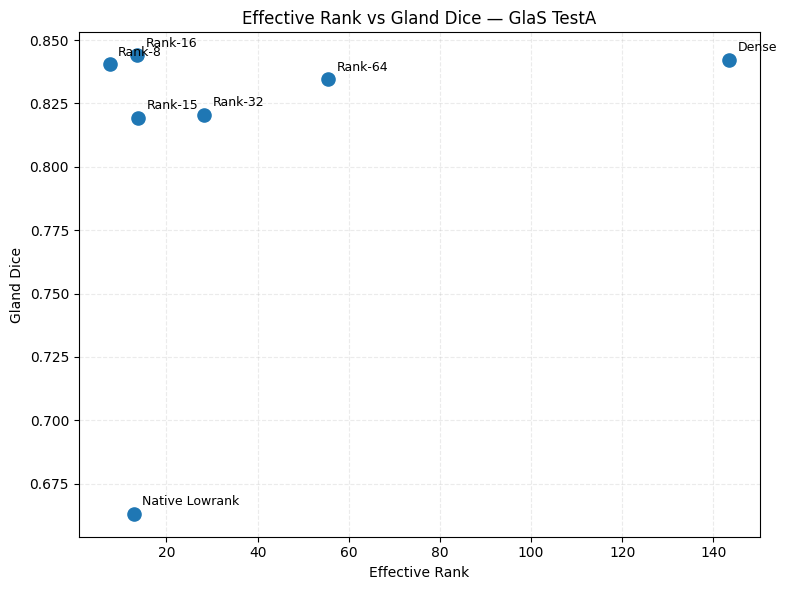

In [186]:
plt.figure(figsize=(8, 6))

plt.scatter(
    effective_rank,
    testA_dice,
    s=90
)

for x, y, name in zip(
    effective_rank,
    testA_dice,
    models
):
    plt.annotate(
        name,
        (x, y),
        xytext=(6, 6),
        textcoords="offset points",
        fontsize=9
    )

plt.xlabel("Effective Rank")
plt.ylabel("Gland Dice")
plt.title("Effective Rank vs Gland Dice — GlaS TestA")

plt.grid(
    alpha=0.25,
    linestyle="--"
)

plt.tight_layout()

plt.savefig(
    "glas_effective_rank_vs_dice_testA.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

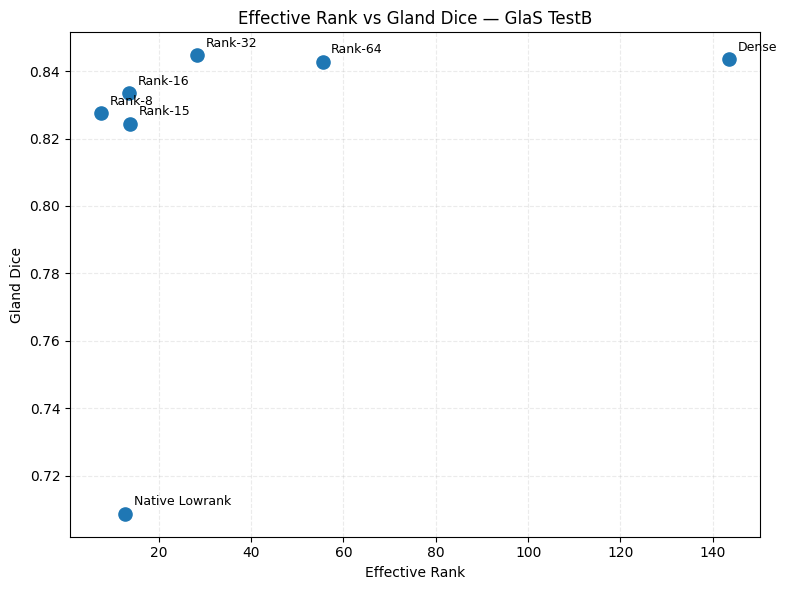

In [187]:
plt.figure(figsize=(8, 6))

plt.scatter(
    effective_rank,
    testB_dice,
    s=90
)

for x, y, name in zip(
    effective_rank,
    testB_dice,
    models
):
    plt.annotate(
        name,
        (x, y),
        xytext=(6, 6),
        textcoords="offset points",
        fontsize=9
    )

plt.xlabel("Effective Rank")
plt.ylabel("Gland Dice")
plt.title("Effective Rank vs Gland Dice — GlaS TestB")

plt.grid(
    alpha=0.25,
    linestyle="--"
)

plt.tight_layout()

plt.savefig(
    "glas_effective_rank_vs_dice_testB.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()

In [188]:
# Delta Fisher vs Delta Dice
def plot_fisher_dice(
    delta_fisher,
    delta_dice,
    title,
    filename
):

    valid = (
        np.isfinite(delta_fisher) &
        np.isfinite(delta_dice)
    )

    x = delta_fisher[valid]
    y = delta_dice[valid]

    r, p = pearsonr(x, y)
    rho, rho_p = spearmanr(x, y)

    slope, intercept = np.polyfit(
        x,
        y,
        1
    )

    x_line = np.linspace(
        x.min(),
        x.max(),
        100
    )

    y_line = (
        slope * x_line +
        intercept
    )

    plt.figure(figsize=(7, 6))

    plt.scatter(
        x,
        y,
        s=45,
        alpha=0.75
    )

    plt.plot(
        x_line,
        y_line,
        linestyle="--",
        linewidth=1.5
    )

    plt.axhline(
        0,
        linestyle=":",
        linewidth=1
    )

    plt.axvline(
        0,
        linestyle=":",
        linewidth=1
    )

    plt.text(
        0.05,
        0.95,
        f"Pearson r = {r:.3f}\n"
        f"Spearman ρ = {rho:.3f}\n"
        f"N = {len(x)}",
        transform=plt.gca().transAxes,
        verticalalignment="top",
        fontsize=10
    )

    plt.xlabel(
        "Δ Fisher separation\n"
        "(Rank-15 − Native Lowrank)"
    )

    plt.ylabel(
        "Δ Gland Dice\n"
        "(Rank-15 − Native Lowrank)"
    )

    plt.title(title)

    plt.grid(
        alpha=0.25,
        linestyle="--"
    )

    plt.tight_layout()

    plt.savefig(
        filename,
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()

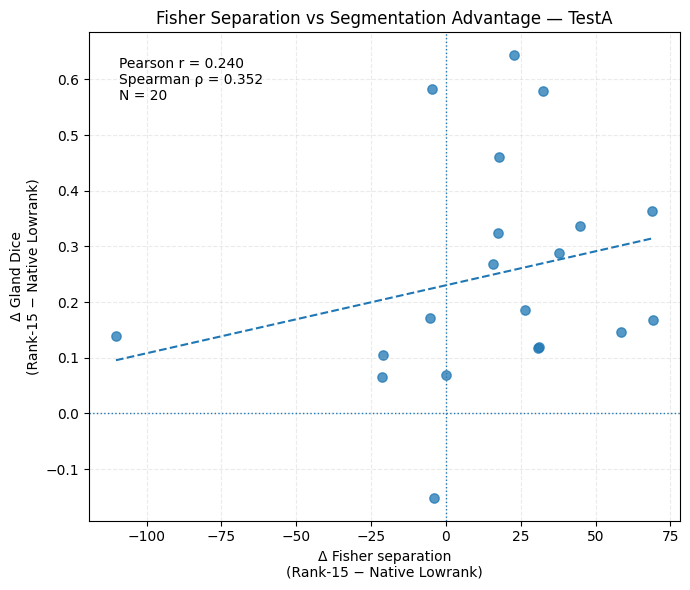

In [189]:
plot_fisher_dice(
    delta_fisher_A,
    delta_dice_A,
    "Fisher Separation vs Segmentation Advantage — TestA",
    "fisher_vs_dice_testA.png"
)

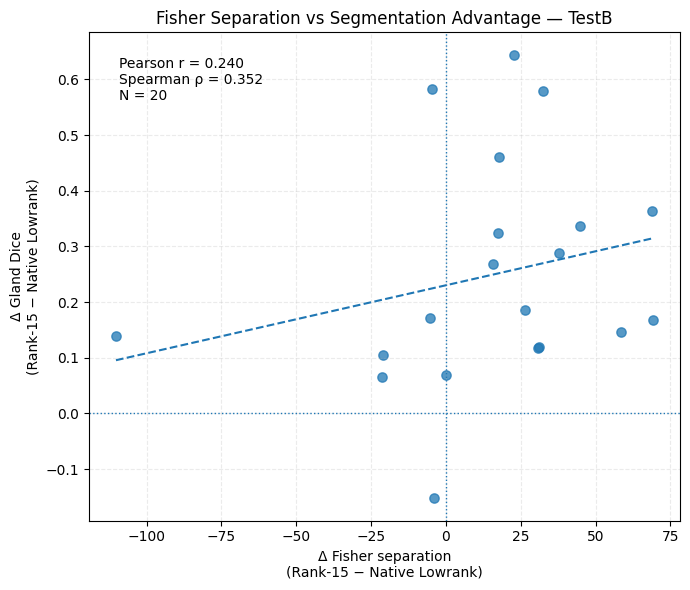

In [190]:
plot_fisher_dice(
    delta_fisher_B,
    delta_dice_B,
    "Fisher Separation vs Segmentation Advantage — TestB",
    "fisher_vs_dice_testB.png"
)